In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Hotel Booking Demand dataset

In [2]:
df = pd.read_csv('hotel_bookings.csv')
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [3]:
df.shape

(119390, 32)

In [4]:
df.duplicated().sum()

31994

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [6]:
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


# problem booking is_cancelled or Not : Target columnn is --> is_canceled

In [7]:
# Data  balence Check

df['is_canceled'].value_counts()

# Data is not balenced

,count
is_canceled,
0,75166
1,44224


In [8]:
df.isnull().sum()

,0
hotel,0
is_canceled,0
lead_time,0
arrival_date_year,0
arrival_date_month,0
arrival_date_week_number,0
arrival_date_day_of_month,0
stays_in_weekend_nights,0
stays_in_week_nights,0
adults,0


In [9]:
# Missing Percentage Check

total_missing = df['country'].isnull().sum()
missing_percentage = (total_missing / len(df)) * 100
missing_percentage

# minor values are missing. we fill later on

0.40874445095904177

In [10]:
# Missing Percentage Check

total_missing = df['agent'].isnull().sum()
missing_percentage = (total_missing / len(df)) * 100
missing_percentage

#  13 % values are missing. we fill later on

13.686238378423655

In [11]:
# Missing Percentage Check

total_missing = df['company'].isnull().sum()
missing_percentage = (total_missing / len(df)) * 100
missing_percentage

#  94 % values are missing. not usefull we delete this column  later on

94.30689337465449

In [12]:
 ''' summary 3 columns have more missing values
 many coulumns have 1 missing values
 and remaining columns have no missing values. '''

' summary 3 columns have more missing values\nmany coulumns have 1 missing values\nand remaining columns have no missing values. '

In [13]:
# duplicates values

df.duplicated().sum()

31994

In [14]:
df.sample()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
84524,City Hotel,0,1,2016,February,9,25,0,3,2,...,No Deposit,9.0,NaN,0,Transient-Party,100.0,0,0,Check-Out,2016-02-28


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [16]:
# Hotel column
df['hotel'].value_counts()

,count
hotel,
City Hotel,79330
Resort Hotel,40060


In [17]:


df['is_canceled'].value_counts()

,count
is_canceled,
0,75166
1,44224


In [18]:
# Get value counts for each column
value_counts = {col: df[col].value_counts() for col in df.columns}

# Print value counts
for col, counts in value_counts.items():
    print(f"Column: {col}")
    print(counts)
    print("-" * 50)




# Here i see many columns have categories data but data type is int .
# i perfom value count of whole data set columns instead of single column one by one


Column: hotel
hotel
City Hotel      79330
Resort Hotel    40060
Name: count, dtype: int64
--------------------------------------------------
Column: is_canceled
is_canceled
0    75166
1    44224
Name: count, dtype: int64
--------------------------------------------------
Column: lead_time
lead_time
0      6345
1      3460
2      2069
3      1816
4      1715
       ... 
400       1
370       1
532       1
371       1
463       1
Name: count, Length: 479, dtype: int64
--------------------------------------------------
Column: arrival_date_year
arrival_date_year
2016    56707
2017    40687
2015    21996
Name: count, dtype: int64
--------------------------------------------------
Column: arrival_date_month
arrival_date_month
August       13877
July         12661
May          11791
October      11160
April        11089
June         10939
September    10508
March         9794
February      8068
November      6794
December      6780
January       5929
Name: count, dtype: int64
---------------

# 2. Integer Columns (Categorical by Nature)
These columns have numerical data types but represent discrete categories:

arrival_date_year: Discrete years (e.g., 2016, 2017).

arrival_date_week_number: Weeks in a year (e.g., 1 to 52/53).

arrival_date_day_of_month: Days in a month (e.g., 1 to 31).

is_canceled: Binary (0 for not canceled, 1 for canceled).

is_repeated_guest: Binary (0 for no, 1 for yes).



In [19]:
df['assigned_room_type'].value_counts()

,count
assigned_room_type,
A,74053
D,25322
E,7806
F,3751
G,2553
C,2375
B,2163
H,712
I,363


In [20]:
# List of columns to convert to categorical
categorical_columns = [
    'hotel', 'arrival_date_year', 'arrival_date_month',
    'meal', 'country', 'market_segment', 'distribution_channel',
    'reserved_room_type', 'assigned_room_type', 'deposit_type',
    'customer_type', 'reservation_status', 'is_canceled',
    'is_repeated_guest', 'arrival_date_week_number',
    'arrival_date_day_of_month'
]

# Convert to categorical
for col in categorical_columns:
    df[col] = df[col].astype('category')




In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype   
---  ------                          --------------   -----   
 0   hotel                           119390 non-null  category
 1   is_canceled                     119390 non-null  category
 2   lead_time                       119390 non-null  int64   
 3   arrival_date_year               119390 non-null  category
 4   arrival_date_month              119390 non-null  category
 5   arrival_date_week_number        119390 non-null  category
 6   arrival_date_day_of_month       119390 non-null  category
 7   stays_in_weekend_nights         119390 non-null  int64   
 8   stays_in_week_nights            119390 non-null  int64   
 9   adults                          119390 non-null  int64   
 10  children                        119386 non-null  float64 
 11  babies                          119390 non-null  int64   
 12  me

In [22]:
df['reservation_status_date'].value_counts()

# issue is that this column is datetime need to convert date time

,count
reservation_status_date,
2015-10-21,1461
2015-07-06,805
2016-11-25,790
2015-01-01,763
2016-01-18,625
...,...
2015-02-27,1
2015-04-25,1
2015-03-11,1


In [23]:
#  Convert reservation_status_date to datetime
df['reservation_status_date'] = pd.to_datetime(df['reservation_status_date'])

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   hotel                           119390 non-null  category      
 1   is_canceled                     119390 non-null  category      
 2   lead_time                       119390 non-null  int64         
 3   arrival_date_year               119390 non-null  category      
 4   arrival_date_month              119390 non-null  category      
 5   arrival_date_week_number        119390 non-null  category      
 6   arrival_date_day_of_month       119390 non-null  category      
 7   stays_in_weekend_nights         119390 non-null  int64         
 8   stays_in_week_nights            119390 non-null  int64         
 9   adults                          119390 non-null  int64         
 10  children                        119386 non-null  float64

# EDA FOR NUMERICAL SINGLE COLUMN

## Lead Time

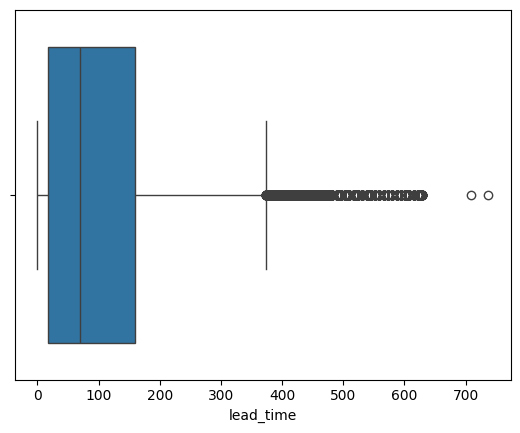

In [25]:
sns.boxplot(x ='lead_time' , data=df)
plt.show()

In [26]:


# Calculate Q1, Q3, and IQR
Q1 = df['lead_time'].quantile(0.25)
Q3 = df['lead_time'].quantile(0.75)
IQR = Q3 - Q1

# Define bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers = df[(df['lead_time'] < lower_bound) | (df['lead_time'] > upper_bound)]



# View the outliers
# print(outliers)

print("Number of outliers:", len(outliers))
print(f"Lower Bound: {lower_bound}, Upper Bound: {upper_bound}")
print(f"Number of Outliers: {outliers.shape[0]}")
df['lead_time'][(df['lead_time'] < lower_bound) | (df['lead_time'] > upper_bound)]


Number of outliers: 3005
Lower Bound: -195.0, Upper Bound: 373.0
Number of Outliers: 3005


,lead_time
1,737
225,394
890,460
1516,381
1672,382
...,...
119102,518
119107,518
119109,518
119111,518


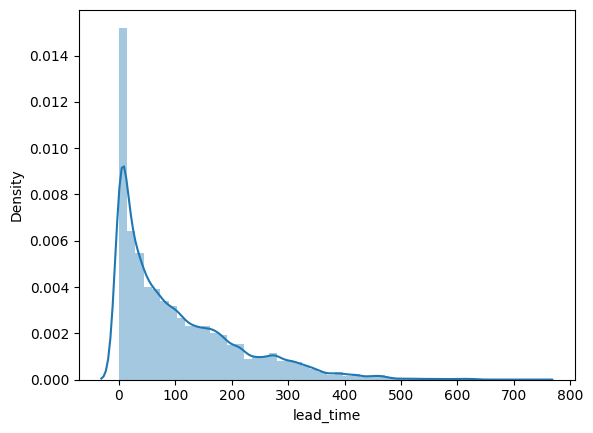

In [27]:
sns.distplot(df['lead_time'])
plt.show()

In [28]:
df['lead_time'].skew()
# positivly skewed

1.3465498727254268

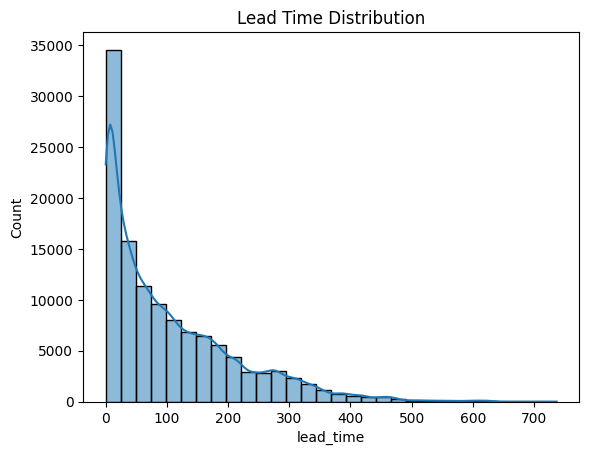

In [29]:
sns.histplot(df['lead_time'], kde=True, bins=30)
plt.title("Lead Time Distribution")
plt.show()

# stays_in_weekend_nights

In [30]:
df['stays_in_weekend_nights'].value_counts()

,count
stays_in_weekend_nights,
0,51998
2,33308
1,30626
4,1855
3,1259
6,153
5,79
8,60
7,19


In [31]:
df['stays_in_weekend_nights'].skew()

1.3800464497062852

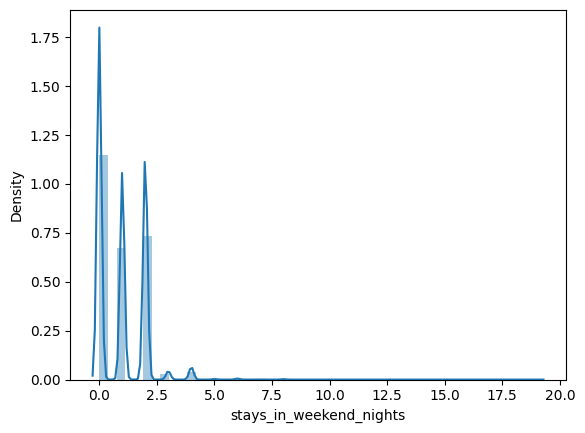

In [32]:
sns.distplot(df['stays_in_weekend_nights'])
plt.show()

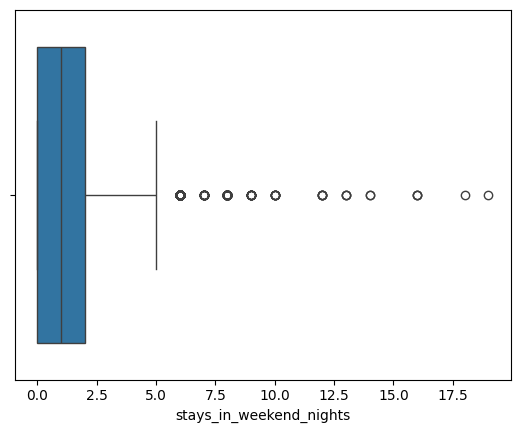

In [33]:
sns.boxplot(x ='stays_in_weekend_nights' , data=df)
plt.show()

In [34]:
Q1 = df['stays_in_weekend_nights'].quantile(0.25)
Q3 = df['stays_in_weekend_nights'].quantile(0.75)
IQR = Q3 - Q1
print("IQR:" ,IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print("Lower Bound:", lower_bound)
print("Upper Bound:", upper_bound)
df['stays_in_weekend_nights'][(df['stays_in_weekend_nights'] < lower_bound) | (df['stays_in_weekend_nights'] > upper_bound)]

IQR: 2.0
Lower Bound: -3.0
Upper Bound: 5.0


,stays_in_weekend_nights
87,6
1149,6
1655,13
1754,6
1790,8
...,...
103282,9
105050,6
106335,6
106561,13


# stays_in_week_nights

In [35]:
df['stays_in_week_nights'].value_counts()

,count
stays_in_week_nights,
2,33684
1,30310
3,22258
5,11077
4,9563
0,7645
6,1499
10,1036
7,1029


In [36]:
df['stays_in_week_nights'].skew()

2.862249242067124

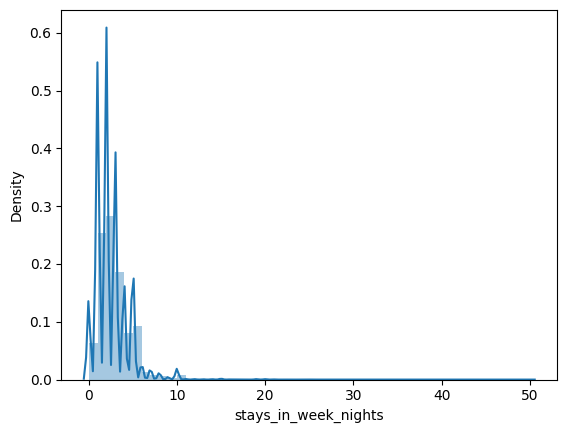

In [37]:
sns.distplot(df['stays_in_week_nights'])
plt.show()

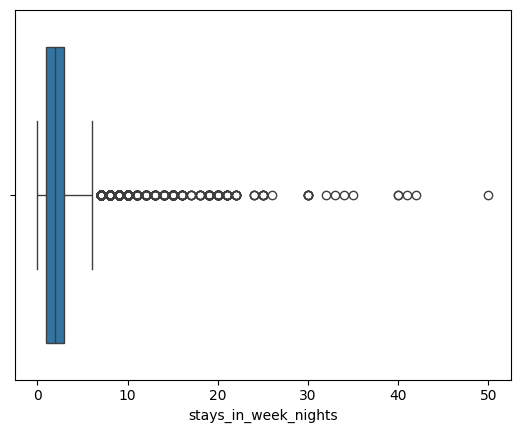

In [38]:
sns.boxplot(x ='stays_in_week_nights' , data=df)
plt.show()

In [39]:
Q1 = df['stays_in_week_nights'].quantile(0.25)
Q3 = df['stays_in_week_nights'].quantile(0.75)
IQR = Q3 - Q1
print("IQR:" ,IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print("Lower Bound:", lower_bound)
print("Upper Bound:", upper_bound)
df['stays_in_week_nights'][(df['stays_in_week_nights'] < lower_bound) | (df['stays_in_week_nights'] > upper_bound)]

IQR: 2.0
Lower Bound: -2.0
Upper Bound: 6.0


,stays_in_week_nights
30,10
31,11
32,8
51,8
52,10
...,...
119255,7
119260,8
119292,8
119369,7


# adults

In [40]:
df['adults'].value_counts()

,count
adults,
2,89680
1,23027
3,6202
0,403
4,62
26,5
27,2
20,2
5,2


In [41]:
df['adults'].skew()

18.317804759206094

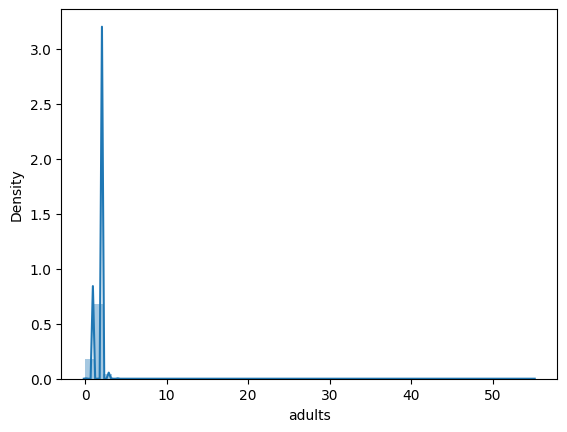

In [42]:
sns.distplot(df['adults'])
plt.show()

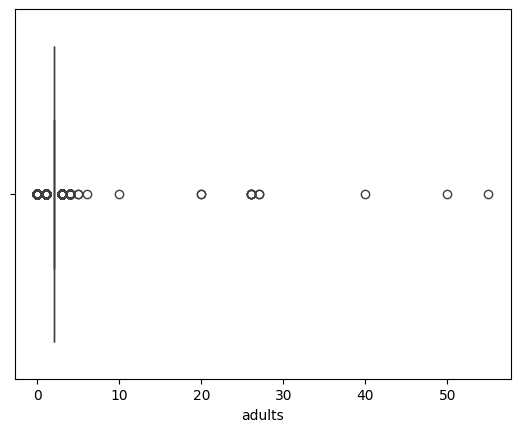

In [43]:
sns.boxplot(x ='adults' , data=df)
plt.show()

In [44]:
Q1 = df['adults'].quantile(0.25)
Q3 = df['adults'].quantile(0.75)
IQR = Q3 - Q1
print("IQR:" ,IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print("Lower Bound:", lower_bound)
print("Upper Bound:", upper_bound)
df['adults'][(df['adults'] < lower_bound) | (df['adults'] > upper_bound)]

IQR: 0.0
Lower Bound: 2.0
Upper Bound: 2.0


,adults
2,1
3,1
20,1
30,1
34,3
...,...
119372,1
119373,1
119376,3
119382,3


# children

In [45]:
df['children'].value_counts()

,count
children,
0.0,110796
1.0,4861
2.0,3652
3.0,76
10.0,1


In [46]:
df['children'].skew()

4.11258954232252

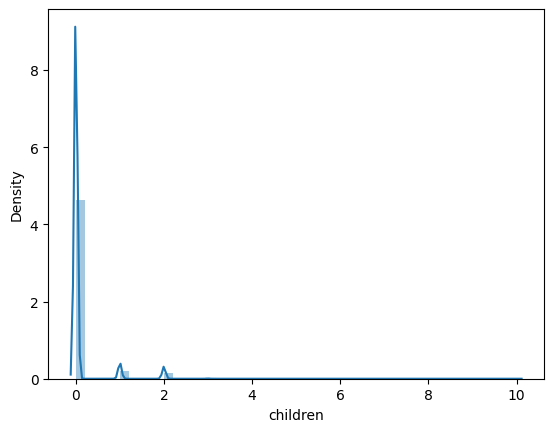

In [47]:
sns.distplot(df['children'])
plt.show()

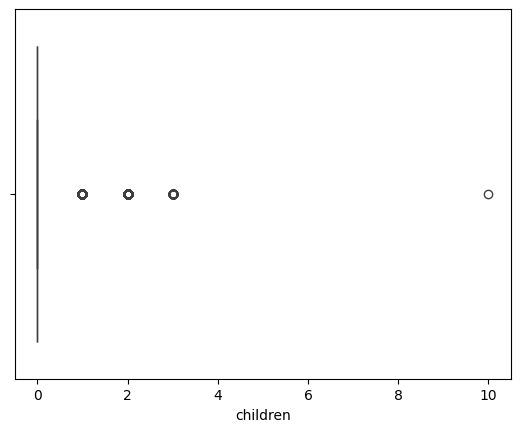

In [48]:
sns.boxplot(x ='children' , data=df)
plt.show()

In [49]:
Q1 = df['children'].quantile(0.25)
Q3 = df['children'].quantile(0.75)
IQR = Q3 - Q1
print("IQR:" ,IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print("Lower Bound:", lower_bound)
print("Upper Bound:", upper_bound)
df['children'][(df['children'] < lower_bound) | (df['children'] > upper_bound)]

IQR: 0.0
Lower Bound: 0.0
Upper Bound: 0.0


,children
13,1.0
45,2.0
55,2.0
65,2.0
87,1.0
...,...
119270,1.0
119287,1.0
119293,2.0
119318,1.0


# babies

In [50]:
df['babies'].value_counts()

,count
babies,
0,118473
1,900
2,15
10,1
9,1


In [51]:
df['babies'].skew()

24.646544829663075

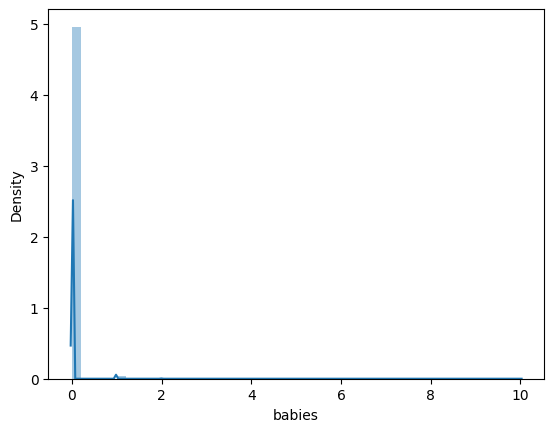

In [52]:
sns.distplot(df['babies'])
plt.show()

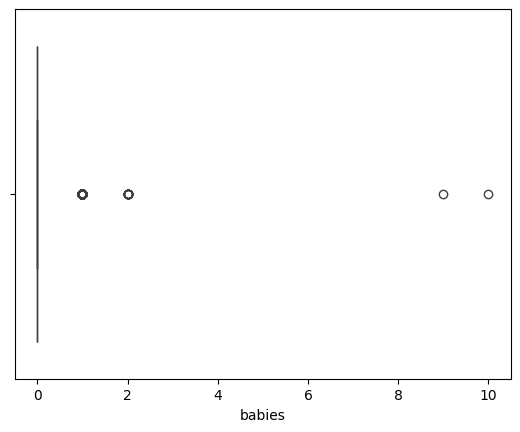

In [53]:
sns.boxplot(x ='babies' , data=df)
plt.show()

In [54]:
Q1 = df['babies'].quantile(0.25)
Q3 = df['babies'].quantile(0.75)
IQR = Q3 - Q1
print("IQR:" ,IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print("Lower Bound:", lower_bound)
print("Upper Bound:", upper_bound)

df['babies'][(df['babies'] < lower_bound) | (df['babies'] > upper_bound)]

IQR: 0.0
Lower Bound: 0.0
Upper Bound: 0.0


,babies
109,1
111,1
165,1
236,1
264,2
...,...
118437,1
118571,1
118794,1
119098,1


# previous_cancellations

In [55]:
df['previous_cancellations'].value_counts()

,count
previous_cancellations,
0,112906
1,6051
2,116
3,65
24,48
11,35
4,31
26,26
25,25


In [56]:
df['previous_cancellations'].skew()

24.458048723119287

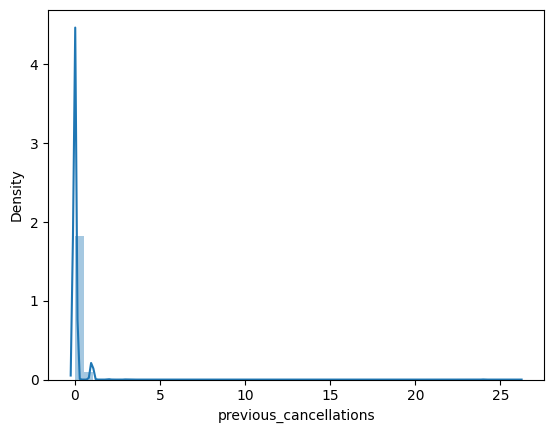

In [57]:
sns.distplot(df['previous_cancellations'])
plt.show()

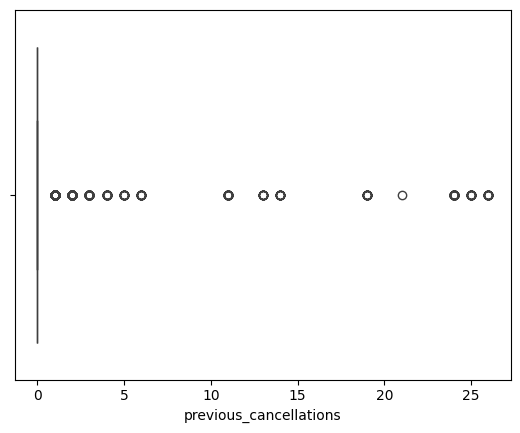

In [58]:
sns.boxplot(x ='previous_cancellations' , data=df)
plt.show()

In [59]:
Q1 = df['previous_cancellations'].quantile(0.25)
Q3 = df['previous_cancellations'].quantile(0.75)
IQR = Q3 - Q1
print("IQR:" ,IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print("Lower Bound:", lower_bound)
print("Upper Bound:", upper_bound)
df['previous_cancellations'][(df['previous_cancellations'] < lower_bound) | (df['previous_cancellations'] > upper_bound)]

IQR: 0.0
Lower Bound: 0.0
Upper Bound: 0.0


,previous_cancellations
13805,1
13811,1
13825,1
13826,1
13827,1
...,...
111356,1
111357,1
111358,1
111359,1


# previous_bookings_not_canceled

In [60]:
df['previous_bookings_not_canceled'].value_counts()

,count
previous_bookings_not_canceled,
0,115770
1,1542
2,580
3,333
4,229
...,...
47,1
49,1
50,1


In [61]:
df['previous_bookings_not_canceled'].skew()

23.53979995284346

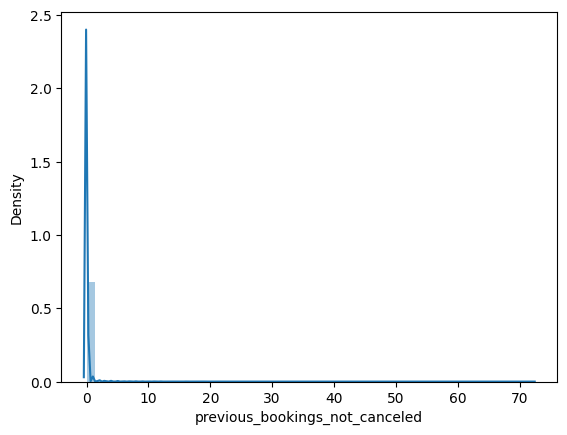

In [62]:
sns.distplot(df['previous_bookings_not_canceled'])
plt.show()

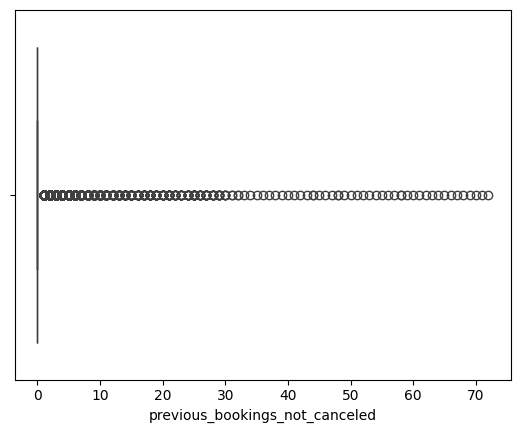

In [63]:
sns.boxplot(x ='previous_bookings_not_canceled' , data=df)
plt.show()

In [64]:
Q1 = df['previous_bookings_not_canceled'].quantile(0.25)
Q3 = df['previous_bookings_not_canceled'].quantile(0.75)
IQR = Q3 - Q1
print("IQR:" ,IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print("Lower Bound:", lower_bound)
print("Upper Bound:", upper_bound)
df['previous_bookings_not_canceled'][(df['previous_bookings_not_canceled'] < lower_bound) | (df['previous_bookings_not_canceled'] > upper_bound)]

IQR: 0.0
Lower Bound: 0.0
Upper Bound: 0.0


,previous_bookings_not_canceled
13803,1
13804,2
13805,3
13808,1
13811,1
...,...
117424,1
117841,1
118581,1
118651,1


In [65]:
6484 + 3620

10104

# 21  booking_changes

In [66]:
df['booking_changes'].value_counts()

,count
booking_changes,
0,101314
1,12701
2,3805
3,927
4,376
5,118
6,63
7,31
8,17


In [67]:
df['booking_changes'].skew()

6.00027005440932

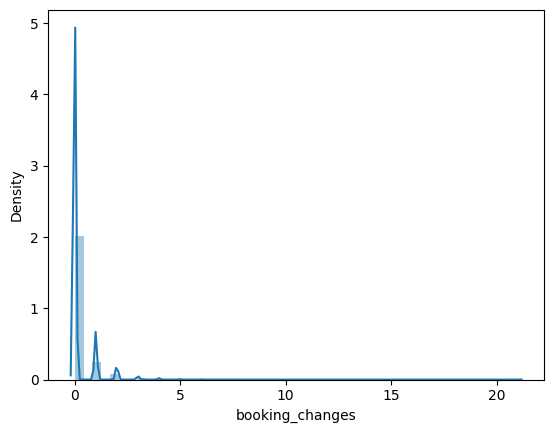

In [68]:
sns.distplot(df['booking_changes'])
plt.show()

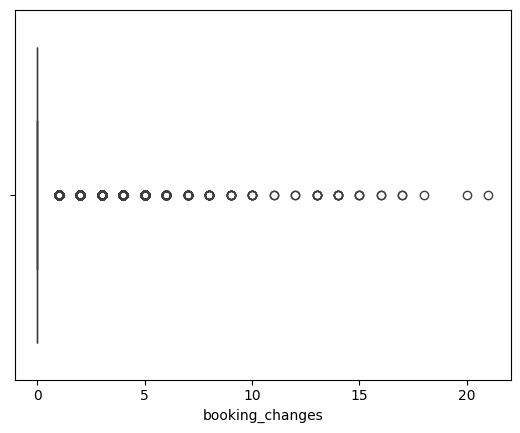

In [69]:
sns.boxplot(x ='booking_changes' , data=df)
plt.show()

In [70]:
Q1 = df['booking_changes'].quantile(0.25)
Q3 = df['booking_changes'].quantile(0.75)
IQR = Q3 - Q1
print("IQR:" ,IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print("Lower Bound:", lower_bound)
print("Upper Bound:", upper_bound)
df['booking_changes'][(df['booking_changes'] < lower_bound) | (df['booking_changes'] > upper_bound)]


IQR: 0.0
Lower Bound: 0.0
Upper Bound: 0.0


,booking_changes
0,3
1,4
13,1
21,1
22,1
...,...
119355,1
119356,3
119359,1
119362,2


# agent

In [71]:
df['agent'].value_counts()

,count
agent,
9.0,31961
240.0,13922
1.0,7191
14.0,3640
7.0,3539
...,...
289.0,1
432.0,1
265.0,1


In [72]:
df['agent'].skew()

1.089385636108877

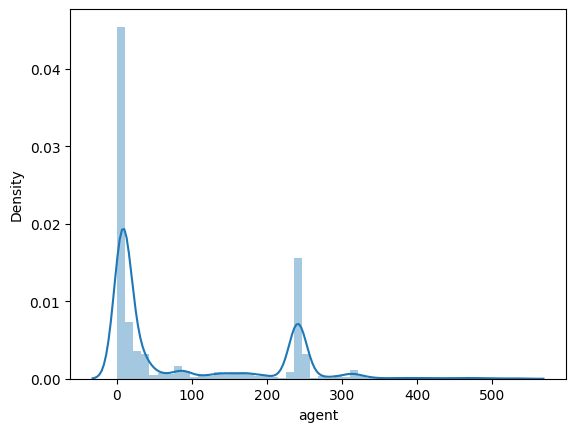

In [73]:
sns.distplot(df['agent'])
plt.show()

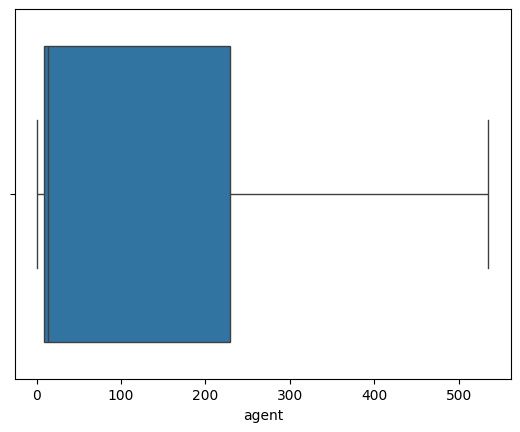

In [74]:
sns.boxplot(x ='agent' , data=df)
plt.show()

In [75]:
Q1 = df['agent'].quantile(0.25)
Q3 = df['agent'].quantile(0.75)
IQR = Q3 - Q1
print("IQR:" ,IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print("Lower Bound:", lower_bound)
print("Upper Bound:", upper_bound)
df['agent'][(df['agent'] < lower_bound) | (df['agent'] > upper_bound)]

IQR: 220.0
Lower Bound: -321.0
Upper Bound: 559.0


,agent


# days_in_waiting_list

In [76]:
df['days_in_waiting_list'].value_counts()

,count
days_in_waiting_list,
0,115692
39,227
58,164
44,141
31,127
...,...
116,1
109,1
37,1


In [77]:
df['days_in_waiting_list'].skew()

11.944353446438399

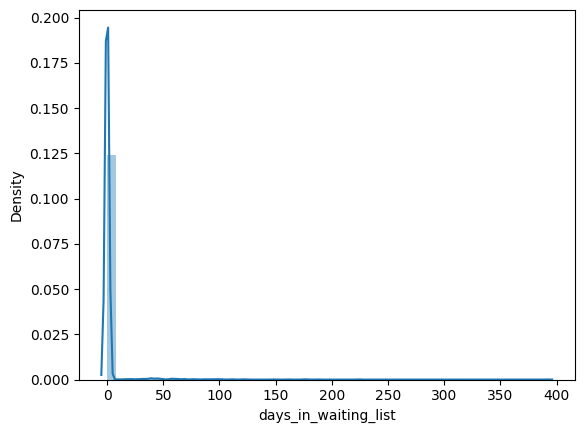

In [78]:
sns.distplot(df['days_in_waiting_list'])
plt.show()

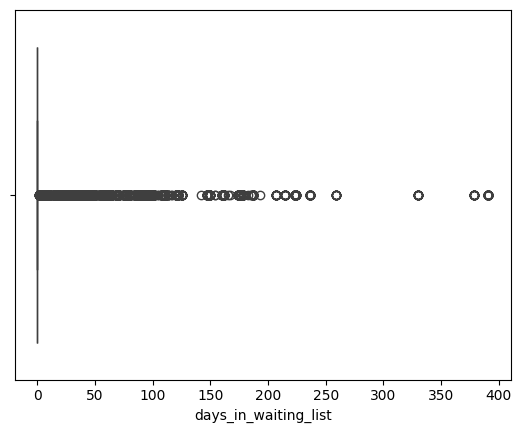

In [79]:
sns.boxplot(x ='days_in_waiting_list' , data=df)
plt.show()

In [80]:
Q1 = df['days_in_waiting_list'].quantile(0.25)
Q3 = df['days_in_waiting_list'].quantile(0.75)
IQR = Q3 - Q1
print("IQR:" ,IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print("Lower Bound:", lower_bound)
print("Upper Bound:", upper_bound)
df['days_in_waiting_list'][(df['days_in_waiting_list'] < lower_bound) | (df['days_in_waiting_list'] > upper_bound)]

IQR: 0.0
Lower Bound: 0.0
Upper Bound: 0.0


,days_in_waiting_list
2272,50
2486,47
2487,47
2488,47
2490,47
...,...
111978,36
112021,9
112822,98
114733,59


# adr

In [81]:
df['adr'].value_counts()

,count
adr,
62.00,3754
75.00,2715
90.00,2473
65.00,2418
0.00,1959
...,...
89.43,1
63.07,1
55.69,1


In [82]:
df['adr'].skew()

10.53021398218952

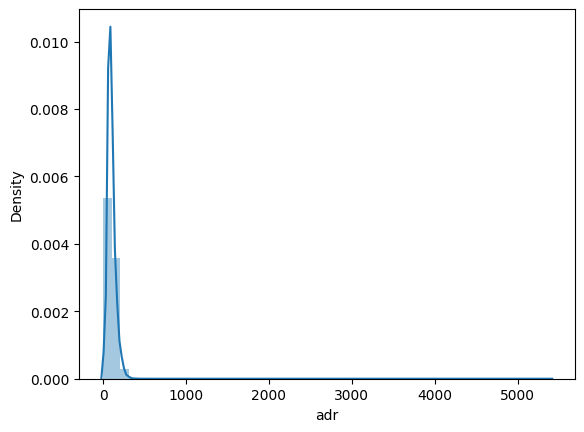

In [83]:
sns.distplot(df['adr'])
plt.show()

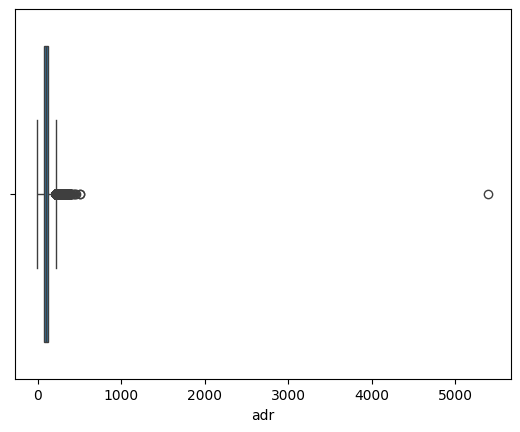

In [84]:
sns.boxplot(x ='adr' , data=df)
plt.show()

In [85]:
Q1 = df['adr'].quantile(0.25)
Q3 = df['adr'].quantile(0.75)
IQR = Q3 - Q1
print("IQR:" ,IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print("Lower Bound:", lower_bound)
print("Upper Bound:", upper_bound)
df['adr'][(df['adr'] < lower_bound) | (df['adr'] > upper_bound)]

IQR: 56.709999999999994
Lower Bound: -15.774999999999991
Upper Bound: 211.065


,adr
140,225.00
303,213.75
396,230.67
412,216.13
523,249.00
...,...
119251,235.00
119289,236.33
119339,229.00
119365,266.75


# required_car_parking_spaces

In [86]:
df['required_car_parking_spaces'].value_counts()

,count
required_car_parking_spaces,
0,111974
1,7383
2,28
3,3
8,2


In [87]:
df['required_car_parking_spaces'].skew()

4.163233237874088

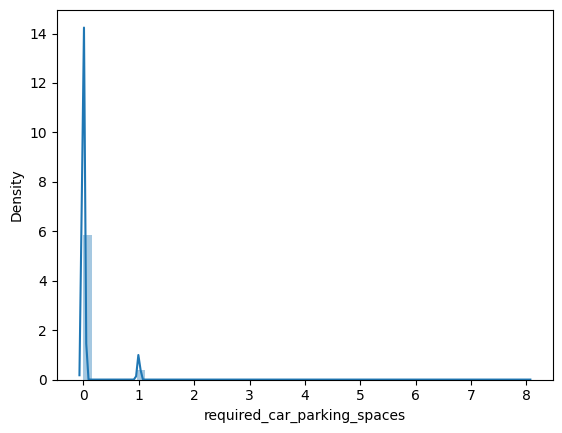

In [88]:
sns.distplot(df['required_car_parking_spaces'])
plt.show()

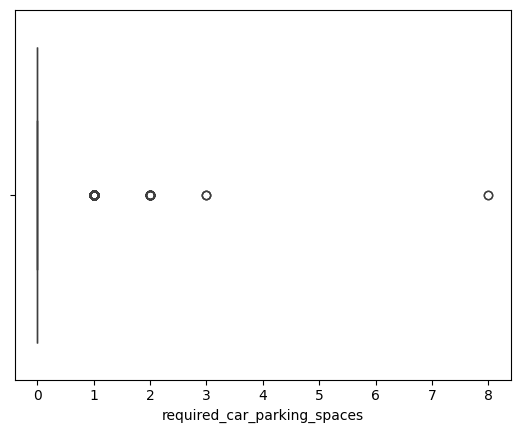

In [89]:
sns.boxplot(x ='required_car_parking_spaces' , data=df)
plt.show()

In [90]:
Q1 = df['required_car_parking_spaces'].quantile(0.25)
Q3 = df['required_car_parking_spaces'].quantile(0.75)
IQR = Q3 - Q1
print("IQR:" ,IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print("Lower Bound:", lower_bound)
print("Upper Bound:", upper_bound)
df['required_car_parking_spaces'][(df['required_car_parking_spaces'] < lower_bound) | (df['required_car_parking_spaces'] > upper_bound)]

IQR: 0.0
Lower Bound: 0.0
Upper Bound: 0.0


,required_car_parking_spaces
25,1
29,1
53,1
54,1
55,1
...,...
119158,1
119198,1
119236,1
119281,1


#  total_of_special_requests

In [91]:
df['total_of_special_requests'].value_counts()

,count
total_of_special_requests,
0,70318
1,33226
2,12969
3,2497
4,340
5,40


In [92]:
df['total_of_special_requests'].skew()

1.3491893774222594

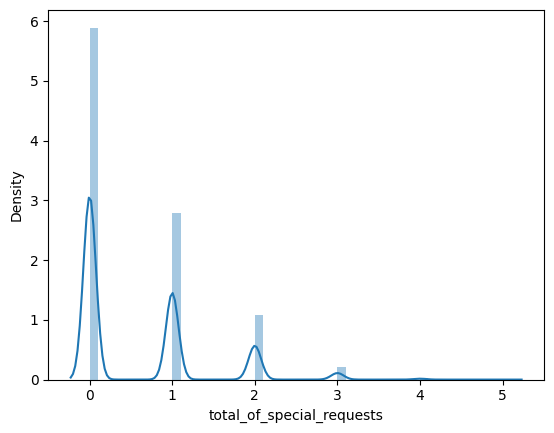

In [93]:
sns.distplot(df['total_of_special_requests'])
plt.show()

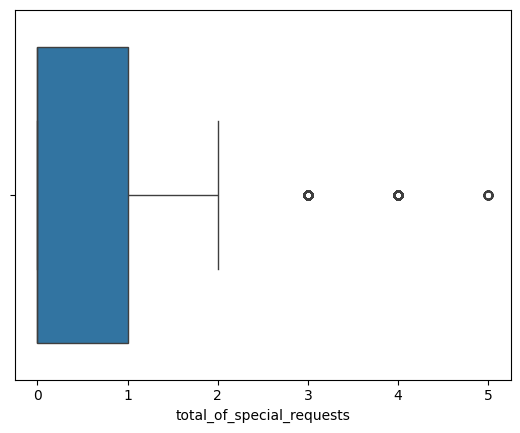

In [94]:
sns.boxplot(x ='total_of_special_requests' , data=df)
plt.show()

In [95]:
Q1 = df['total_of_special_requests'].quantile(0.25)
Q3 = df['total_of_special_requests'].quantile(0.75)
IQR = Q3 - Q1
print("IQR:" ,IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print("Lower Bound:", lower_bound)
print("Upper Bound:", upper_bound)
df['total_of_special_requests'][(df['total_of_special_requests'] < lower_bound) | (df['total_of_special_requests'] > upper_bound)]

IQR: 1.0
Lower Bound: -1.5
Upper Bound: 2.5


,total_of_special_requests
12,3
15,3
198,3
200,3
228,3
...,...
119293,3
119334,4
119350,3
119376,3


# EDA RESULT OF NUMERICAL DATA
almost all columns are positive skewed and have outliers. wo remove outliers in preprocessing part

In [96]:
df.select_dtypes(include=['int64', 'float64']).columns

Index(['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights',
       'adults', 'children', 'babies', 'previous_cancellations',
       'previous_bookings_not_canceled', 'booking_changes', 'agent', 'company',
       'days_in_waiting_list', 'adr', 'required_car_parking_spaces',
       'total_of_special_requests'],
      dtype='object')

In [97]:
len(df.select_dtypes(include=['int64', 'float64']).columns)

15

# EDA FOR CATEGORICAL DATA

In [98]:
categorical_columns = df.select_dtypes(include=['object','category']).columns.tolist()
categorical_columns

['hotel',
 'is_canceled',
 'arrival_date_year',
 'arrival_date_month',
 'arrival_date_week_number',
 'arrival_date_day_of_month',
 'meal',
 'country',
 'market_segment',
 'distribution_channel',
 'is_repeated_guest',
 'reserved_room_type',
 'assigned_room_type',
 'deposit_type',
 'customer_type',
 'reservation_status']

In [99]:
len(categorical_columns)

16

In [100]:
# Unique values for each column
for col in categorical_columns:
    print(f"Column: {col}")
    print(df[col].value_counts())
    print("-" * 50)


Column: hotel
hotel
City Hotel      79330
Resort Hotel    40060
Name: count, dtype: int64
--------------------------------------------------
Column: is_canceled
is_canceled
0    75166
1    44224
Name: count, dtype: int64
--------------------------------------------------
Column: arrival_date_year
arrival_date_year
2016    56707
2017    40687
2015    21996
Name: count, dtype: int64
--------------------------------------------------
Column: arrival_date_month
arrival_date_month
August       13877
July         12661
May          11791
October      11160
April        11089
June         10939
September    10508
March         9794
February      8068
November      6794
December      6780
January       5929
Name: count, dtype: int64
--------------------------------------------------
Column: arrival_date_week_number
arrival_date_week_number
33    3580
30    3087
32    3045
34    3040
18    2926
21    2854
28    2853
17    2805
20    2785
29    2763
42    2756
31    2741
41    2699
15    2689
27

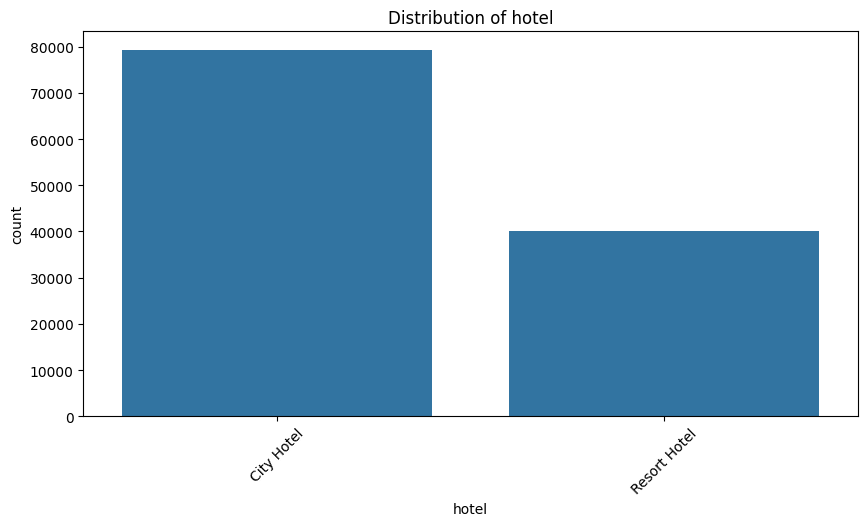

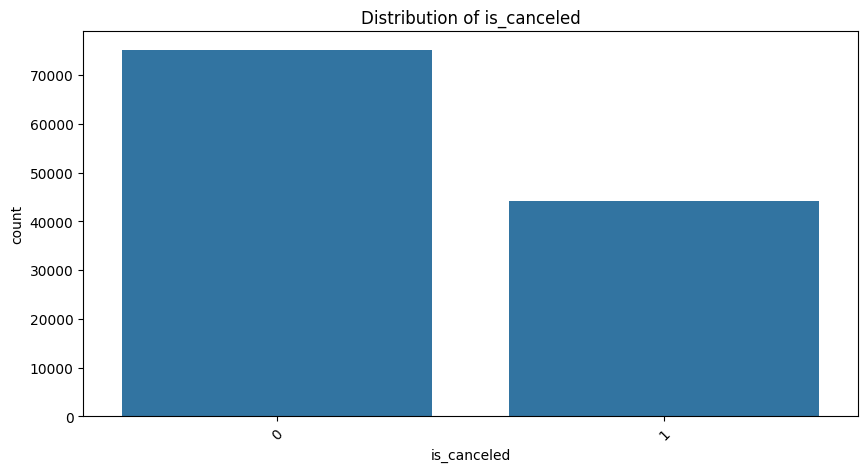

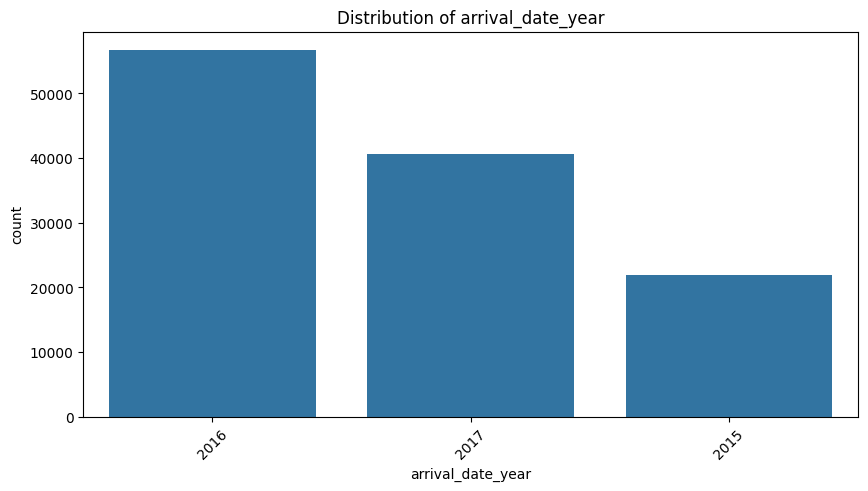

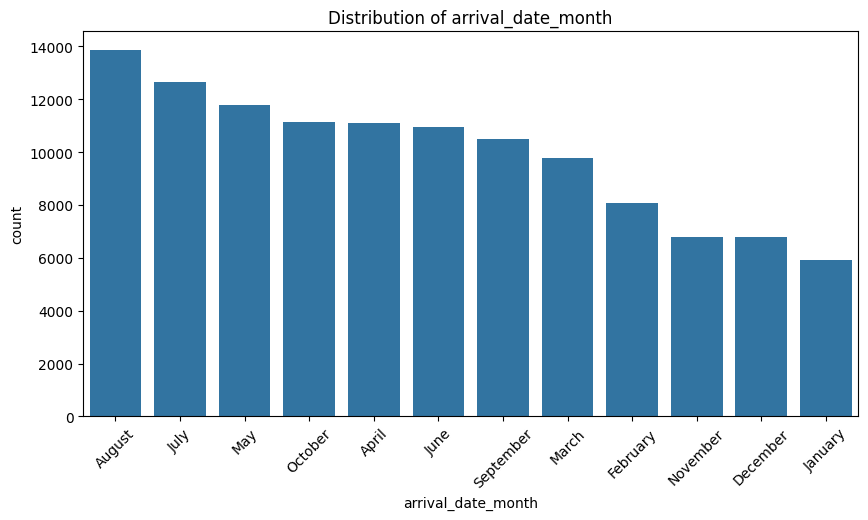

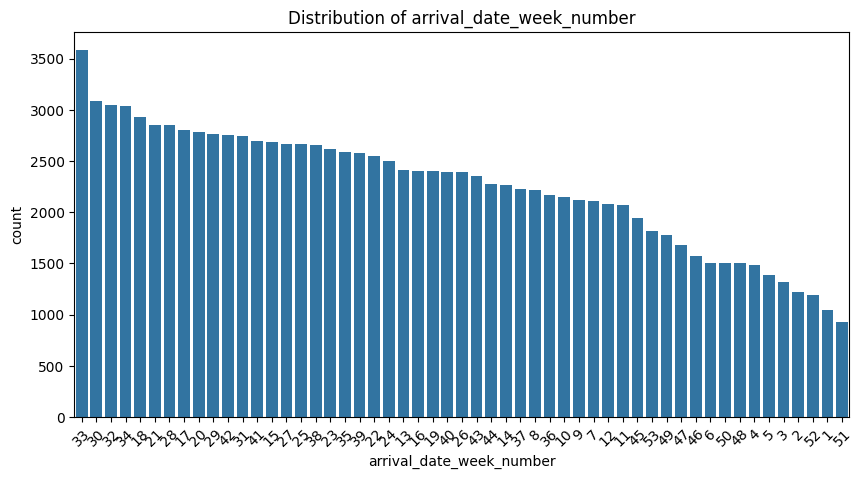

...

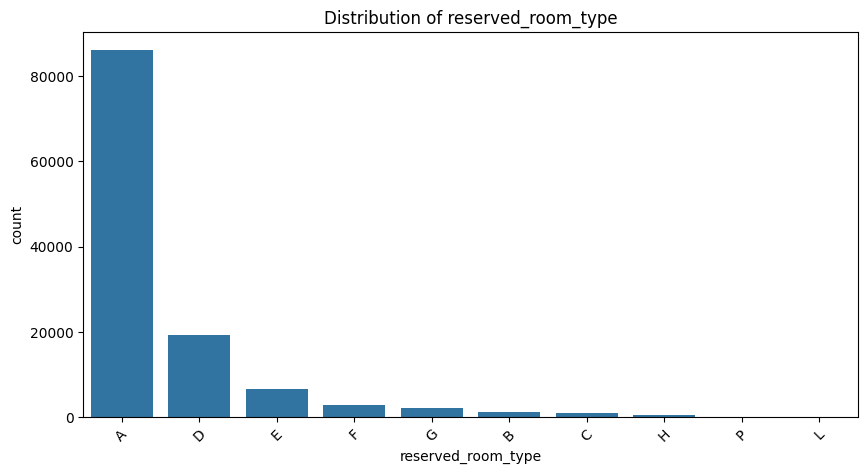

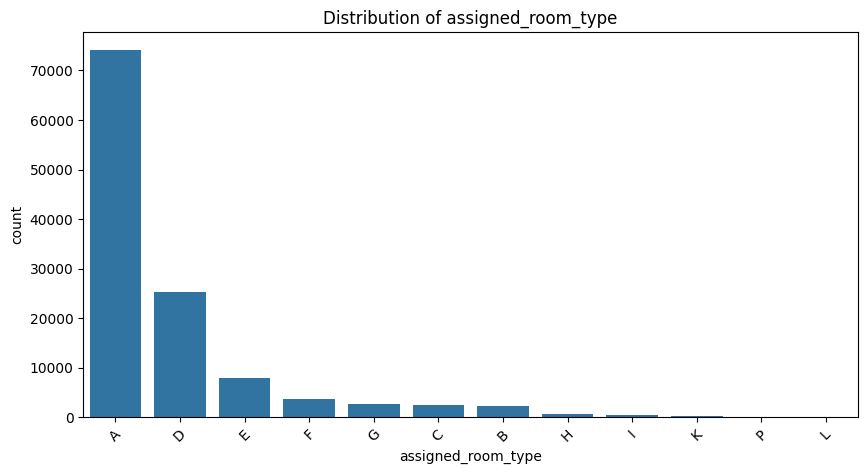

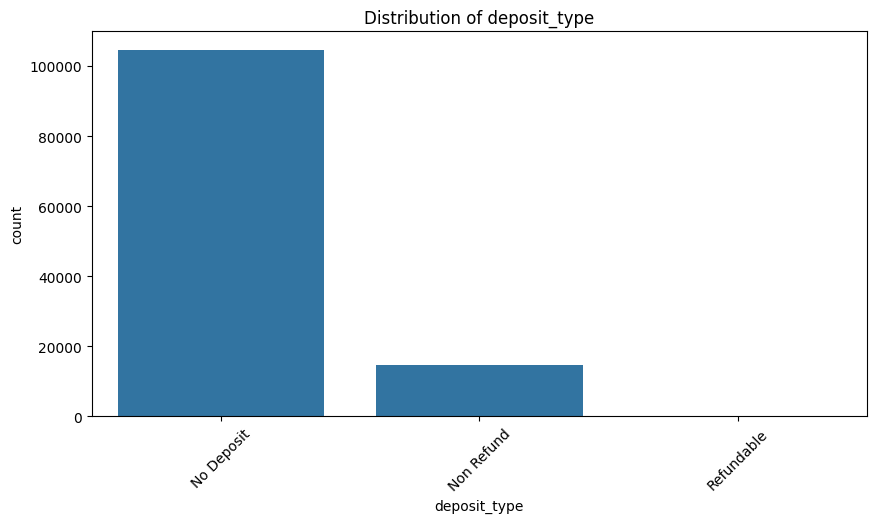

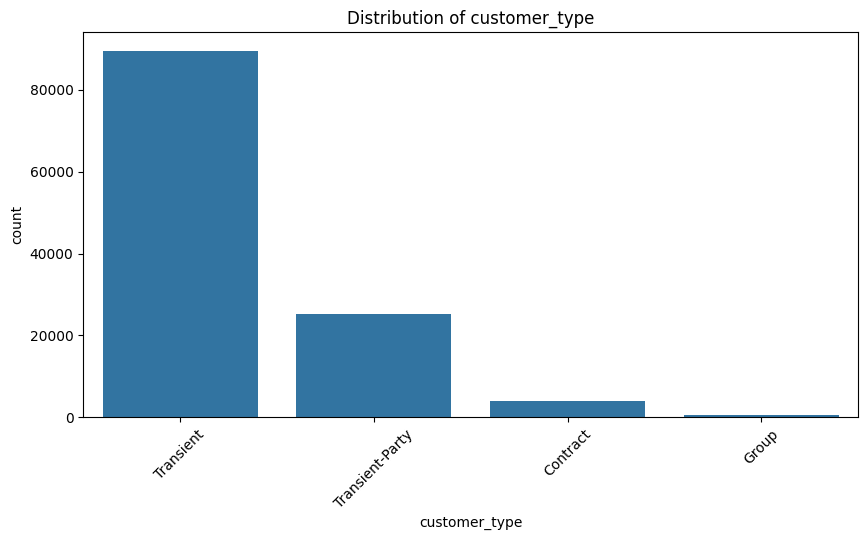

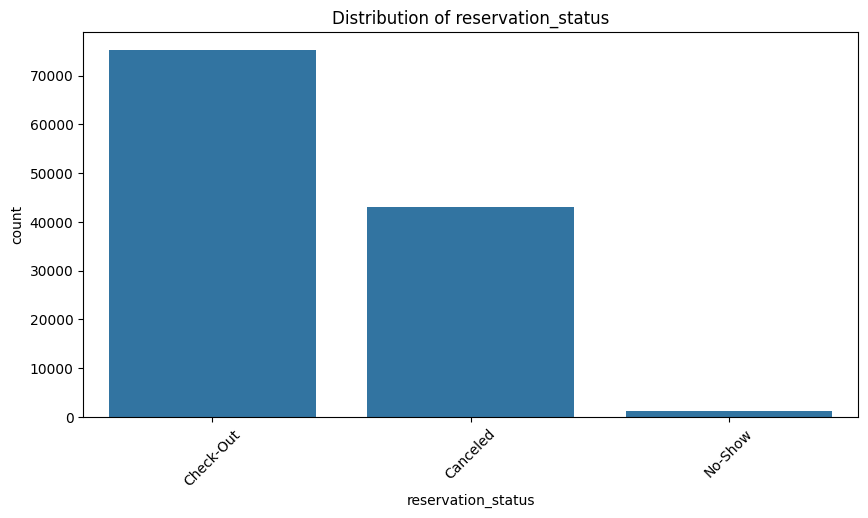

In [101]:
# Visualize the Distribution of Categorical Variables

for col in categorical_columns:
    plt.figure(figsize=(10, 5))
    sns.countplot(data=df, x=col, order=df[col].value_counts().index)
    plt.title(f"Distribution of {col}")
    plt.xticks(rotation=45)
    plt.show()

--- Analyzing Column: hotel ---
Rare categories in 'hotel': []



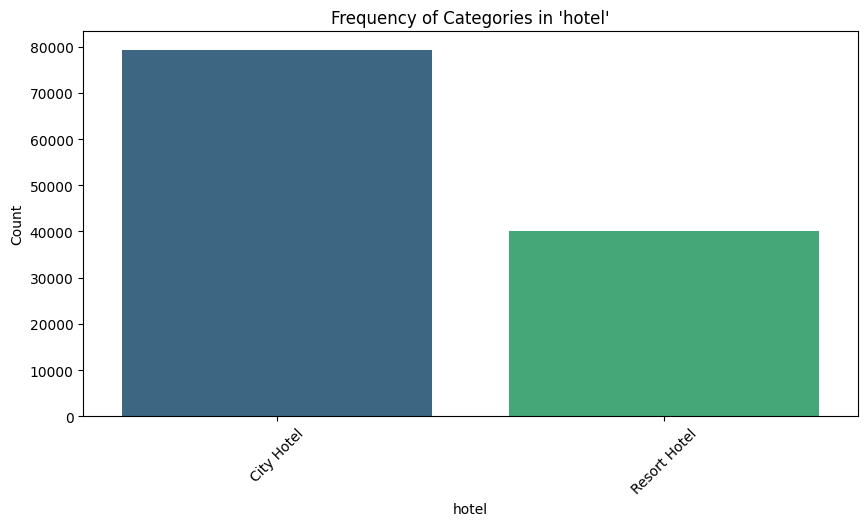

--- Analyzing Column: is_canceled ---
Rare categories in 'is_canceled': []



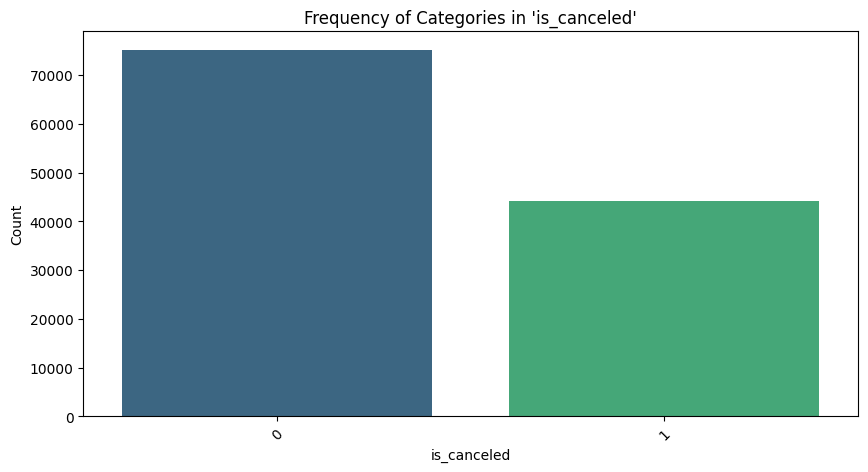

--- Analyzing Column: arrival_date_year ---
Rare categories in 'arrival_date_year': []



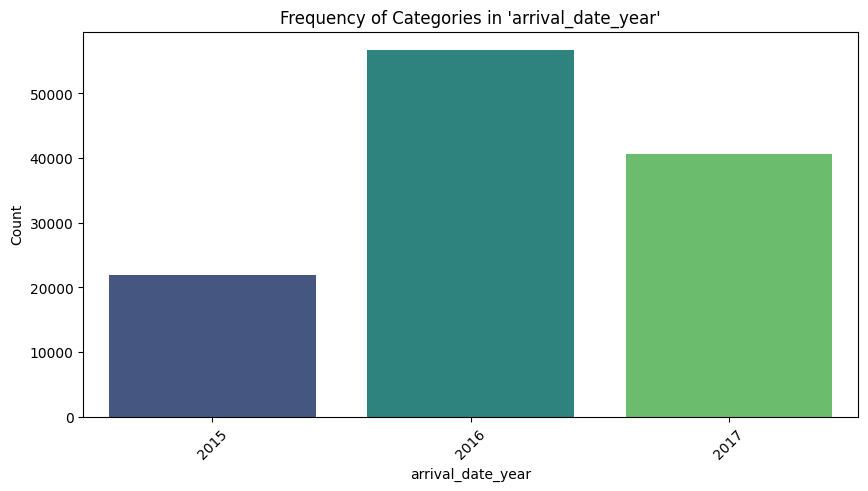

--- Analyzing Column: arrival_date_month ---
Rare categories in 'arrival_date_month': []



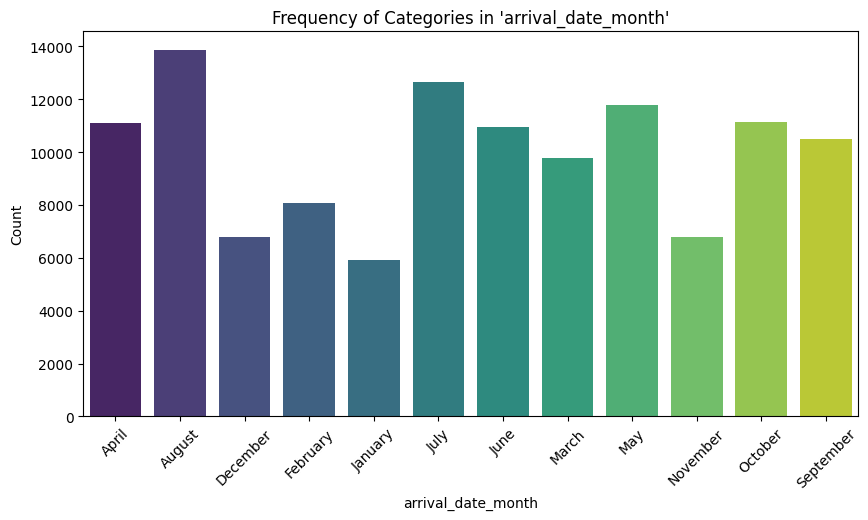

--- Analyzing Column: arrival_date_week_number ---
Rare categories in 'arrival_date_week_number': [1, 51]



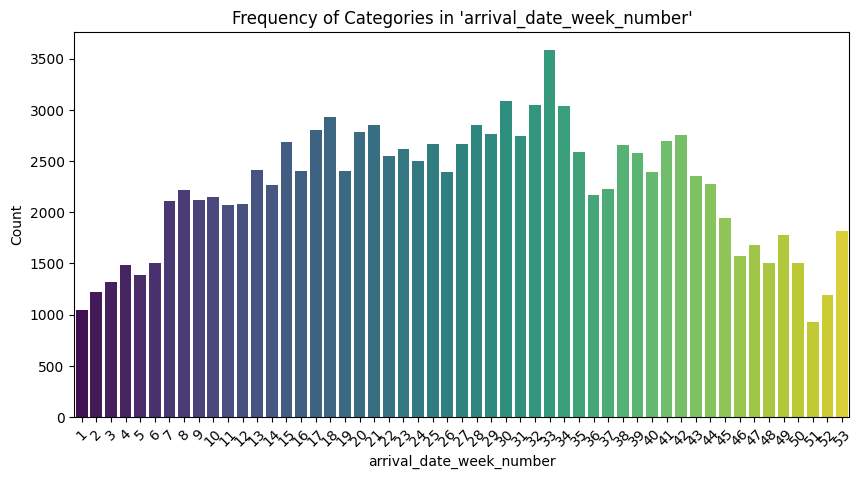

--- Analyzing Column: arrival_date_day_of_month ---
Rare categories in 'arrival_date_day_of_month': []



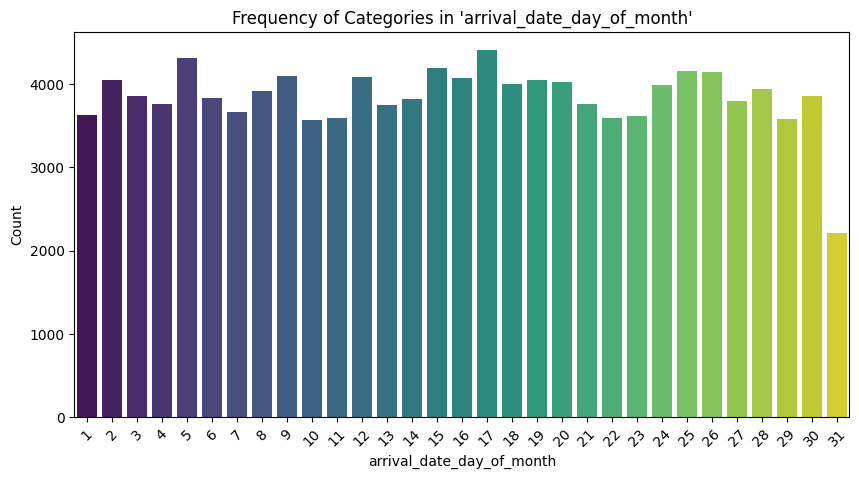

--- Analyzing Column: meal ---
Rare categories in 'meal': ['Undefined', 'FB']



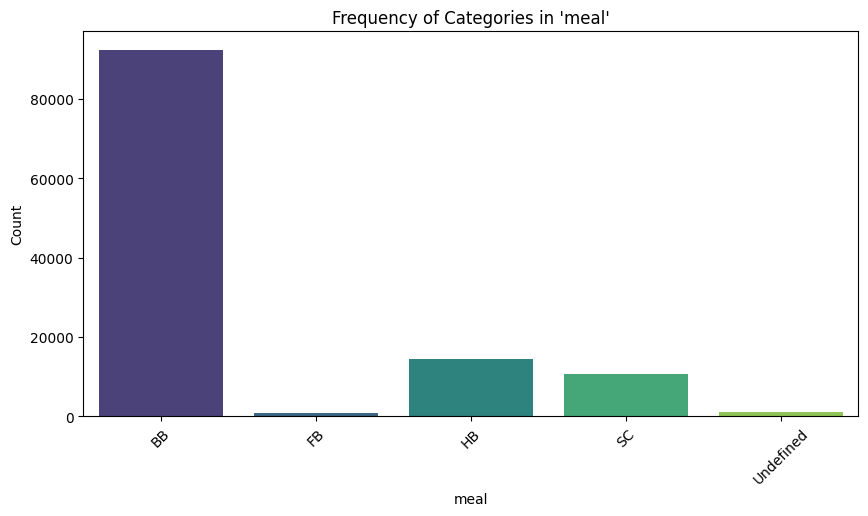

--- Analyzing Column: country ---
Rare categories in 'country': ['SWE', 'CHN', 'POL', 'ISR', 'RUS', 'NOR', 'ROU', 'FIN', 'DNK', 'AUS', 'AGO', 'LUX', 'MAR', 'TUR', 'HUN', 'ARG', 'JPN', 'CZE', 'IND', 'KOR', 'GRC', 'DZA', 'SRB', 'HRV', 'MEX', 'EST', 'IRN', 'LTU', 'ZAF', 'BGR', 'NZL', 'COL', 'UKR', 'MOZ', 'SVK', 'CHL', 'THA', 'ISL', 'SVN', 'LVA', 'ARE', 'TWN', 'CYP', 'SAU', 'PHL', 'TUN', 'SGP', 'IDN', 'NGA', 'URY', 'EGY', 'LBN', 'HKG', 'PER', 'MYS', 'ECU', 'VEN', 'BLR', 'CPV', 'GEO', 'JOR', 'CRI', 'KAZ', 'GIB', 'OMN', 'MLT', 'AZE', 'MAC', 'KWT', 'QAT', 'IRQ', 'PAK', 'DOM', 'BIH', 'MDV', 'BGD', 'PRI', 'ALB', 'SEN', 'MKD', 'BOL', 'CMR', 'TJK', 'PAN', 'GNB', 'CUB', 'JEY', 'ARM', 'VNM', 'LBY', 'LKA', 'AND', 'MUS', 'JAM', 'KEN', 'CIV', 'TZA', 'CAF', 'SUR', 'BHR', 'FRO', 'MNE', 'ZWE', 'GHA', 'GTM', 'UZB', 'BRB', 'GAB', 'PRY', 'MCO', 'SYR', 'TMP', 'GGY', 'ETH', 'LIE', 'BEN', 'TGO', 'RWA', 'STP', 'SYC', 'UGA', 'ZMB', 'SLV', 'ABW', 'IMN', 'MWI', 'ATA', 'COM', 'GLP', 'KNA', 'LAO', 'KHM', 'MYT', 'SLE

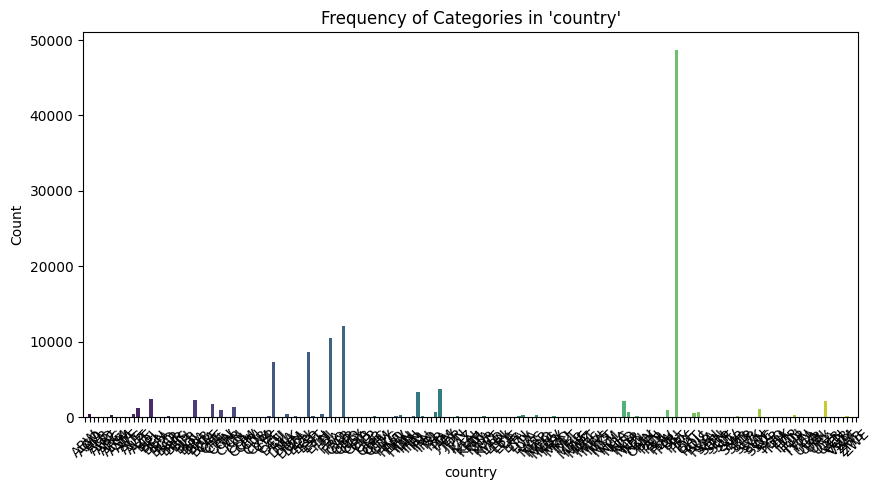

--- Analyzing Column: market_segment ---
Rare categories in 'market_segment': ['Complementary', 'Aviation', 'Undefined']



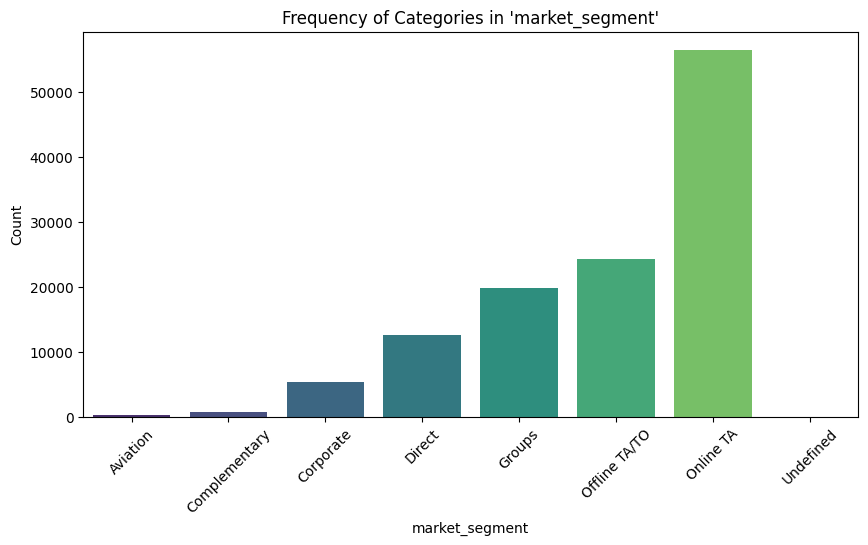

--- Analyzing Column: distribution_channel ---
Rare categories in 'distribution_channel': ['GDS', 'Undefined']



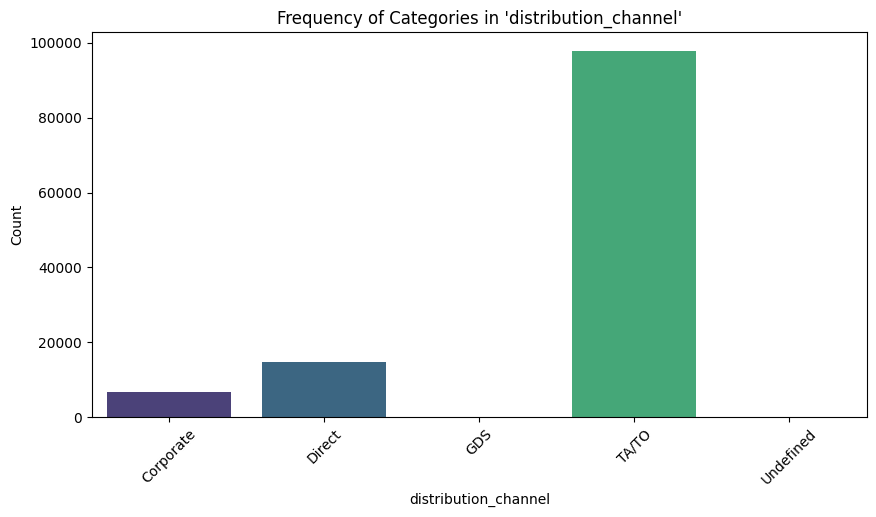

--- Analyzing Column: is_repeated_guest ---
Rare categories in 'is_repeated_guest': []



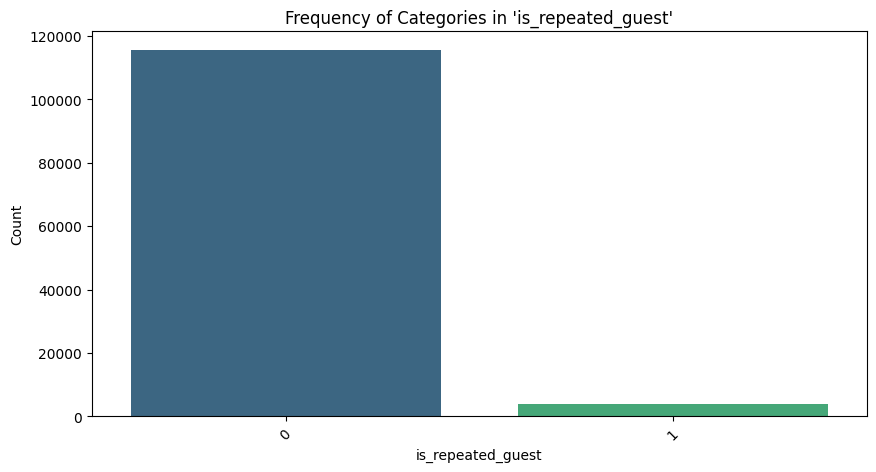

--- Analyzing Column: reserved_room_type ---
Rare categories in 'reserved_room_type': ['B', 'C', 'H', 'P', 'L']



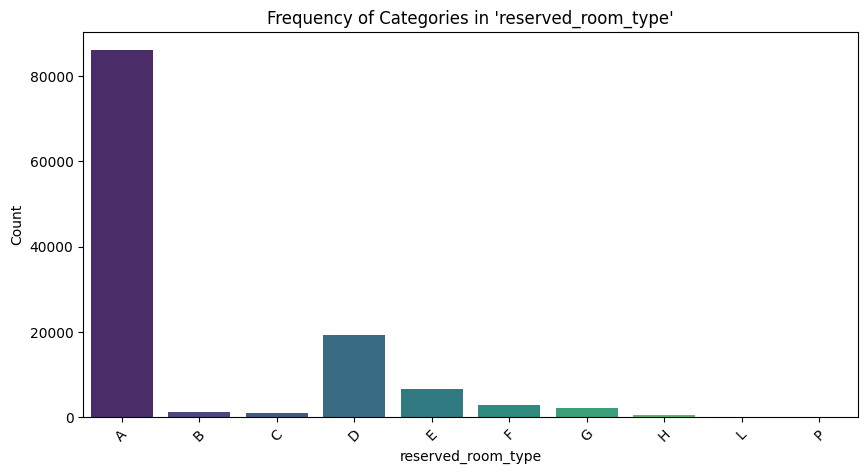

--- Analyzing Column: assigned_room_type ---
Rare categories in 'assigned_room_type': ['H', 'I', 'K', 'P', 'L']



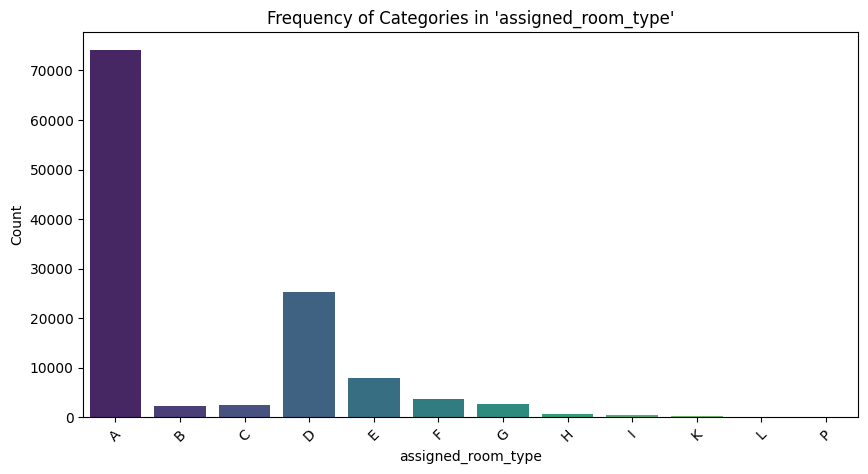

--- Analyzing Column: deposit_type ---
Rare categories in 'deposit_type': ['Refundable']



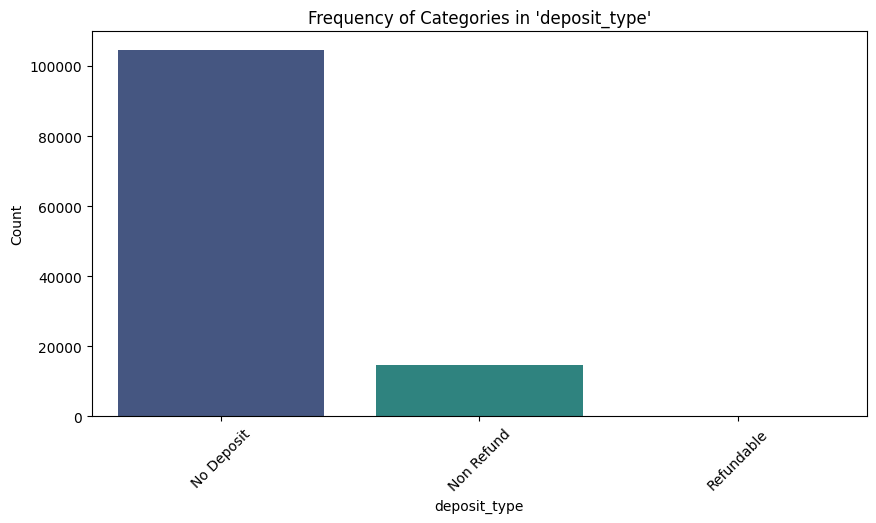

--- Analyzing Column: customer_type ---
Rare categories in 'customer_type': ['Group']



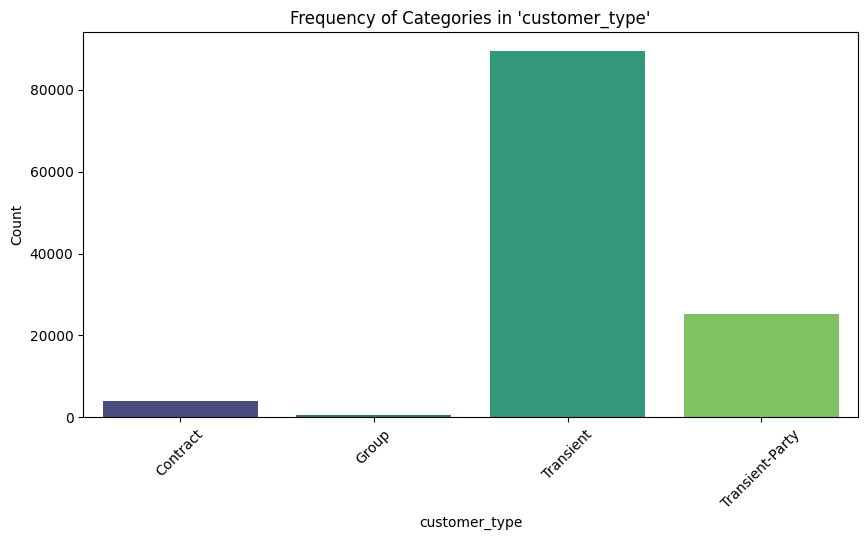

--- Analyzing Column: reservation_status ---
Rare categories in 'reservation_status': []



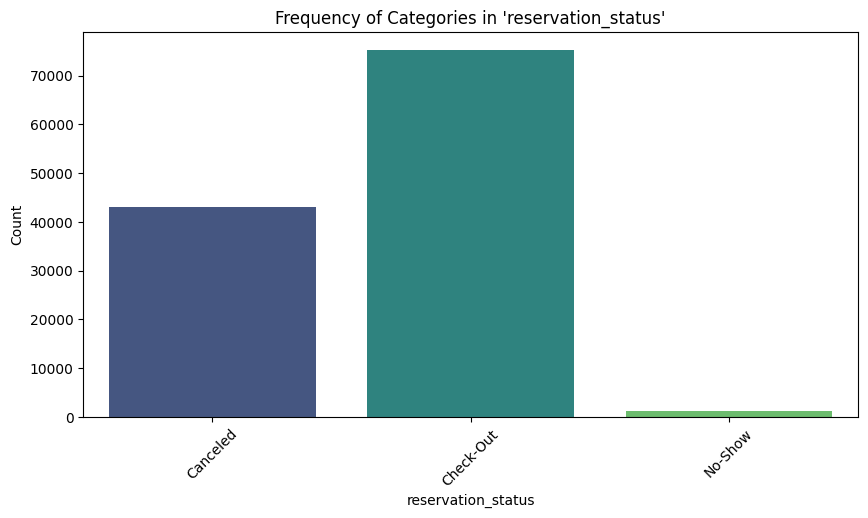

In [102]:


# Define a threshold for rare categories (e.g., less than 1% of total data)
threshold = 0.01 * len(df)

# Loop through each categorical column
for col in categorical_columns:
    print(f"--- Analyzing Column: {col} ---")

    # Get value counts
    total_counts = df[col].value_counts()

    # Identify rare categories
    rare_categories = total_counts[total_counts < threshold].index
    print(f"Rare categories in '{col}': {list(rare_categories)}\n")

    # Visualize category distribution
    plt.figure(figsize=(10, 5))
    sns.barplot(x=total_counts.index, y=total_counts.values, palette='viridis')
    plt.title(f"Frequency of Categories in '{col}'")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.xticks(rotation=45)
    plt.show()




--- Analyzing Column: hotel ---
Outlier categories in 'hotel': []



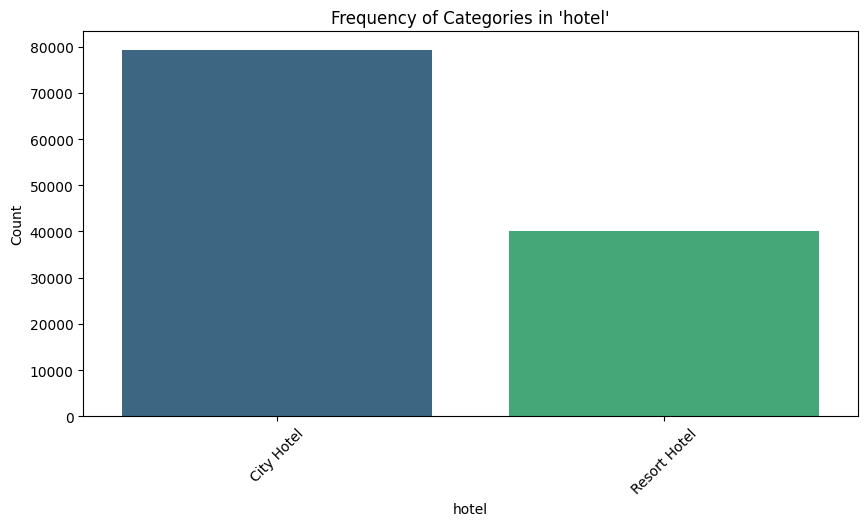

--- Analyzing Column: is_canceled ---
Outlier categories in 'is_canceled': []



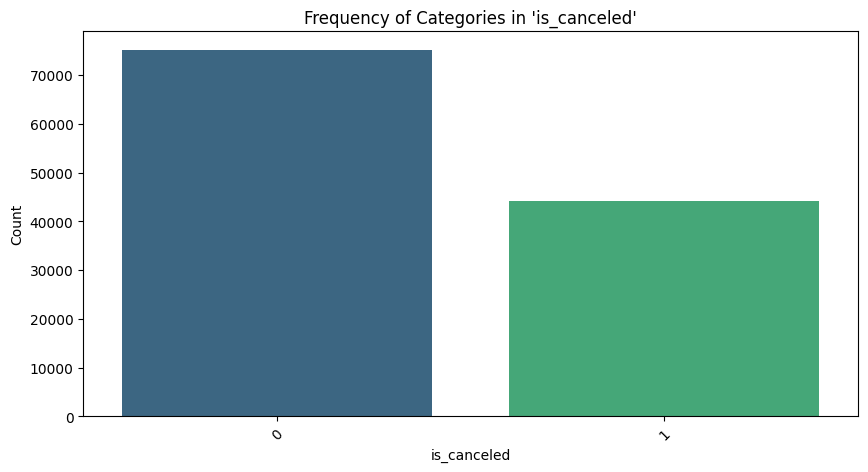

--- Analyzing Column: arrival_date_year ---
Outlier categories in 'arrival_date_year': []



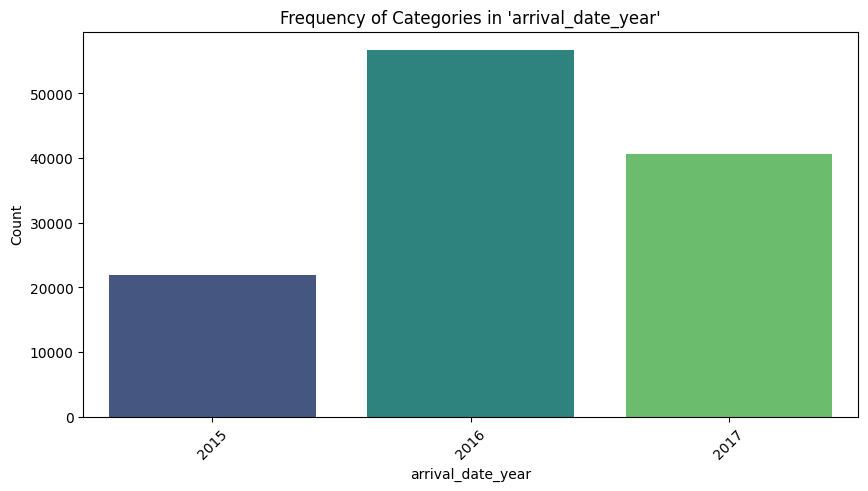

--- Analyzing Column: arrival_date_month ---
Outlier categories in 'arrival_date_month': []



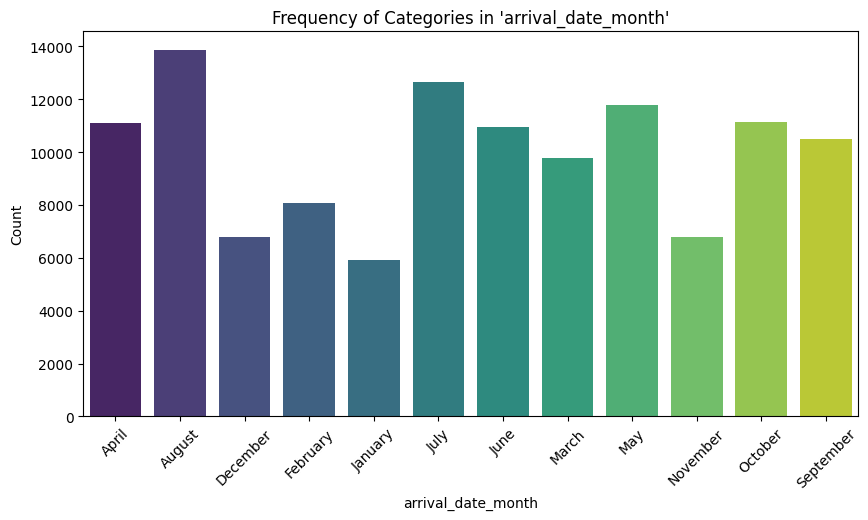

--- Analyzing Column: arrival_date_week_number ---
Outlier categories in 'arrival_date_week_number': []



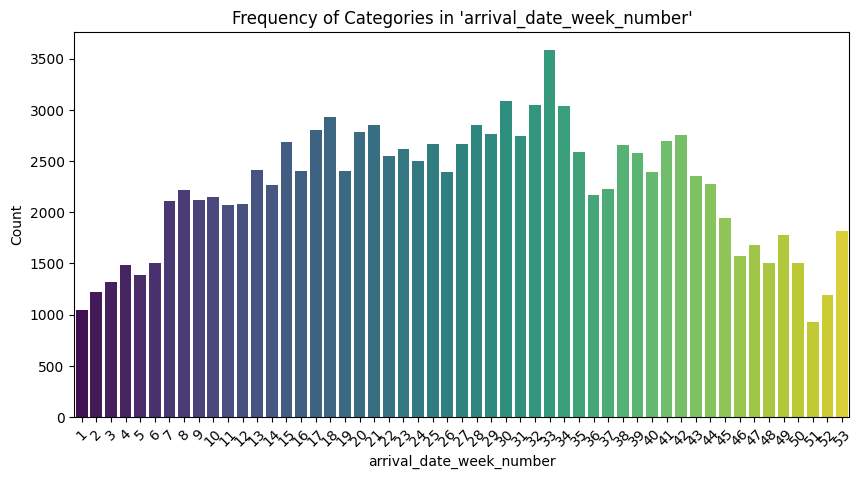

--- Analyzing Column: arrival_date_day_of_month ---
Outlier categories in 'arrival_date_day_of_month': [31]



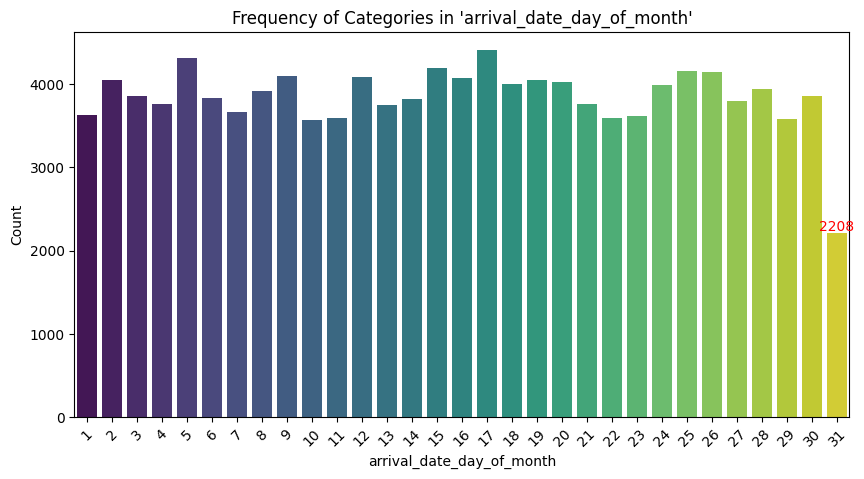

--- Analyzing Column: meal ---
Outlier categories in 'meal': []



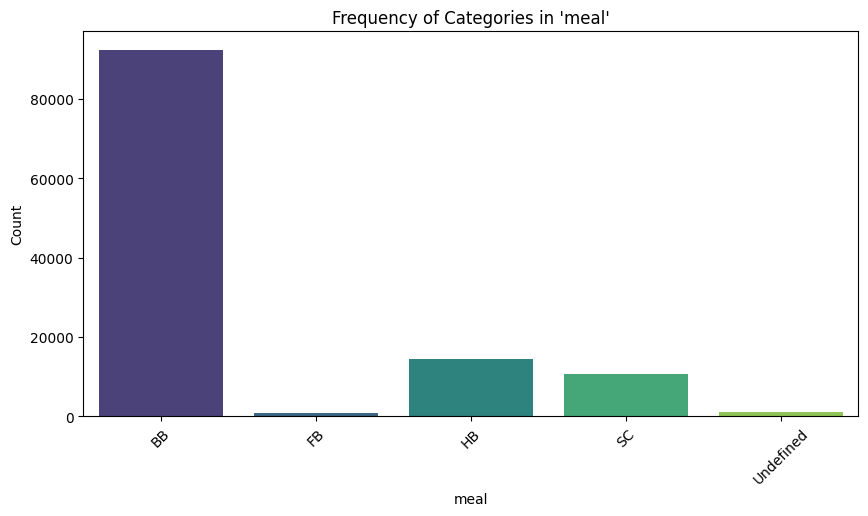

--- Analyzing Column: country ---
Outlier categories in 'country': ['PRT']



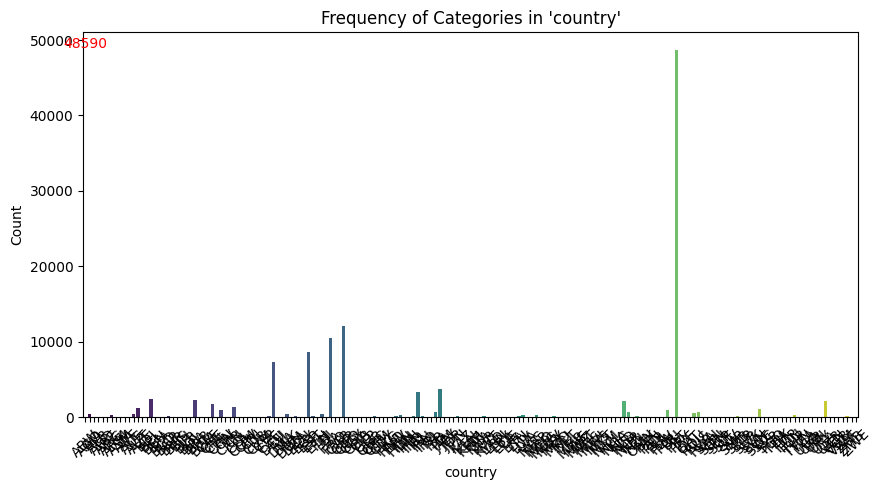

--- Analyzing Column: market_segment ---
Outlier categories in 'market_segment': []



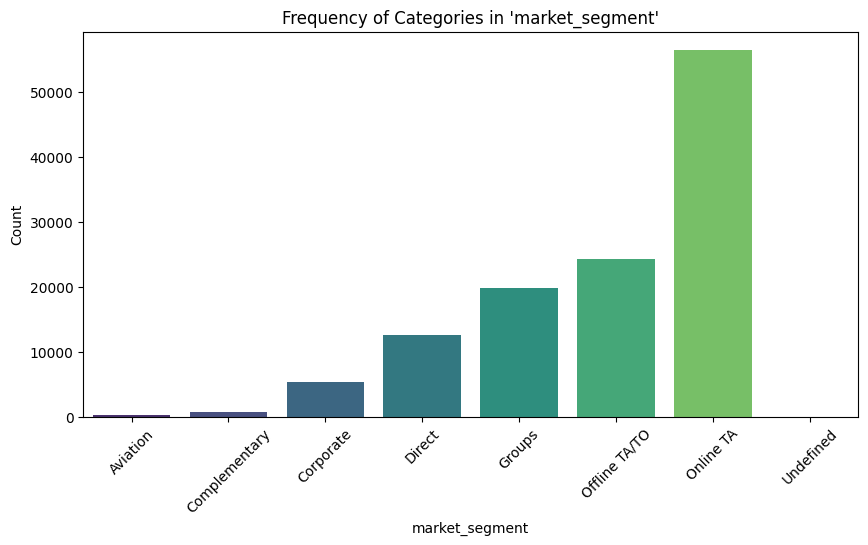

--- Analyzing Column: distribution_channel ---
Outlier categories in 'distribution_channel': []



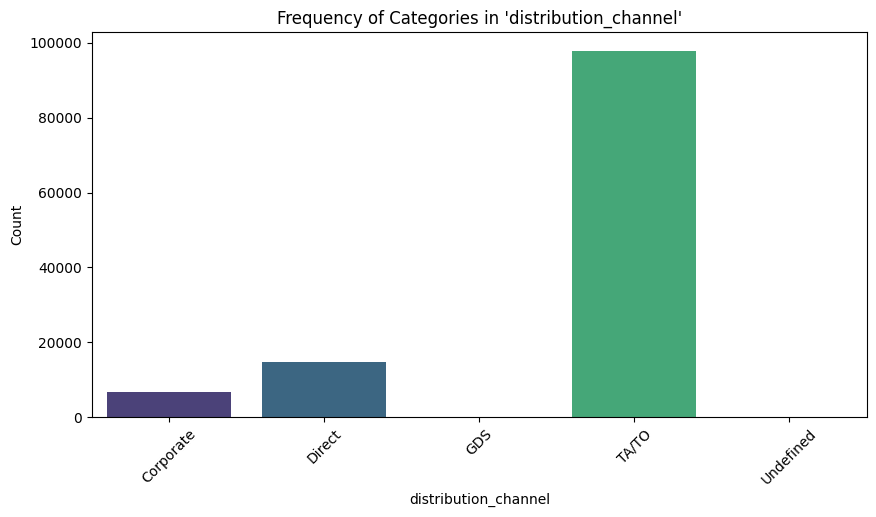

--- Analyzing Column: is_repeated_guest ---
Outlier categories in 'is_repeated_guest': []



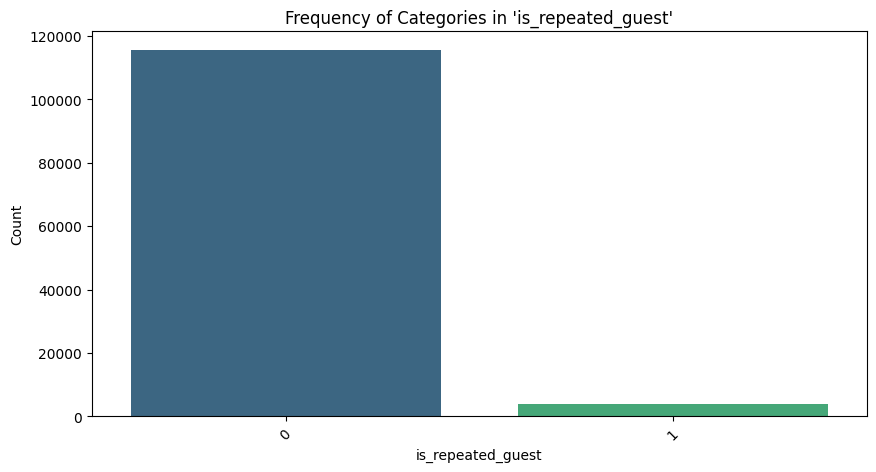

--- Analyzing Column: reserved_room_type ---
Outlier categories in 'reserved_room_type': []



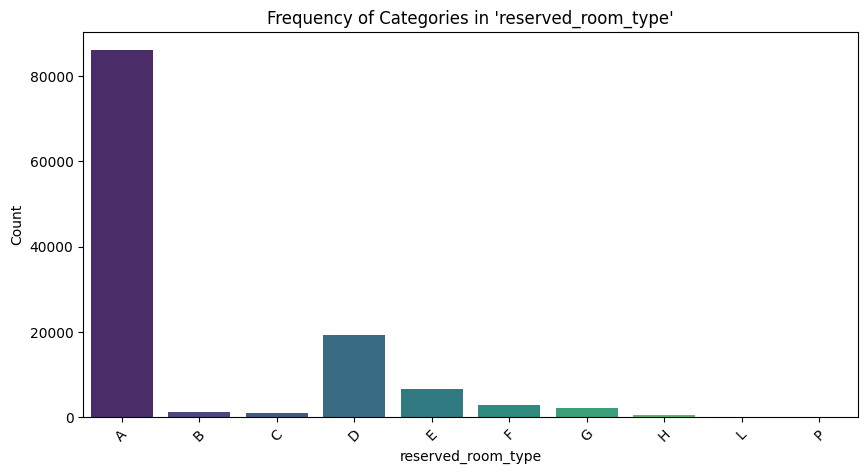

--- Analyzing Column: assigned_room_type ---
Outlier categories in 'assigned_room_type': ['A']



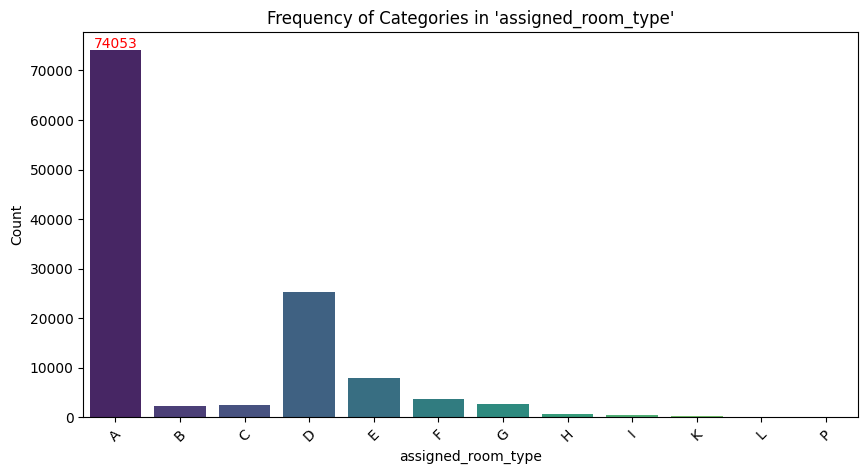

--- Analyzing Column: deposit_type ---
Outlier categories in 'deposit_type': []



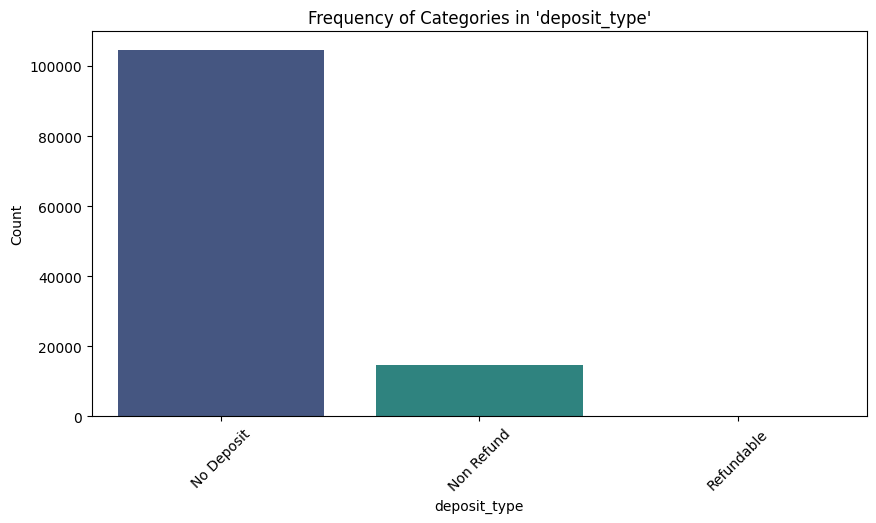

--- Analyzing Column: customer_type ---
Outlier categories in 'customer_type': []



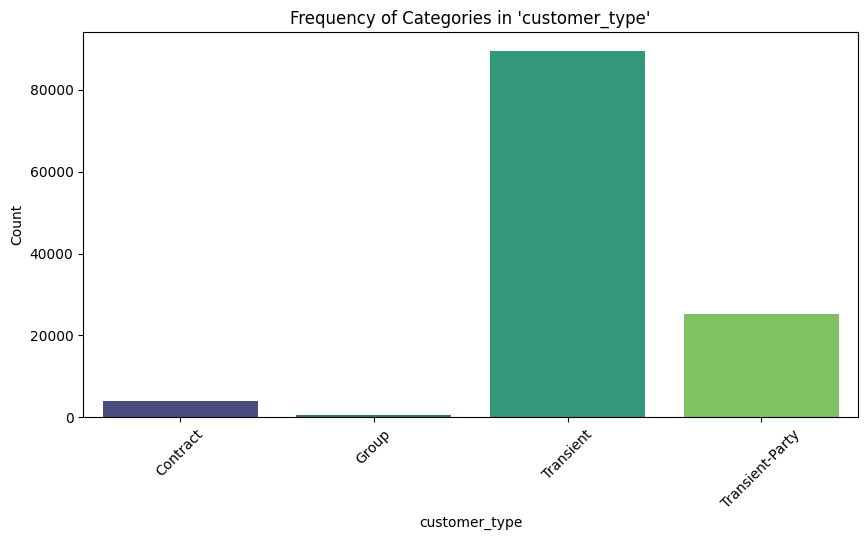

--- Analyzing Column: reservation_status ---
Outlier categories in 'reservation_status': []



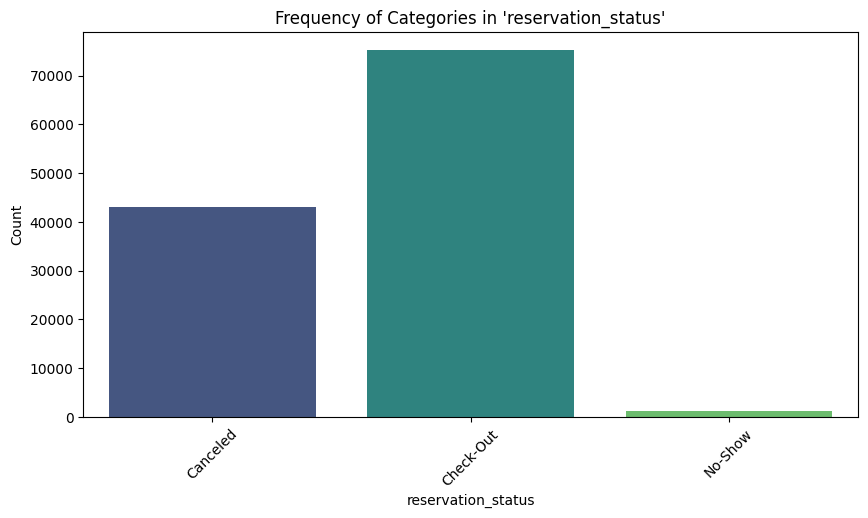

In [103]:
# outliers detection with zscore

from scipy.stats import zscore


# Threshold for Z-score to consider an outlier
z_threshold = 3

# Loop through each categorical column
for col in categorical_columns:
    print(f"--- Analyzing Column: {col} ---")

    # Get value counts
    total_counts = df[col].value_counts()

    # Calculate Z-scores
    category_zscores = zscore(total_counts.values)

    # Identify outliers (categories with |Z| > threshold)
    outlier_categories = total_counts.index[abs(category_zscores) > z_threshold]
    print(f"Outlier categories in '{col}': {list(outlier_categories)}\n")

    # Visualize category distribution with annotation for outliers
    plt.figure(figsize=(10, 5))
    sns.barplot(x=total_counts.index, y=total_counts.values, palette='viridis')
    plt.title(f"Frequency of Categories in '{col}'")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.xticks(rotation=45)

    # Highlight outlier categories
    for outlier in outlier_categories:
        plt.text(x=total_counts.index.get_loc(outlier), y=total_counts[outlier],
                 s=f"{total_counts[outlier]}", color='red', ha='center', va='bottom', fontsize=10)

    plt.show()


In [104]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   hotel                           119390 non-null  category      
 1   is_canceled                     119390 non-null  category      
 2   lead_time                       119390 non-null  int64         
 3   arrival_date_year               119390 non-null  category      
 4   arrival_date_month              119390 non-null  category      
 5   arrival_date_week_number        119390 non-null  category      
 6   arrival_date_day_of_month       119390 non-null  category      
 7   stays_in_weekend_nights         119390 non-null  int64         
 8   stays_in_week_nights            119390 non-null  int64         
 9   adults                          119390 non-null  int64         
 10  children                        119386 non-null  float64

#

In [105]:
df.select_dtypes(include=['int64', 'float64']).columns

Index(['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights',
       'adults', 'children', 'babies', 'previous_cancellations',
       'previous_bookings_not_canceled', 'booking_changes', 'agent', 'company',
       'days_in_waiting_list', 'adr', 'required_car_parking_spaces',
       'total_of_special_requests'],
      dtype='object')

In [106]:
data = df.select_dtypes(include=['int64', 'float64'])
data.head()

,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
0,342,0,0,2,0.0,0,0,0,3,NaN,NaN,0,0.0,0,0
1,737,0,0,2,0.0,0,0,0,4,NaN,NaN,0,0.0,0,0
2,7,0,1,1,0.0,0,0,0,0,NaN,NaN,0,75.0,0,0
3,13,0,1,1,0.0,0,0,0,0,304.0,NaN,0,75.0,0,0
4,14,0,2,2,0.0,0,0,0,0,240.0,NaN,0,98.0,0,1


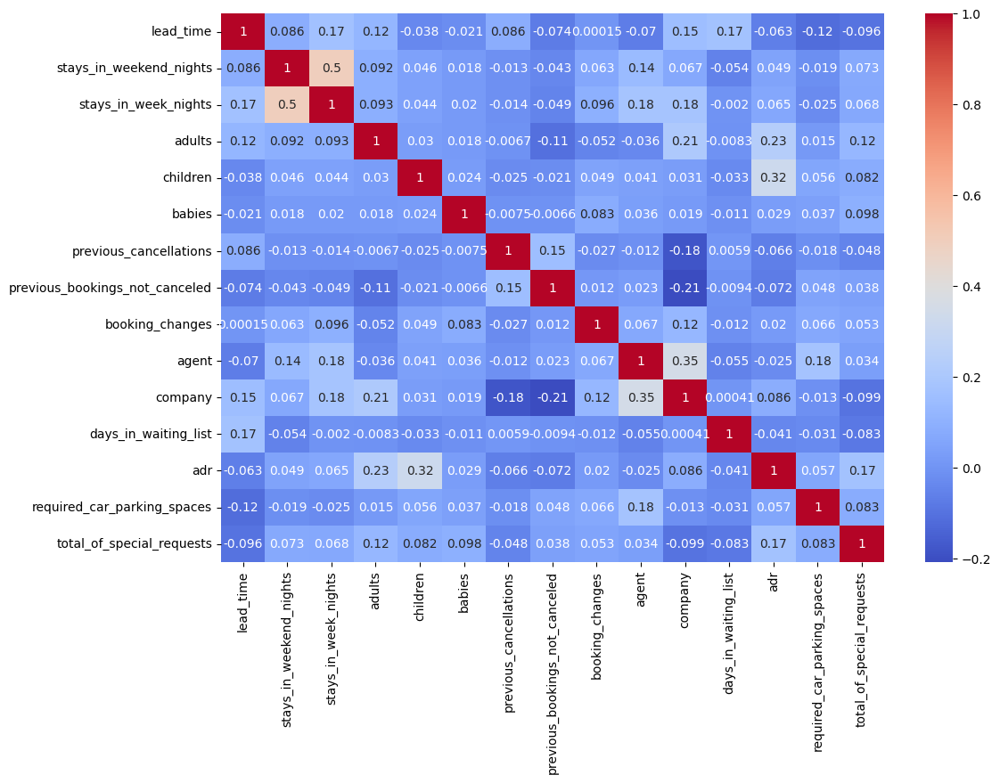

In [107]:
# Correlation heatmap for numerical features
import seaborn as sns
plt.figure(figsize=(12, 8))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm')
plt.show()





# arrival_date_year

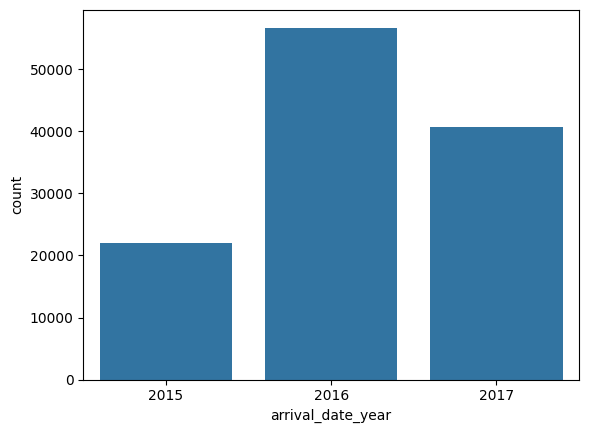

In [108]:
sns.countplot(x='arrival_date_year', data=df)
plt.show()

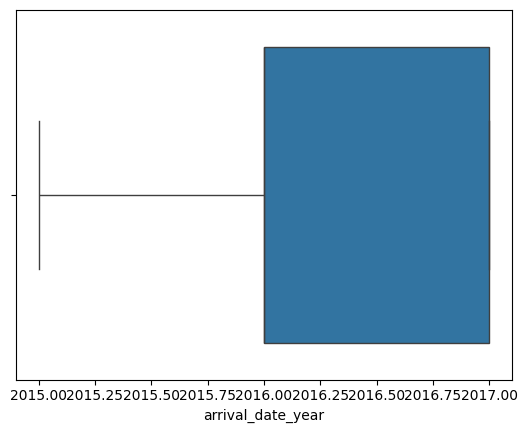

In [109]:
sns.boxplot(x ='arrival_date_year' , data=df)
plt.show()

Heatmap for hotel vs is_canceled


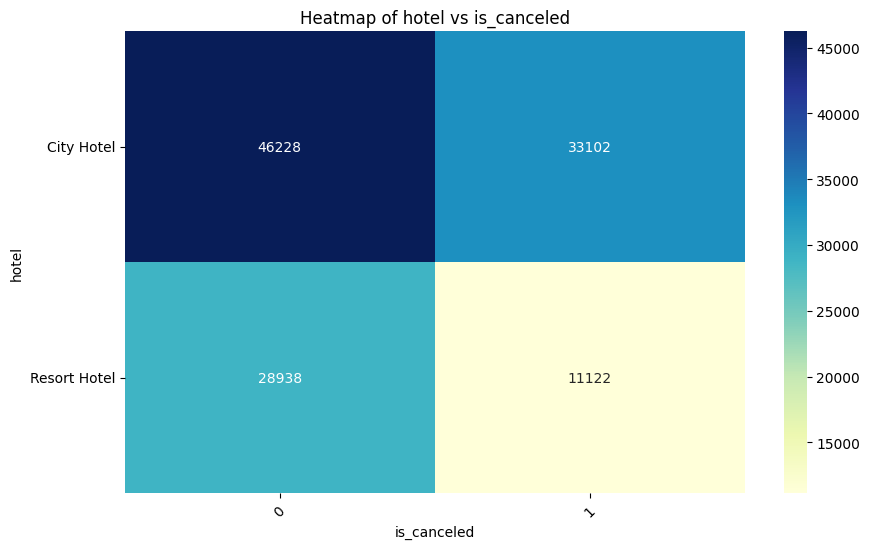

Heatmap for hotel vs arrival_date_year


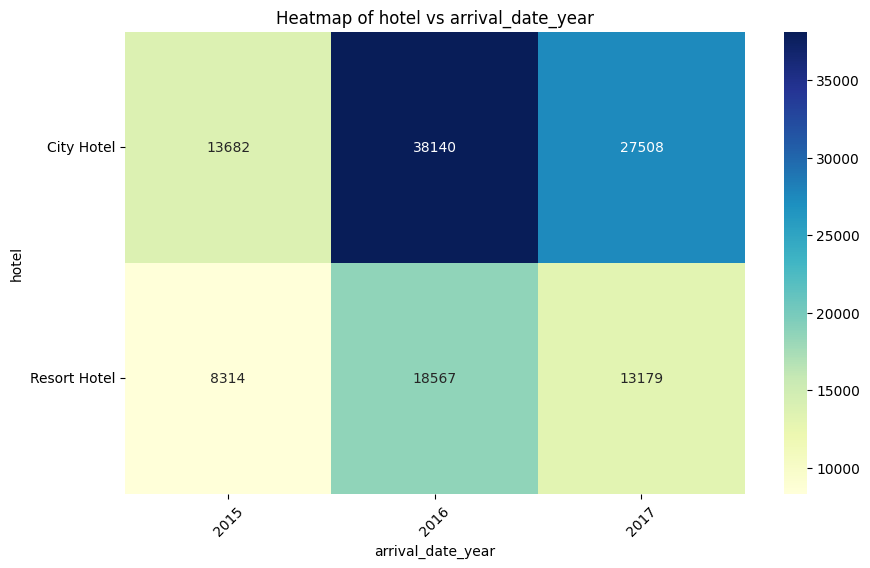

Heatmap for hotel vs arrival_date_month


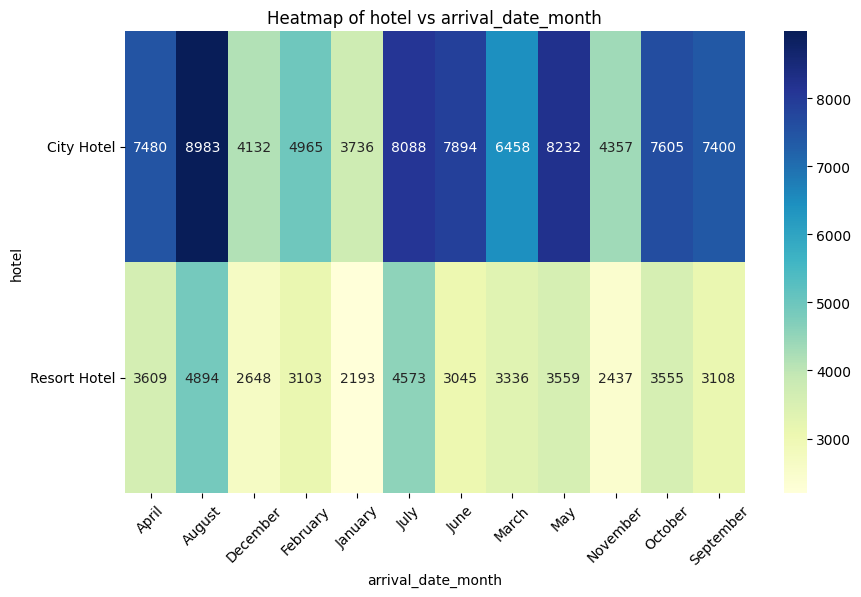

Heatmap for hotel vs arrival_date_week_number


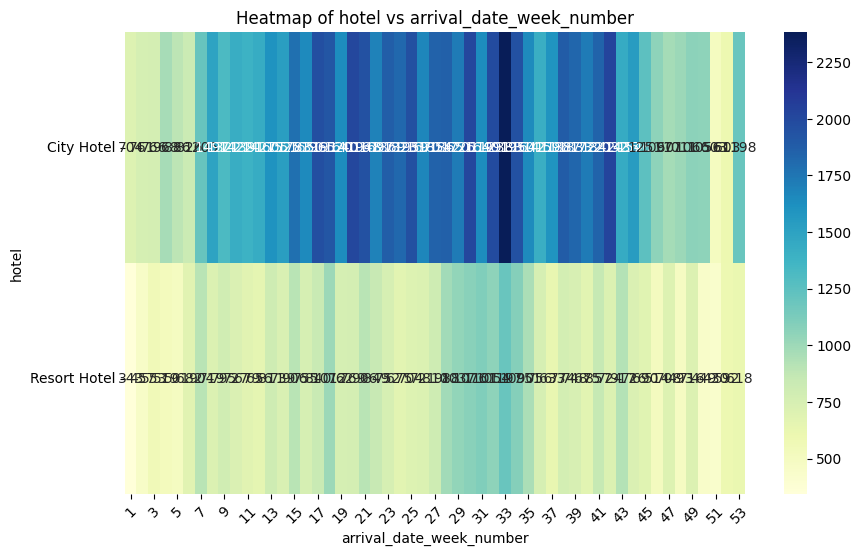

Heatmap for hotel vs arrival_date_day_of_month


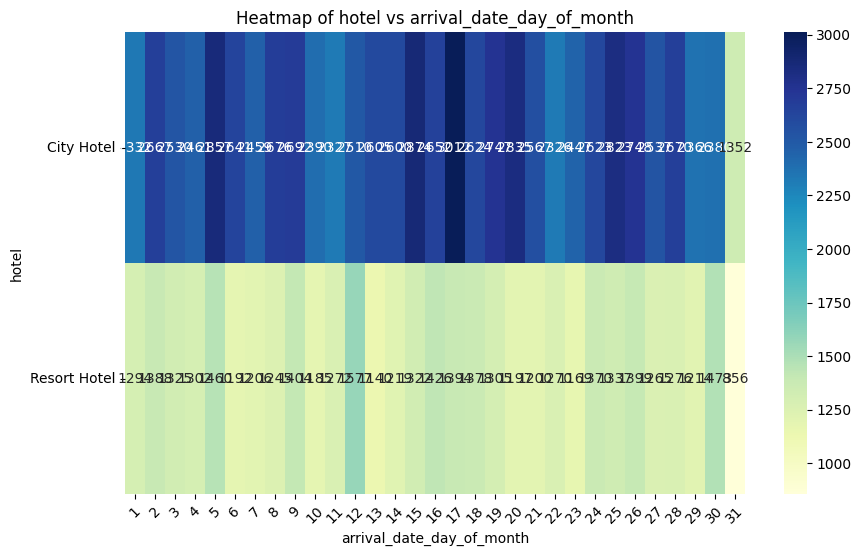

Heatmap for hotel vs meal


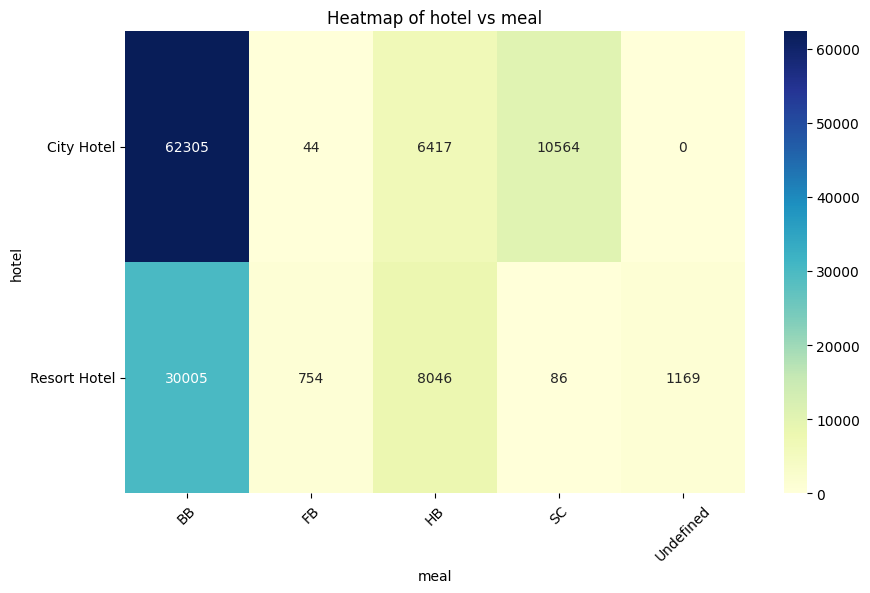

Heatmap for hotel vs country


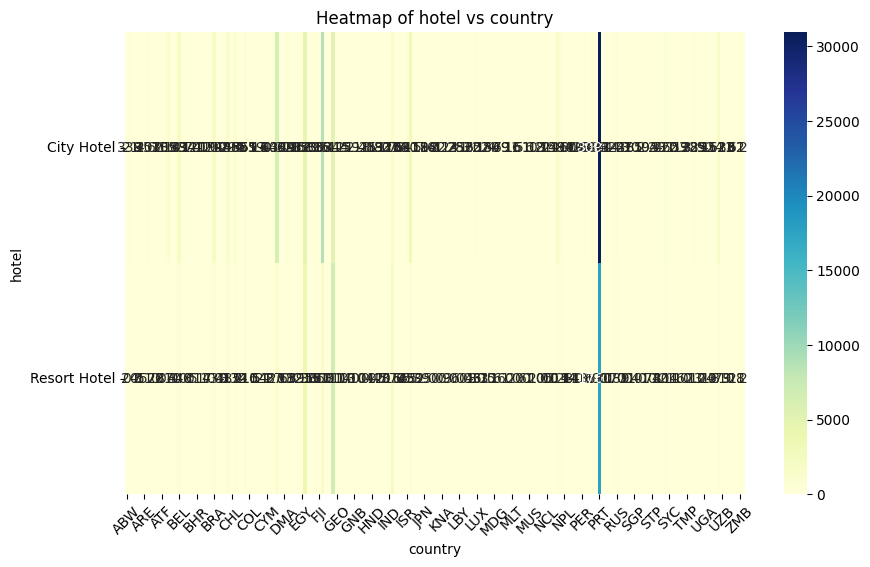

Heatmap for hotel vs market_segment


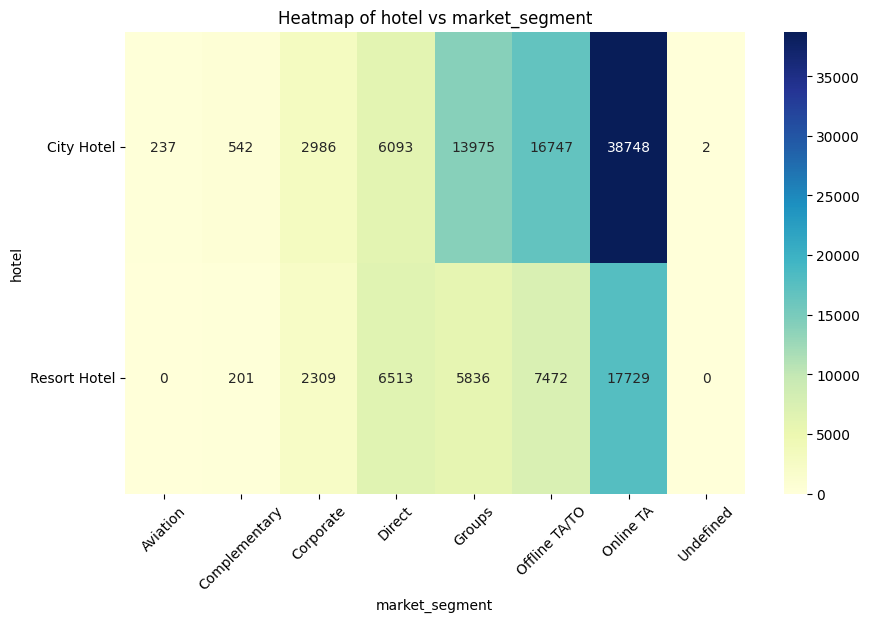

Heatmap for hotel vs distribution_channel


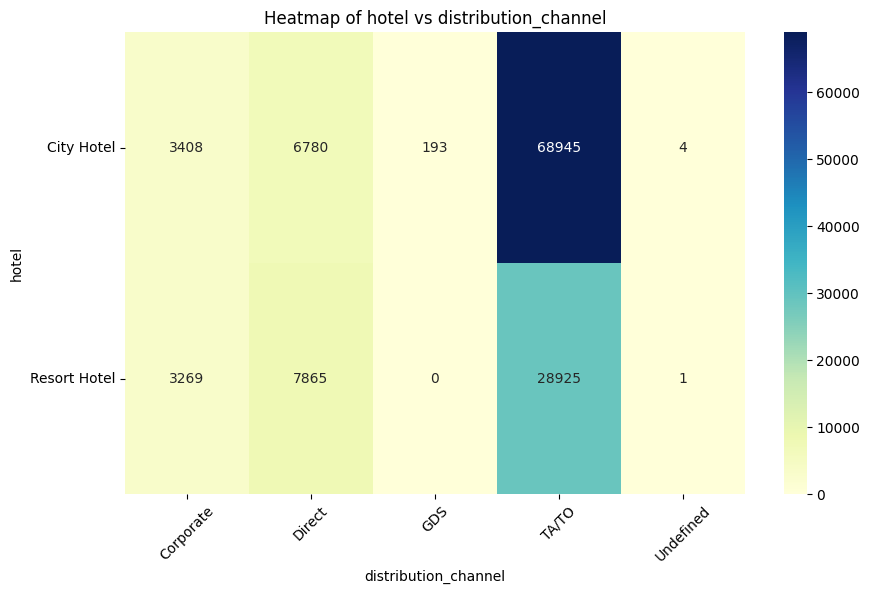

Heatmap for hotel vs is_repeated_guest


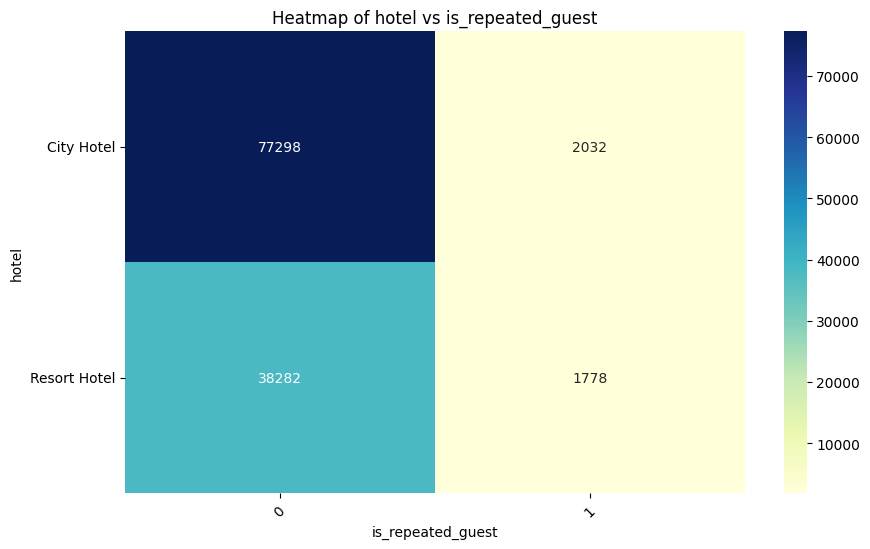

Heatmap for hotel vs reserved_room_type


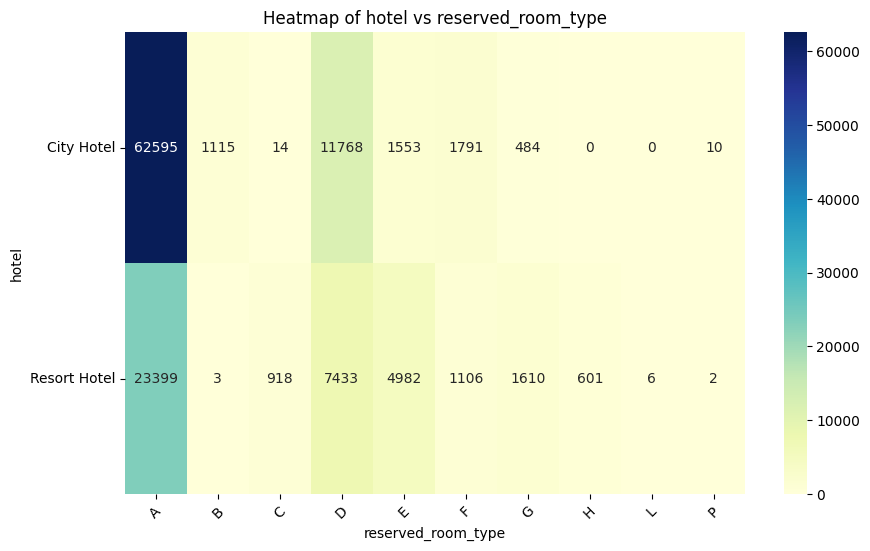

Heatmap for hotel vs assigned_room_type


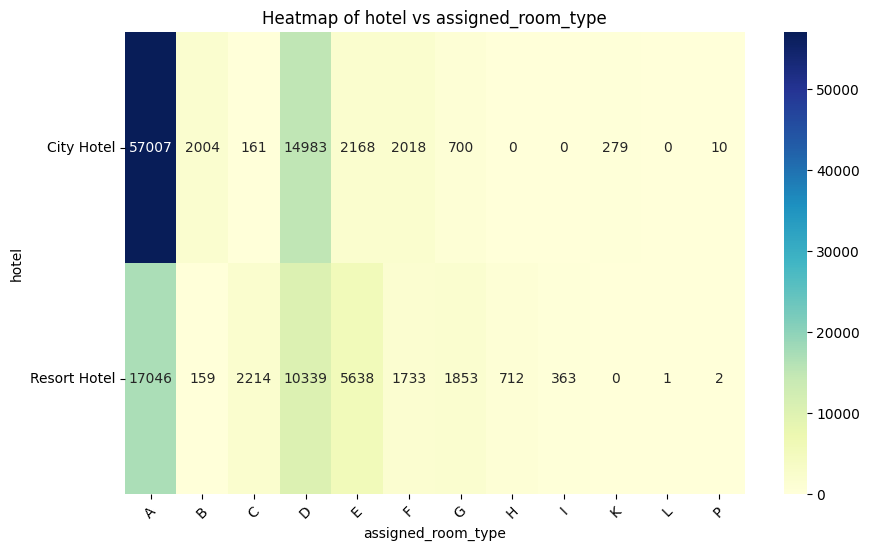

Heatmap for hotel vs deposit_type


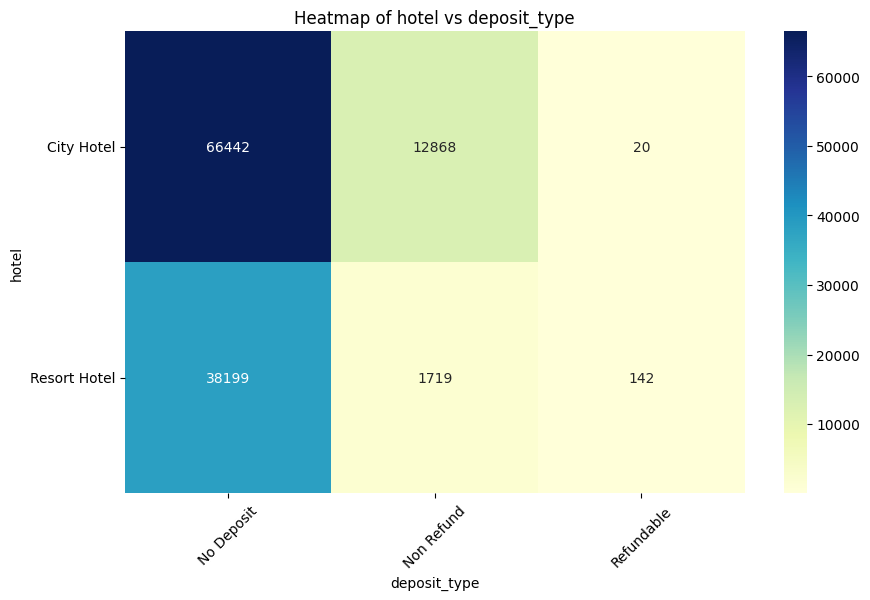

Heatmap for hotel vs customer_type


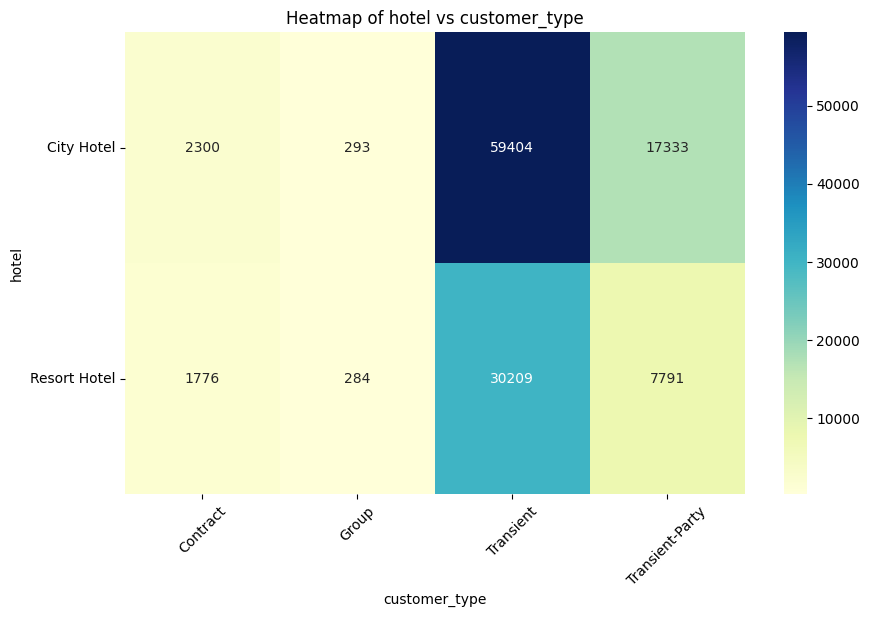

Heatmap for hotel vs reservation_status


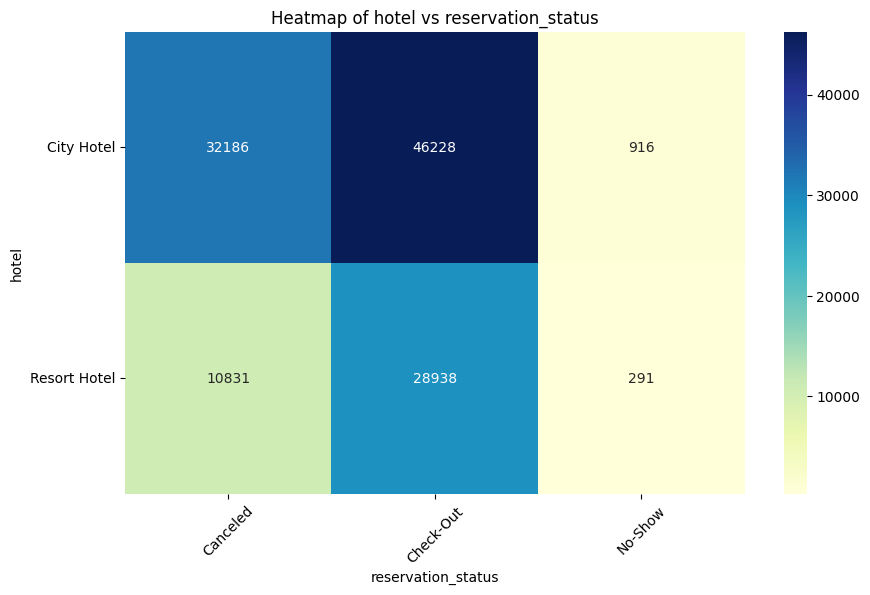

Heatmap for is_canceled vs arrival_date_year


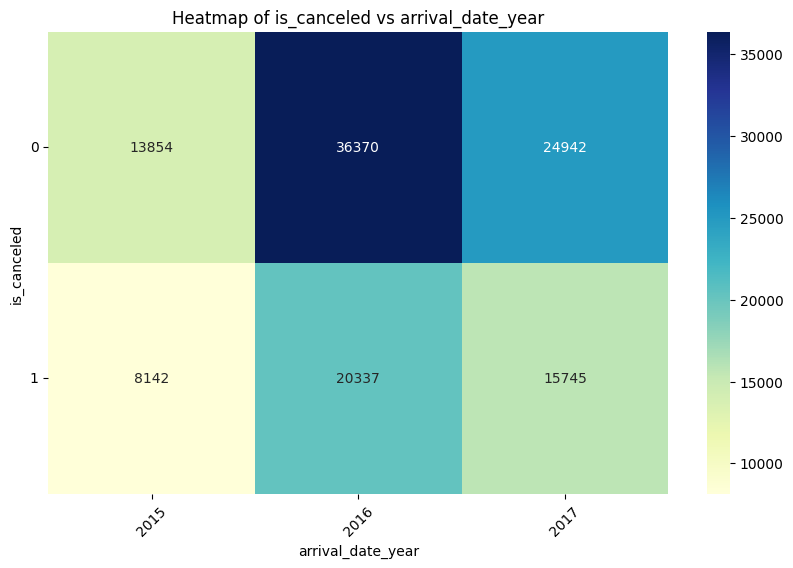

Heatmap for is_canceled vs arrival_date_month


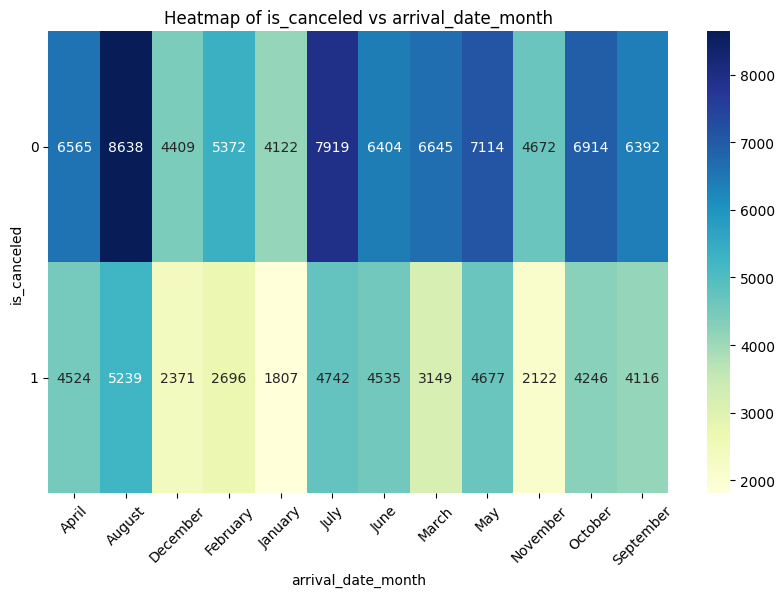

Heatmap for is_canceled vs arrival_date_week_number


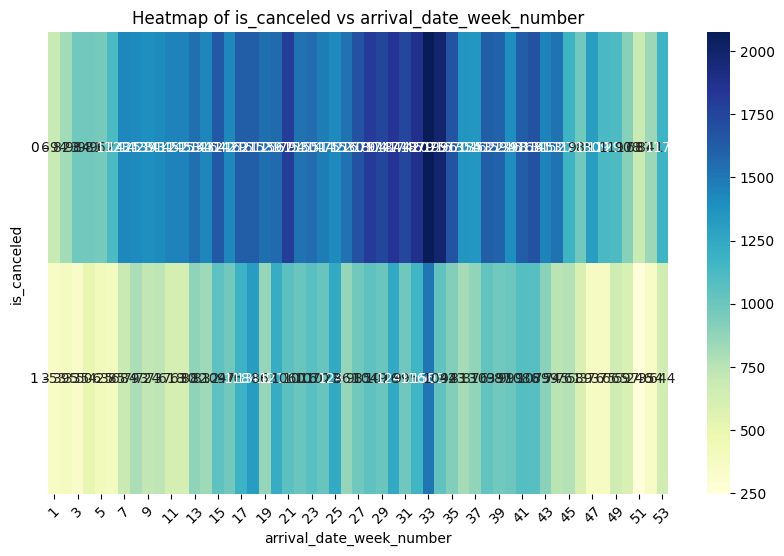

Heatmap for is_canceled vs arrival_date_day_of_month


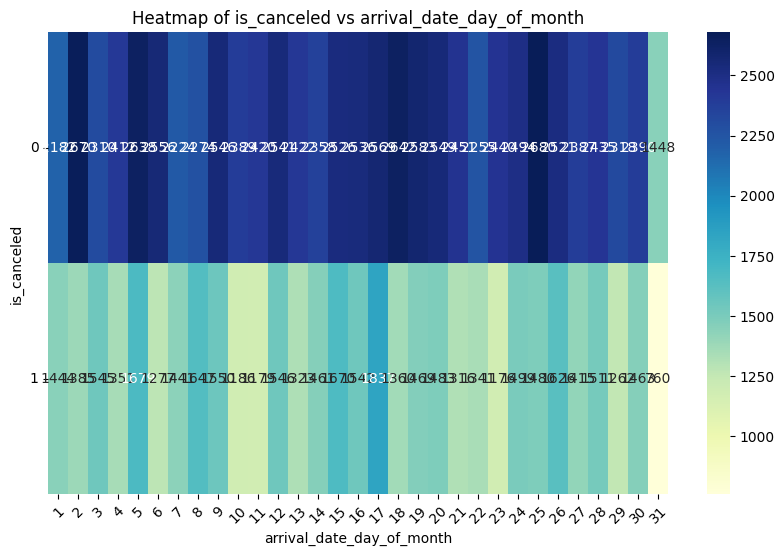

Heatmap for is_canceled vs meal


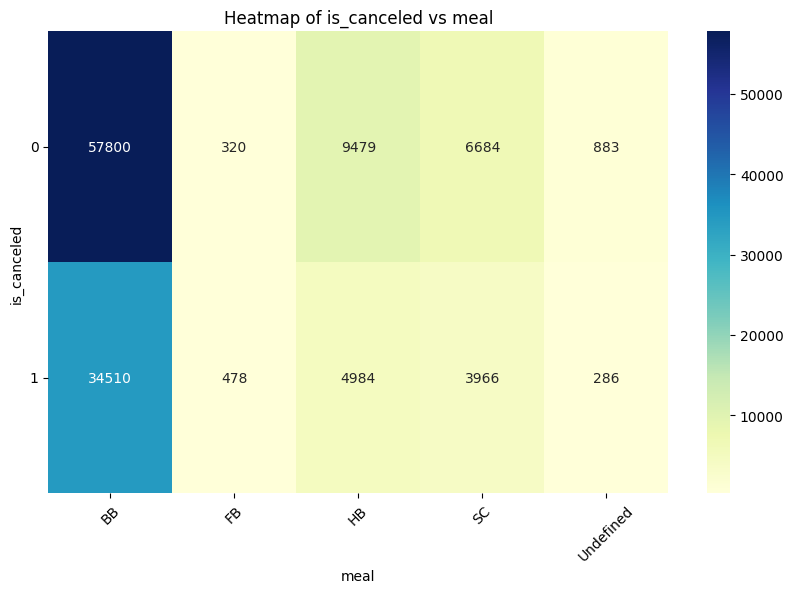

Heatmap for is_canceled vs country


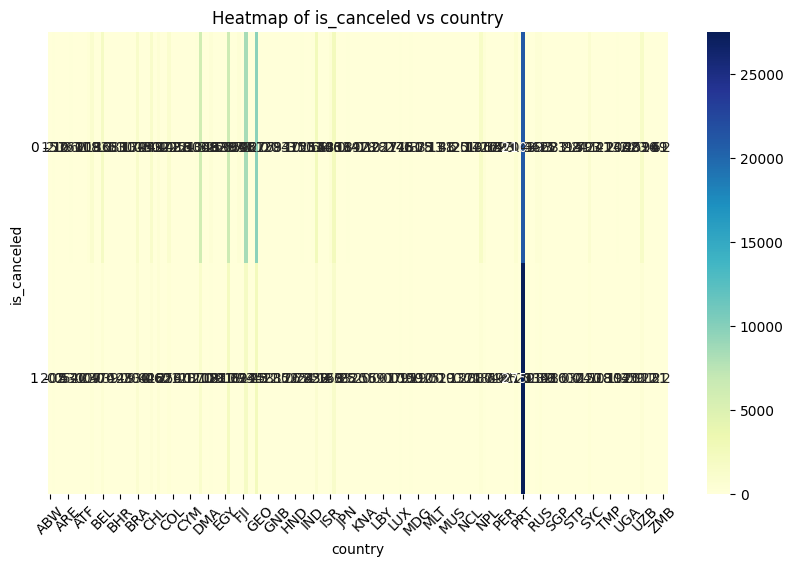

Heatmap for is_canceled vs market_segment


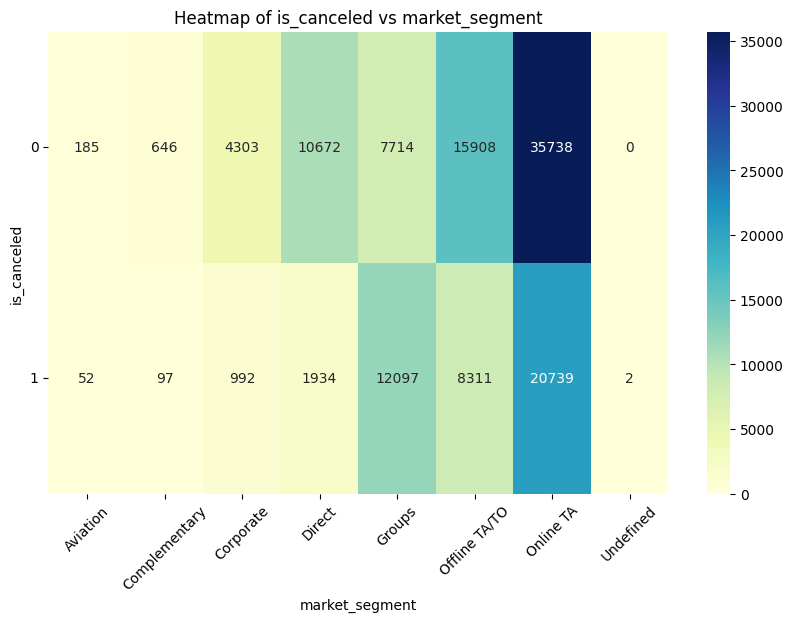

Heatmap for is_canceled vs distribution_channel


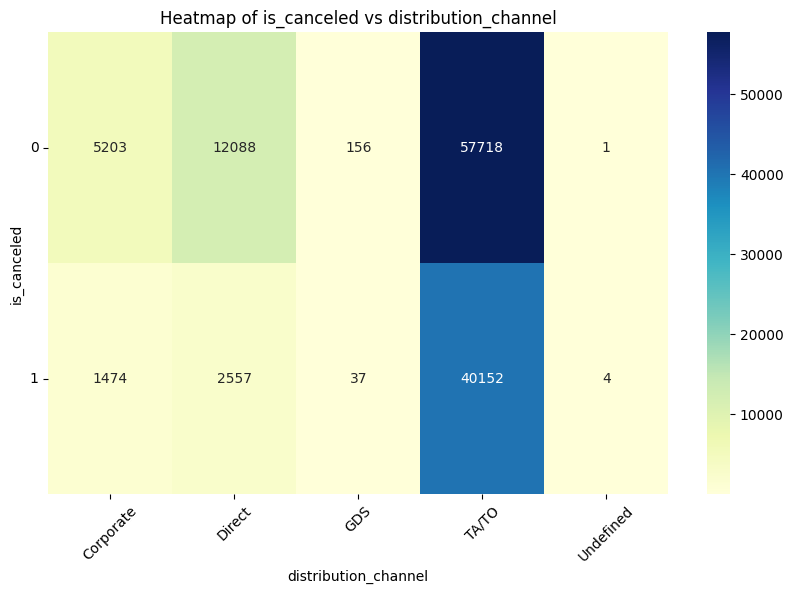

Heatmap for is_canceled vs is_repeated_guest


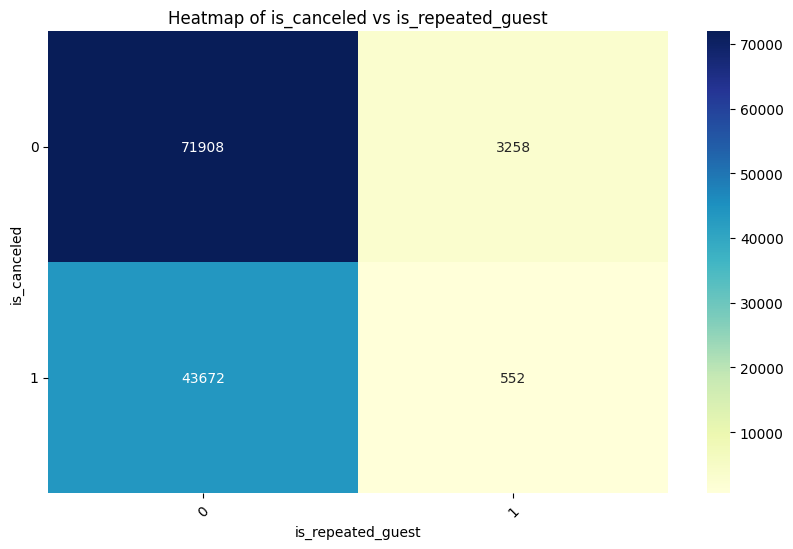

Heatmap for is_canceled vs reserved_room_type


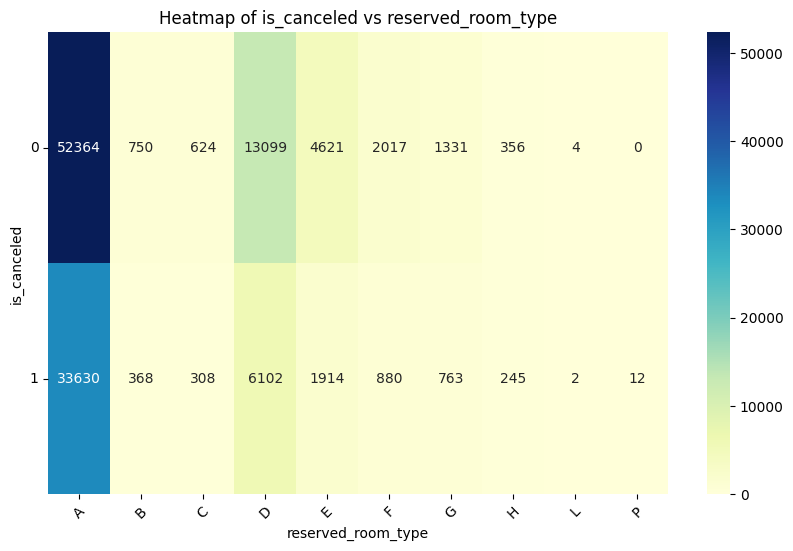

Heatmap for is_canceled vs assigned_room_type


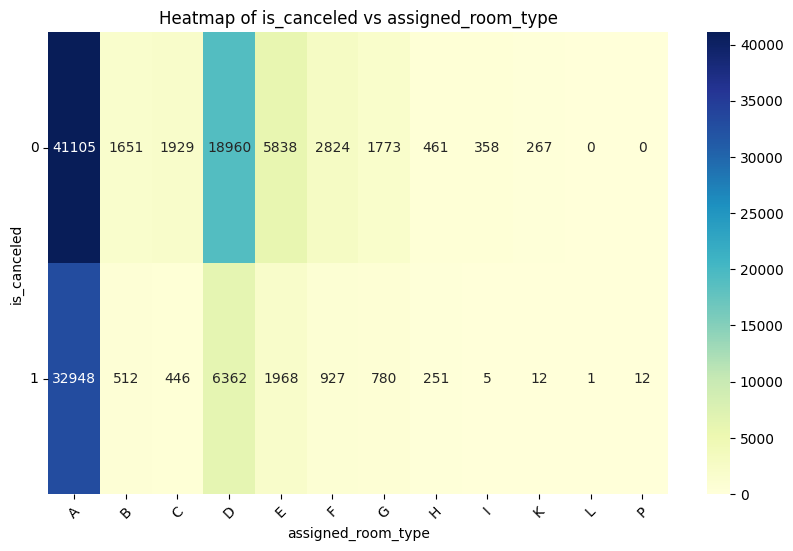

Heatmap for is_canceled vs deposit_type


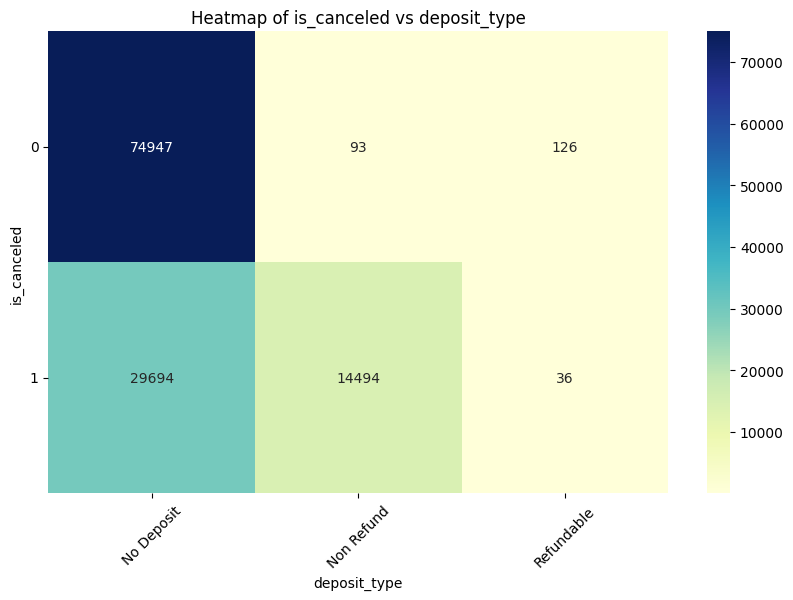

Heatmap for is_canceled vs customer_type


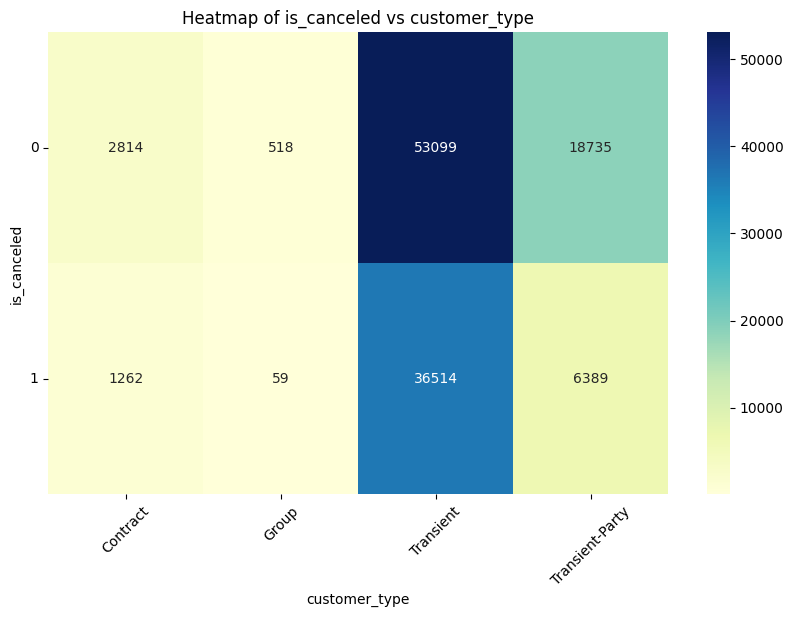

Heatmap for is_canceled vs reservation_status


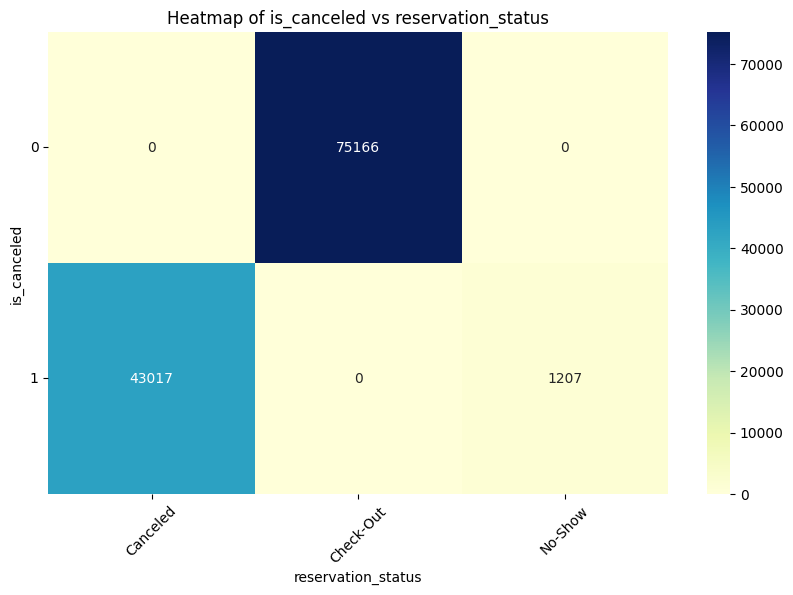

Heatmap for arrival_date_year vs arrival_date_month


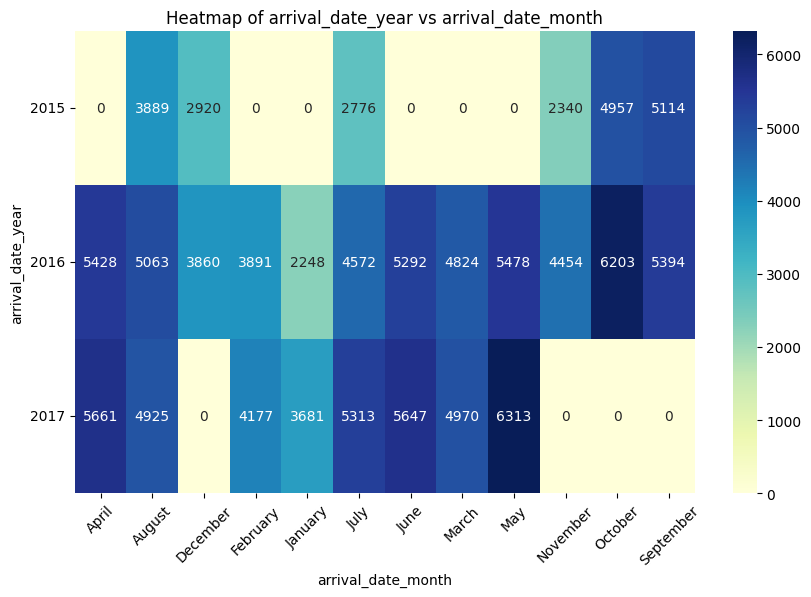

Heatmap for arrival_date_year vs arrival_date_week_number


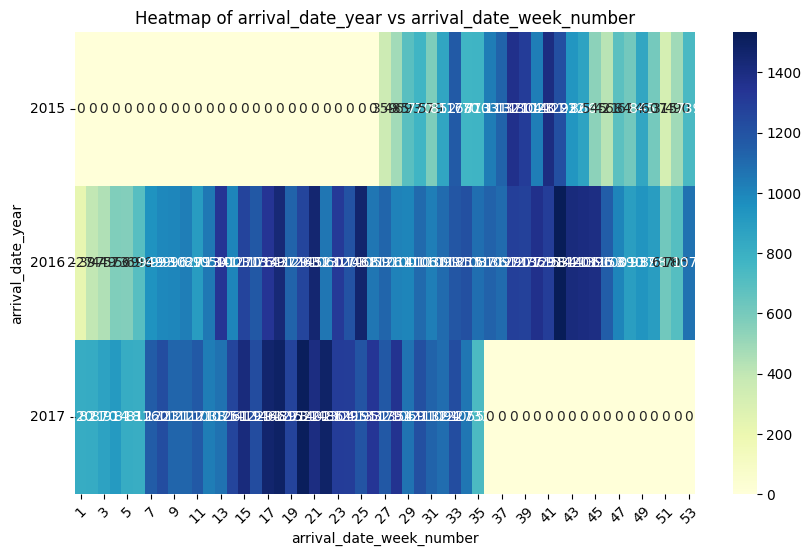

Heatmap for arrival_date_year vs arrival_date_day_of_month


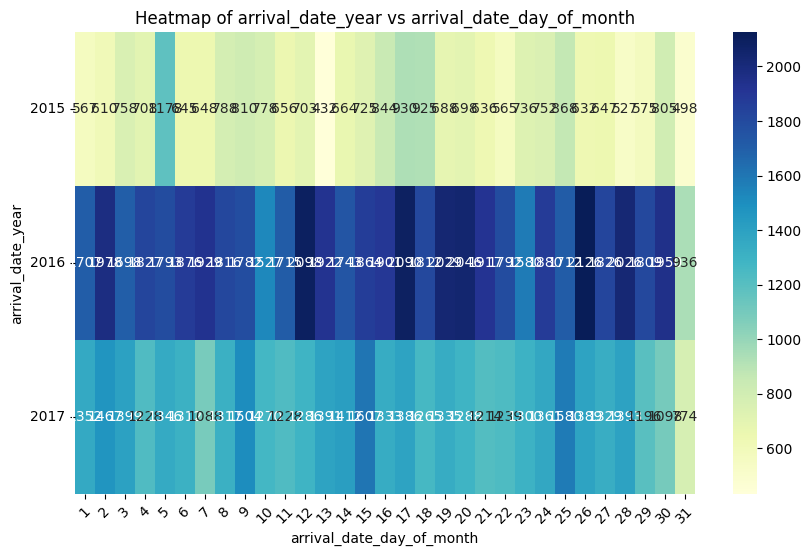

Heatmap for arrival_date_year vs meal


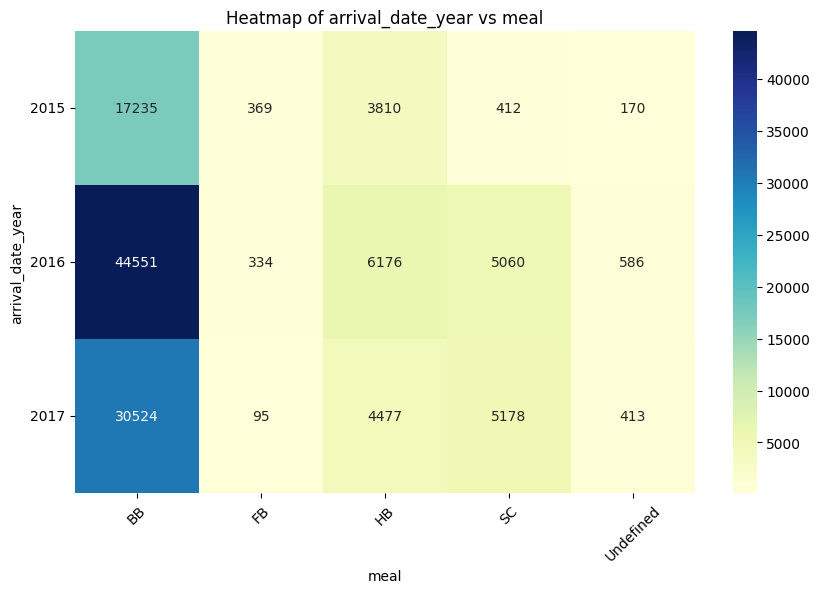

Heatmap for arrival_date_year vs country


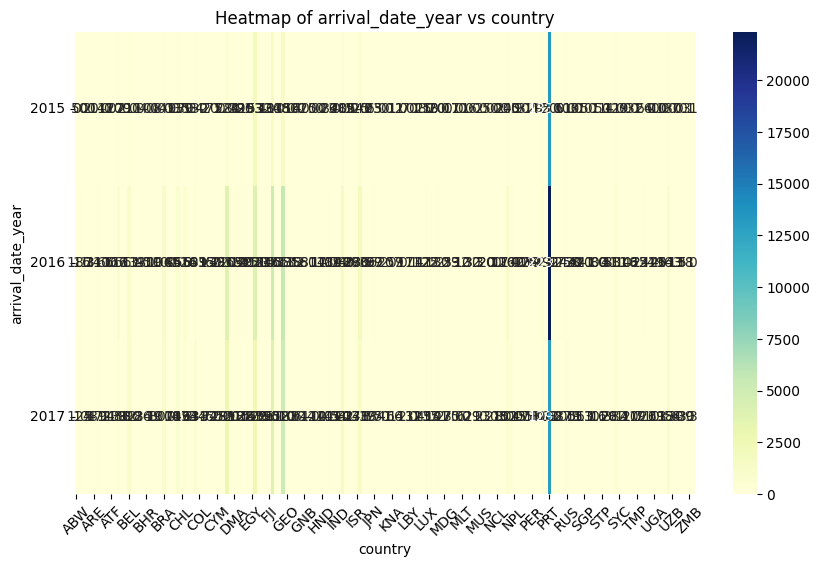

Heatmap for arrival_date_year vs market_segment


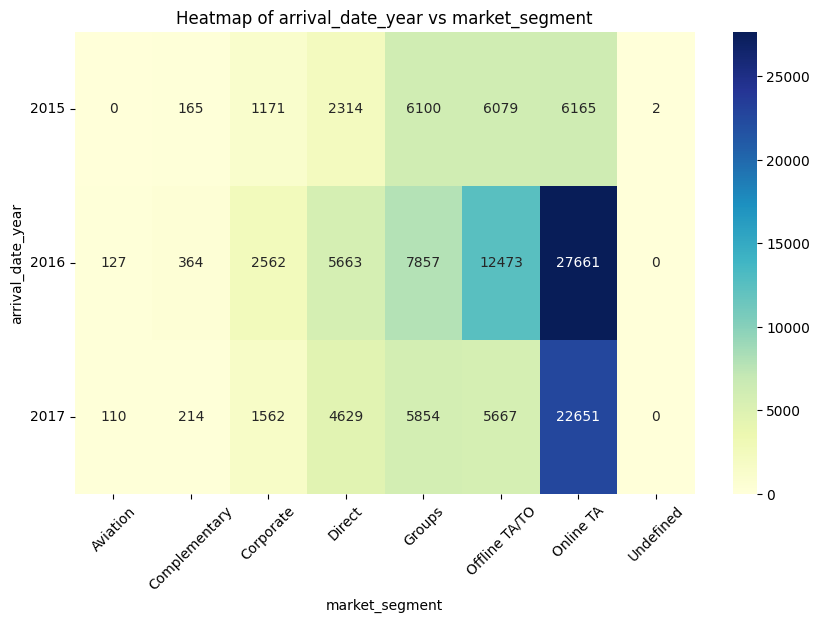

Heatmap for arrival_date_year vs distribution_channel


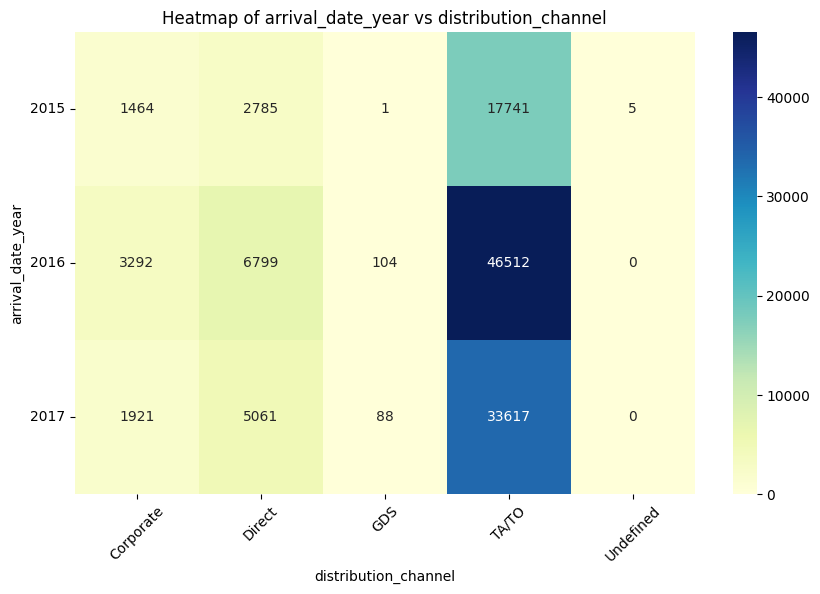

Heatmap for arrival_date_year vs is_repeated_guest


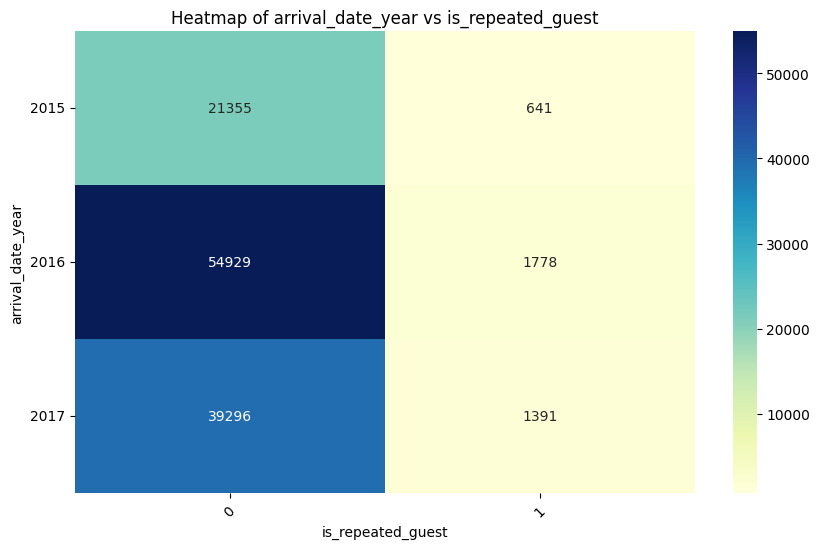

Heatmap for arrival_date_year vs reserved_room_type


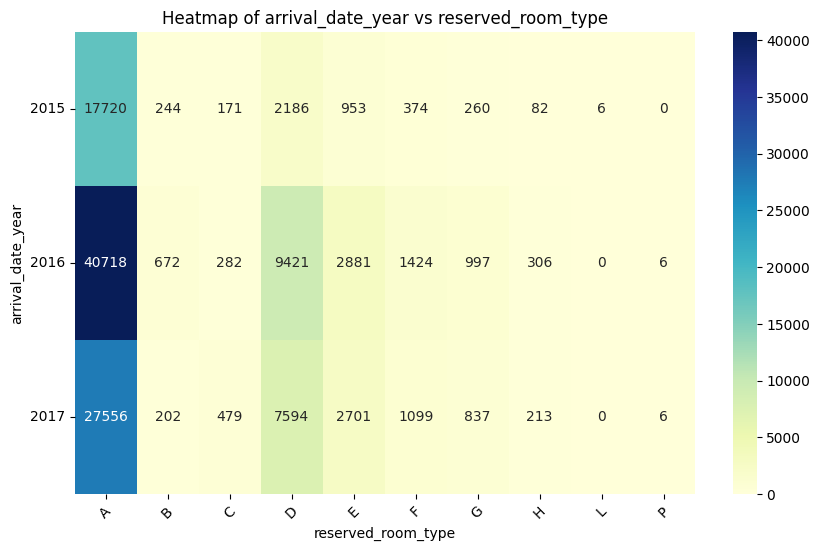

Heatmap for arrival_date_year vs assigned_room_type


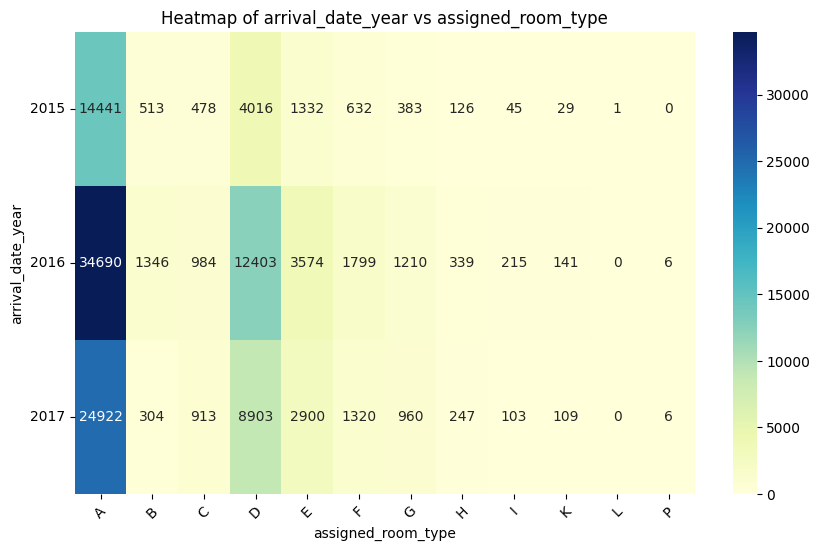

Heatmap for arrival_date_year vs deposit_type


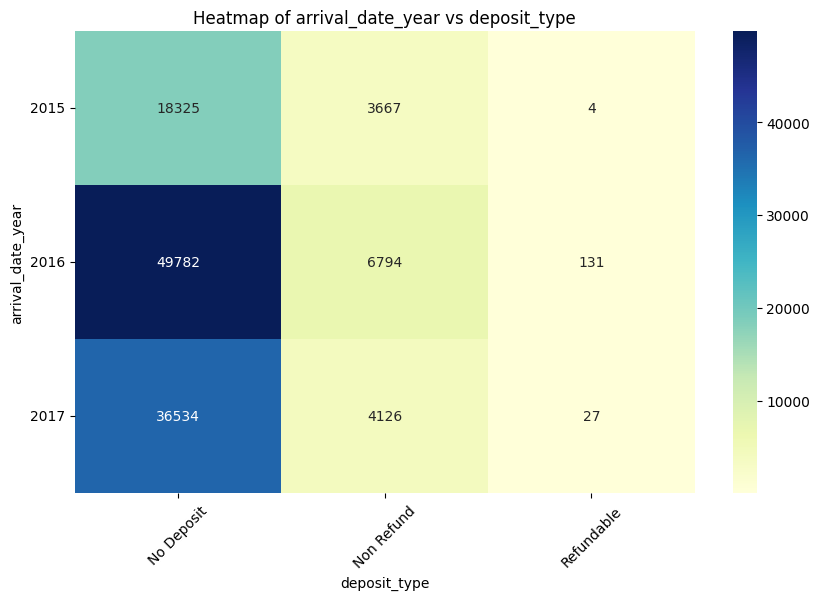

Heatmap for arrival_date_year vs customer_type


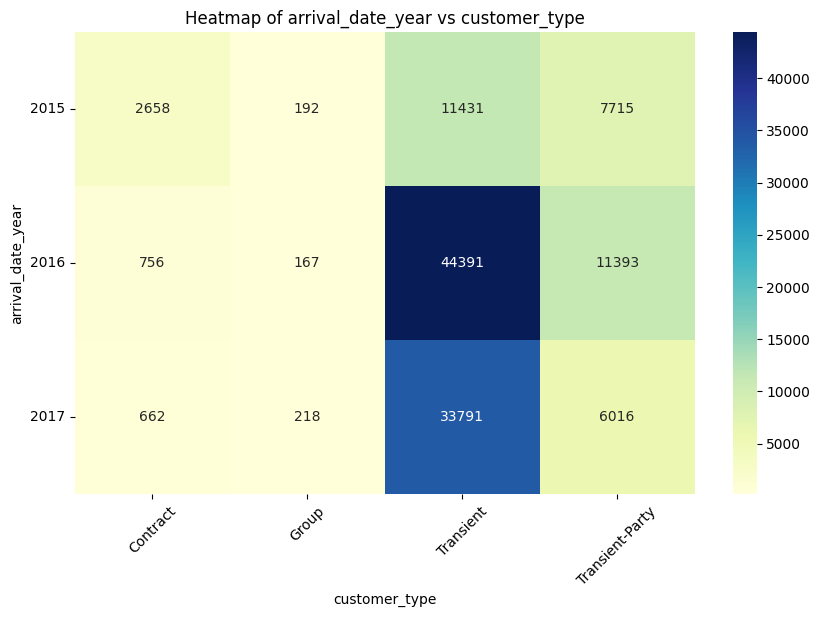

Heatmap for arrival_date_year vs reservation_status


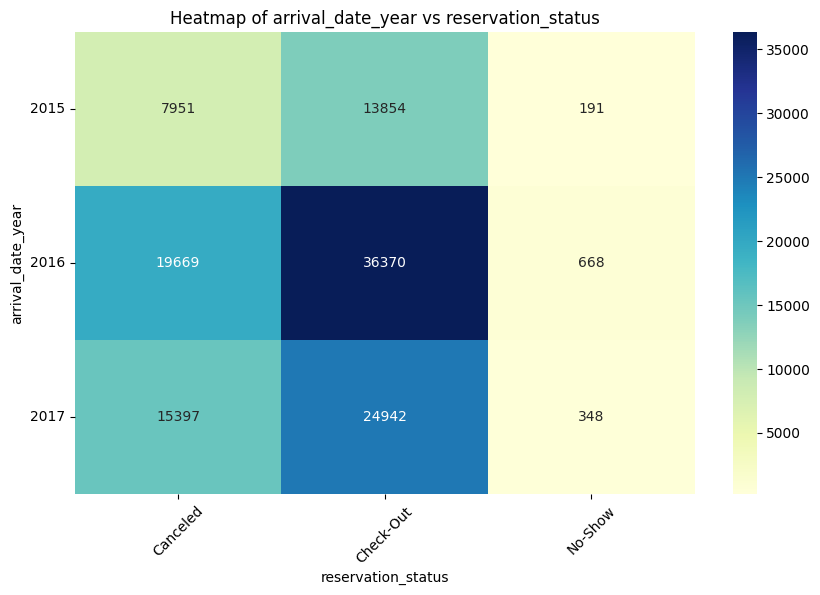

Heatmap for arrival_date_month vs arrival_date_week_number


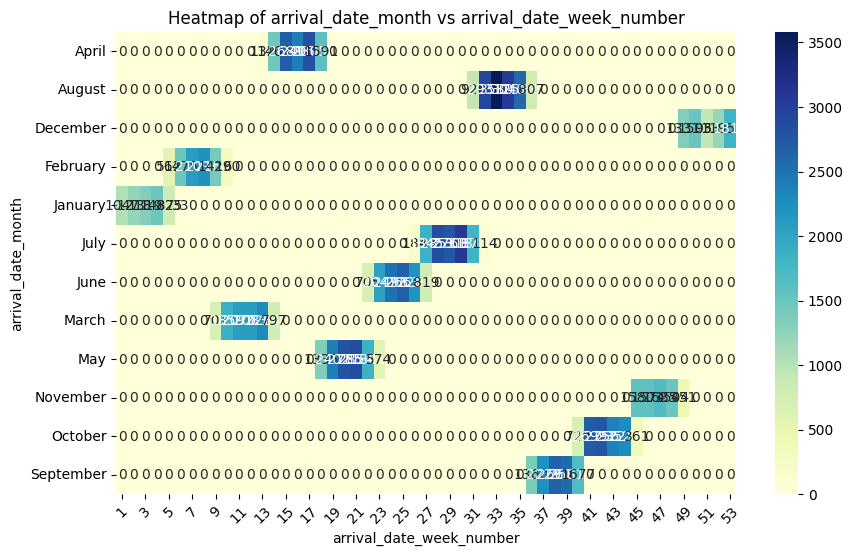

Heatmap for arrival_date_month vs arrival_date_day_of_month


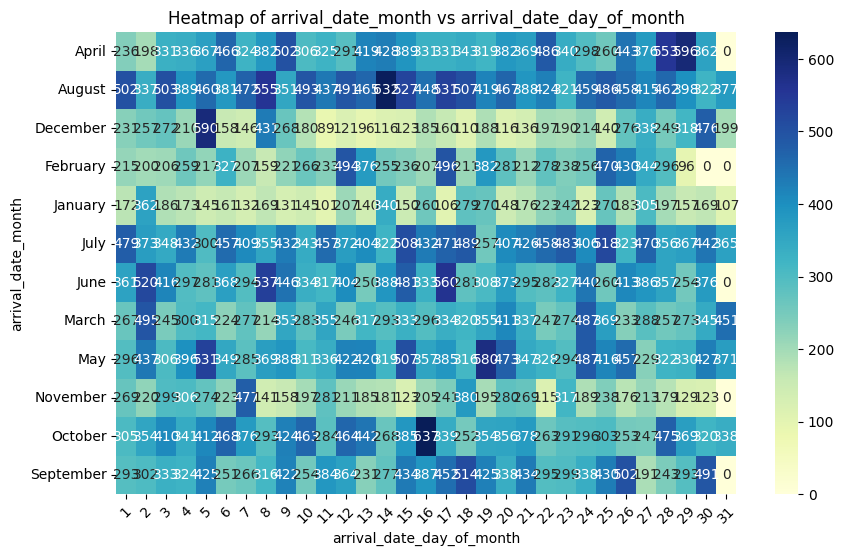

Heatmap for arrival_date_month vs meal


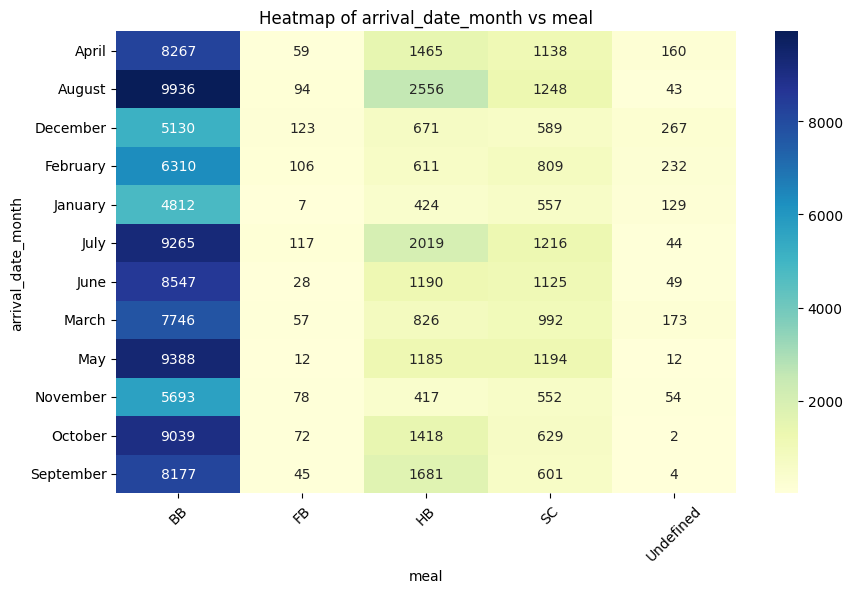

Heatmap for arrival_date_month vs country


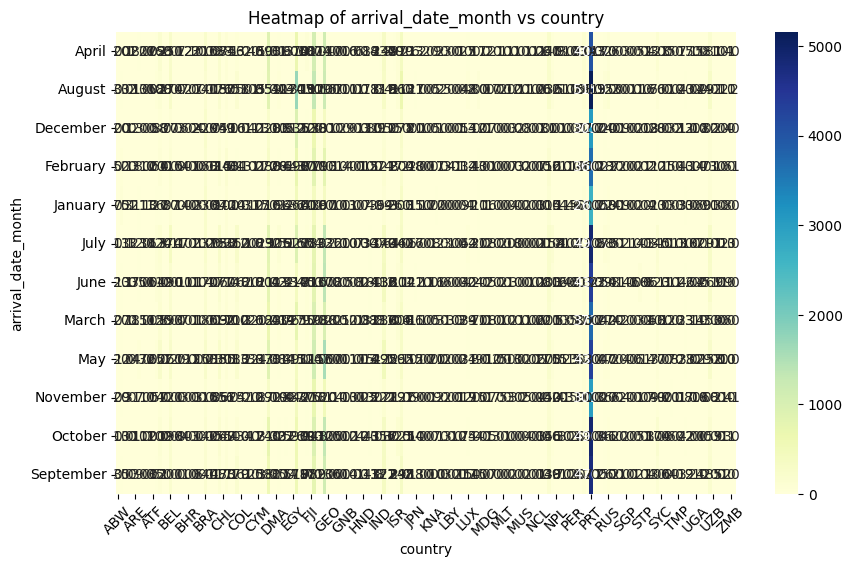

Heatmap for arrival_date_month vs market_segment


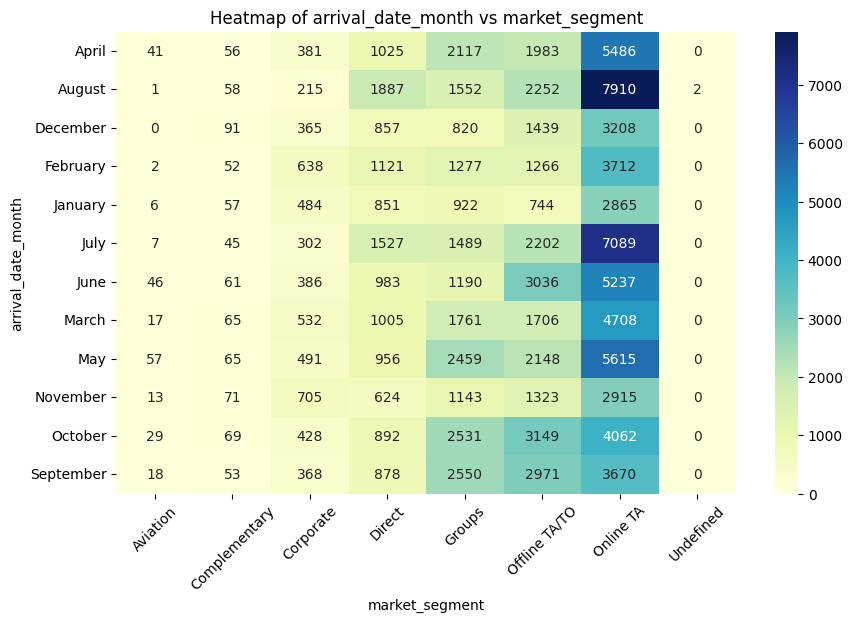

Heatmap for arrival_date_month vs distribution_channel


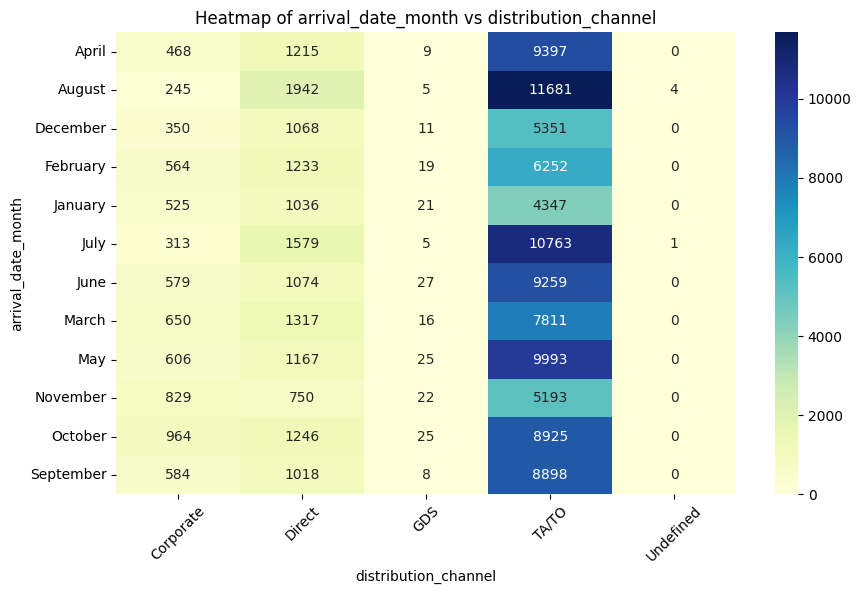

Heatmap for arrival_date_month vs is_repeated_guest


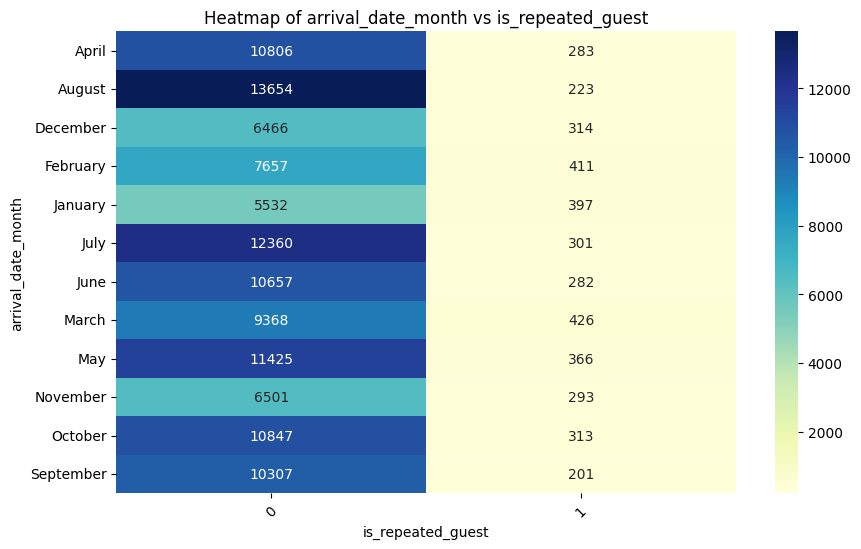

Heatmap for arrival_date_month vs reserved_room_type


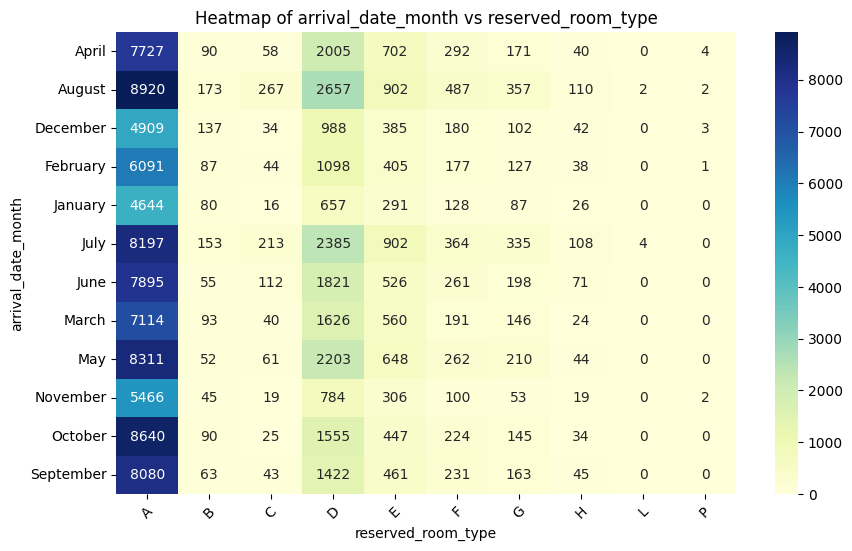

Heatmap for arrival_date_month vs assigned_room_type


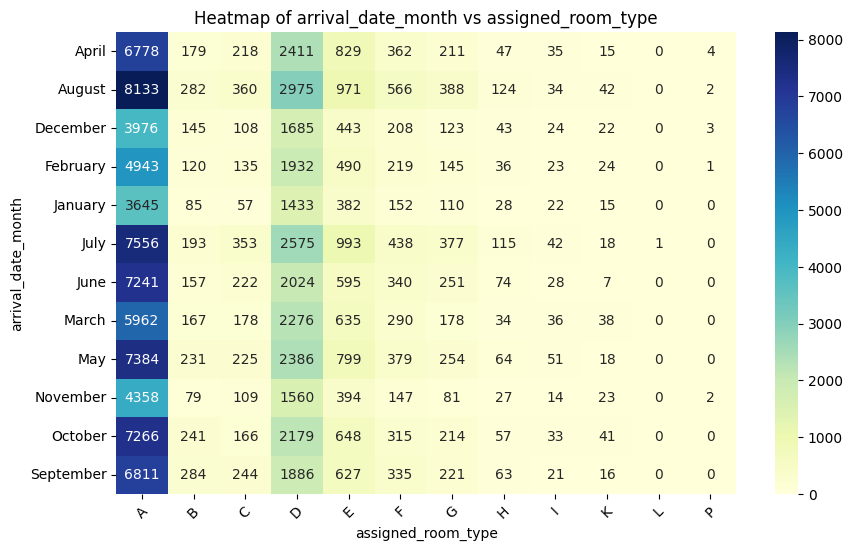

Heatmap for arrival_date_month vs deposit_type


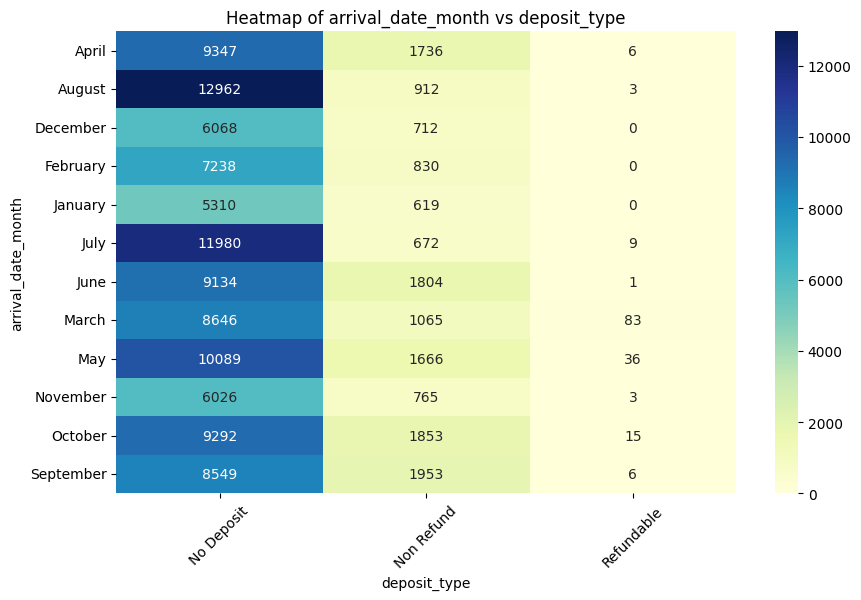

Heatmap for arrival_date_month vs customer_type


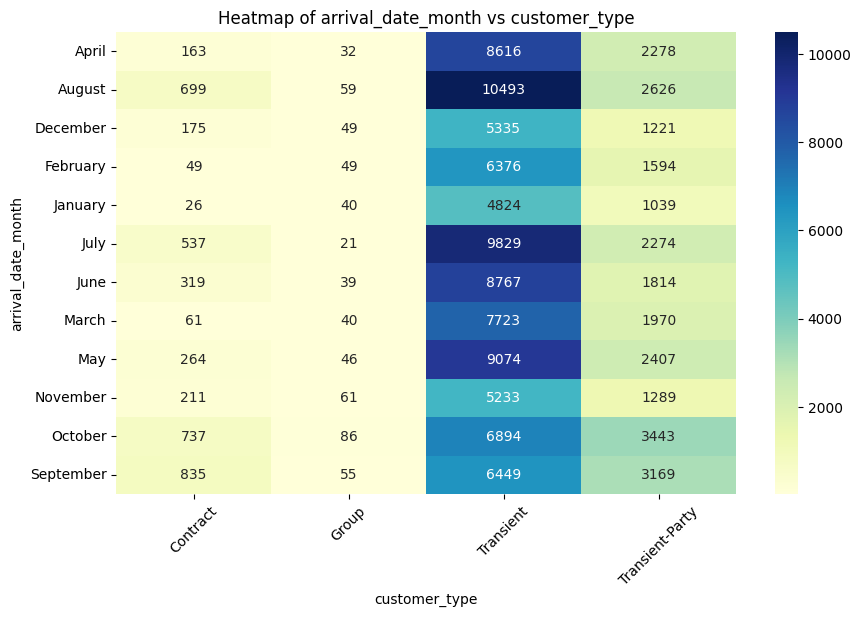

Heatmap for arrival_date_month vs reservation_status


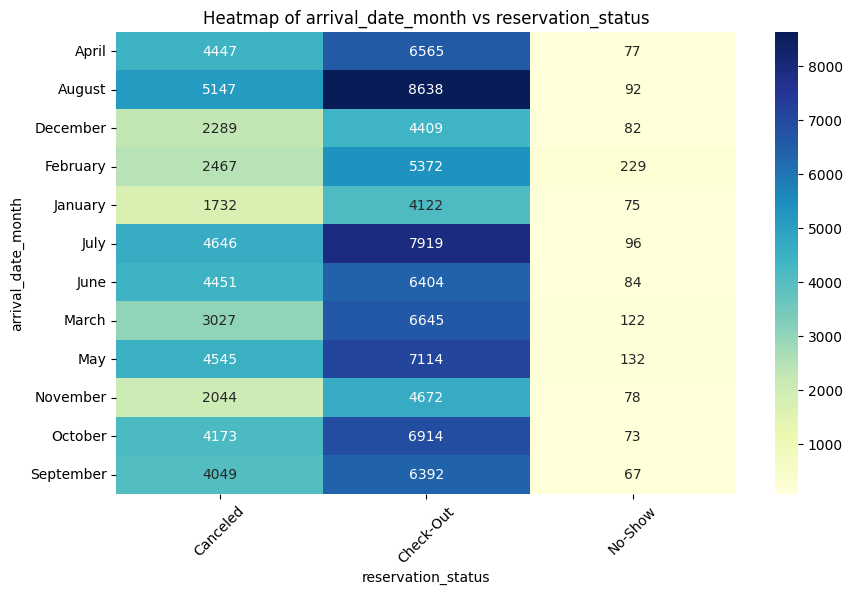

Heatmap for arrival_date_week_number vs arrival_date_day_of_month


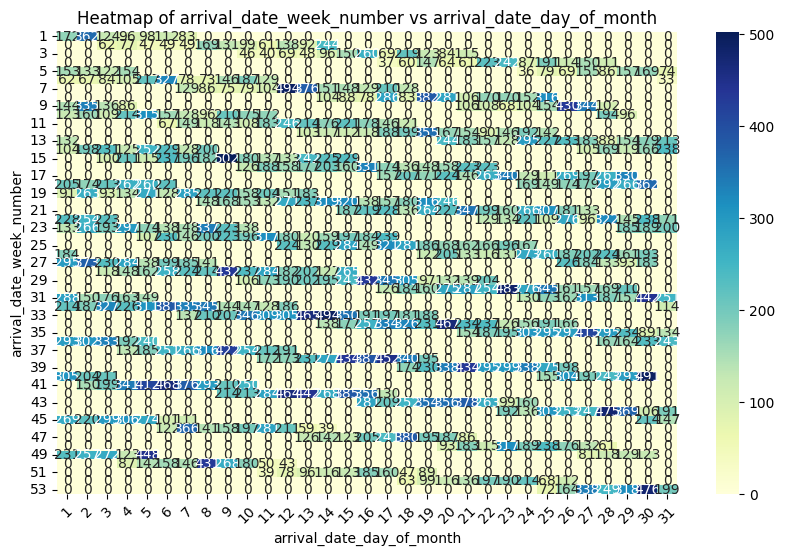

Heatmap for arrival_date_week_number vs meal


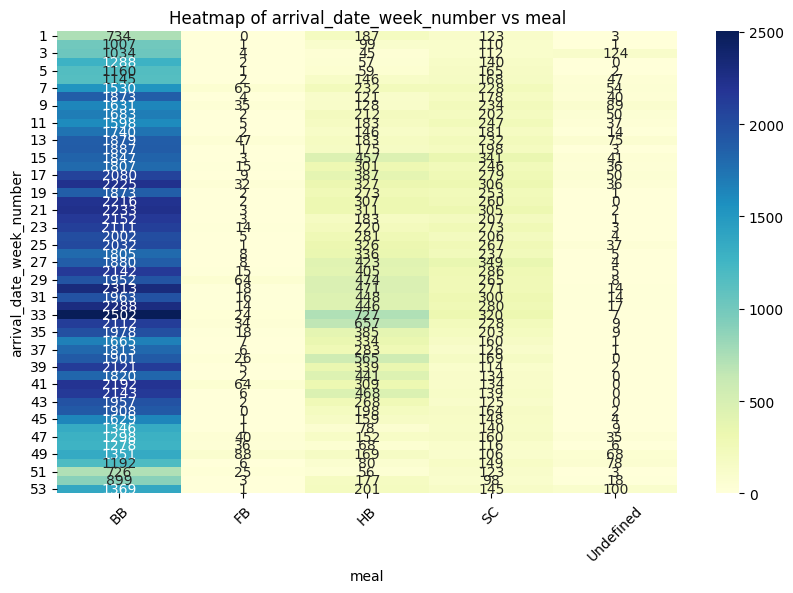

Heatmap for arrival_date_week_number vs country


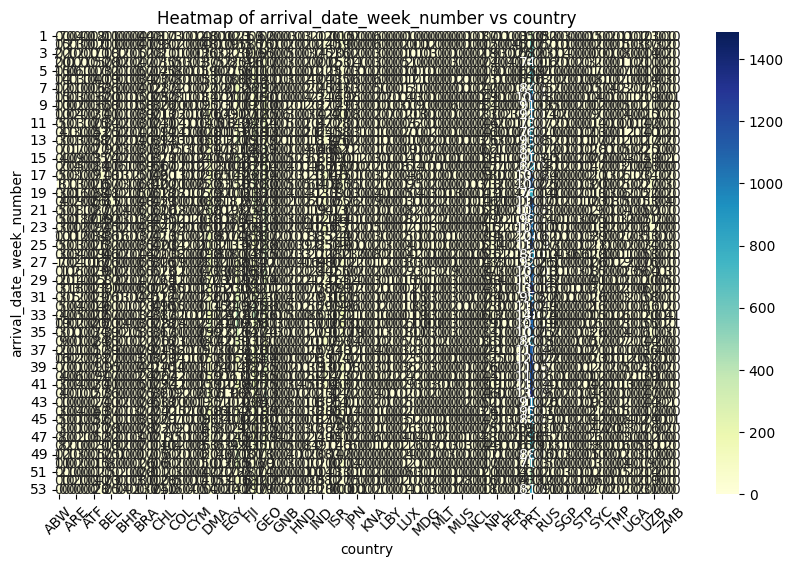

Heatmap for arrival_date_week_number vs market_segment


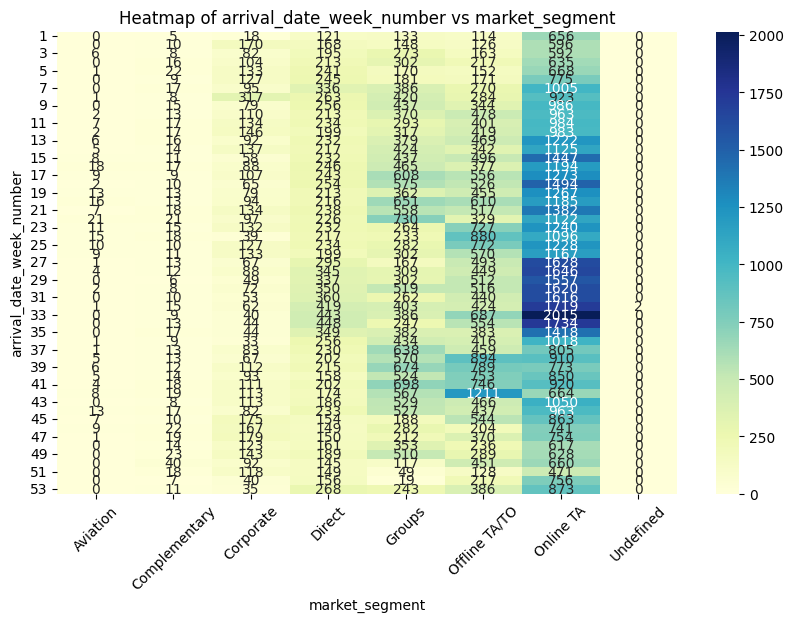

Heatmap for arrival_date_week_number vs distribution_channel


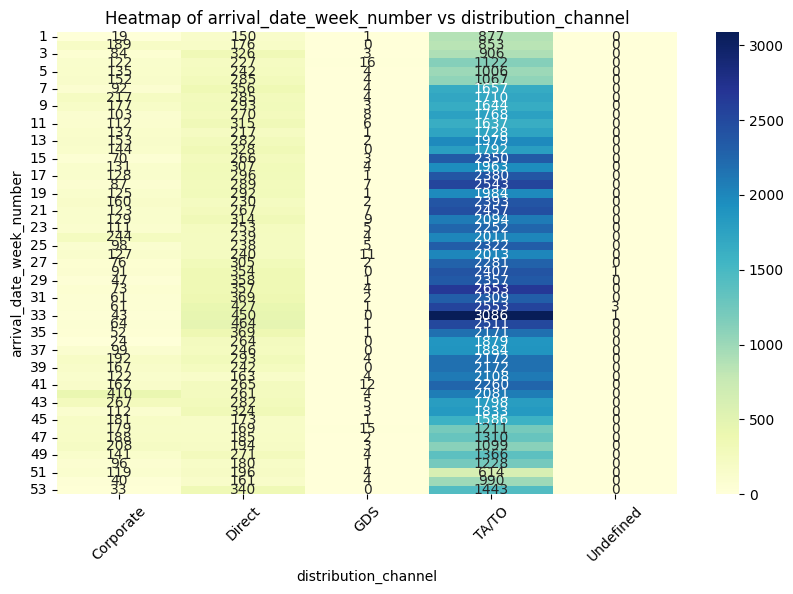

Heatmap for arrival_date_week_number vs is_repeated_guest


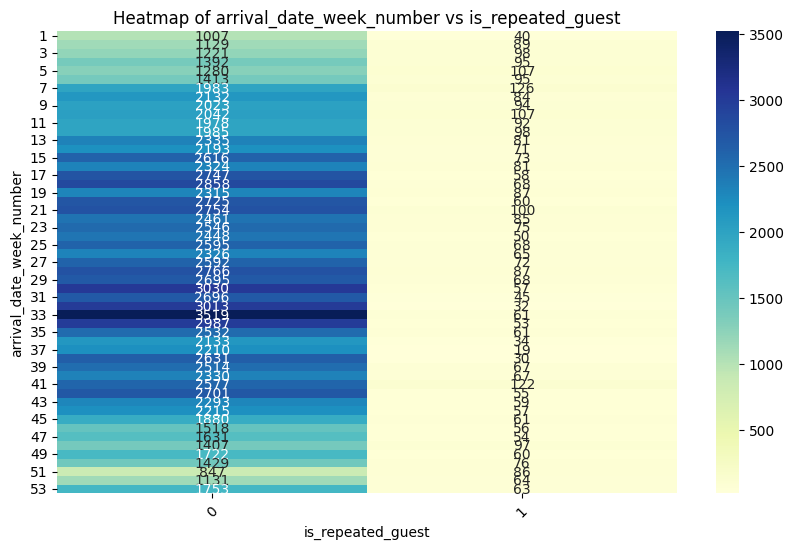

Heatmap for arrival_date_week_number vs reserved_room_type


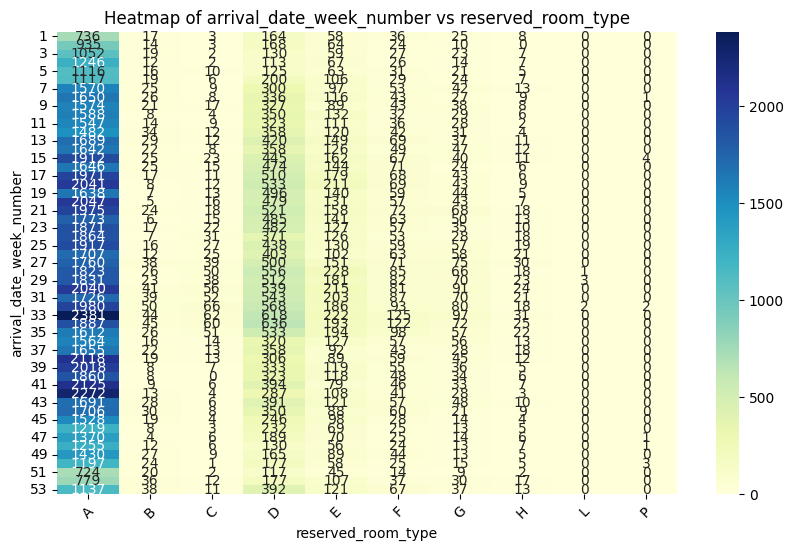

Heatmap for arrival_date_week_number vs assigned_room_type


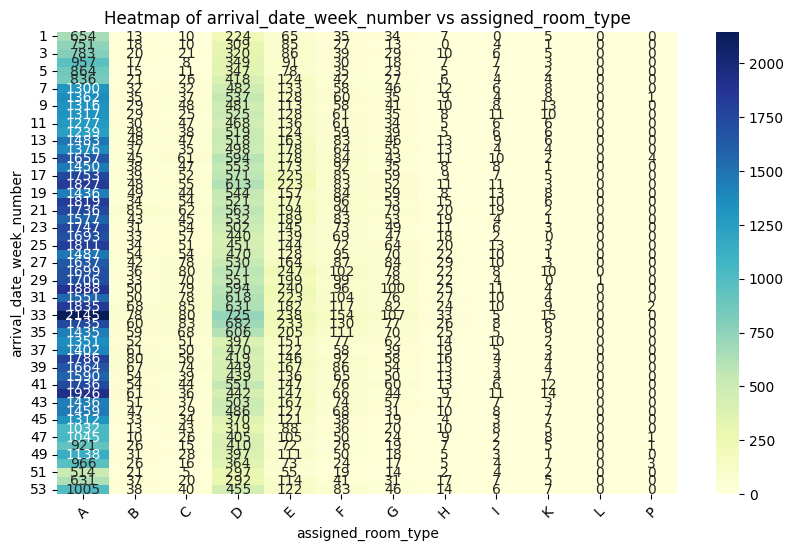

Heatmap for arrival_date_week_number vs deposit_type


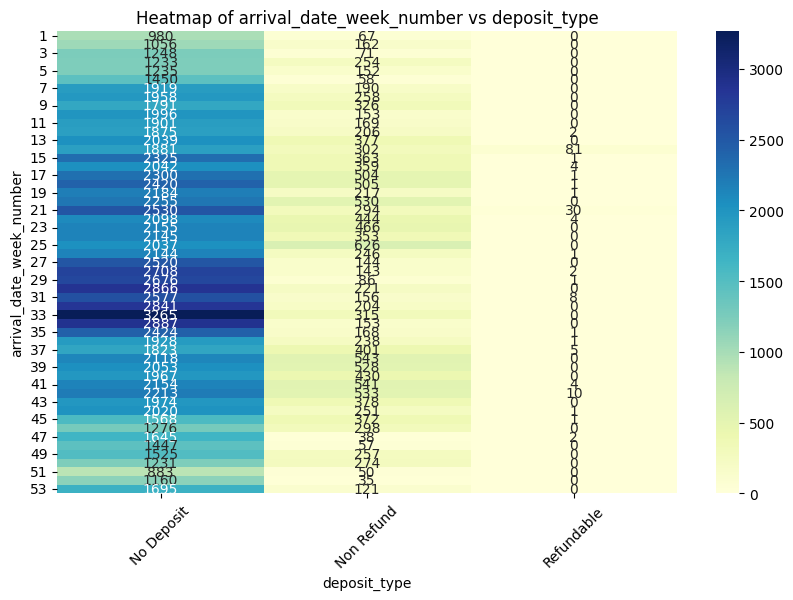

Heatmap for arrival_date_week_number vs customer_type


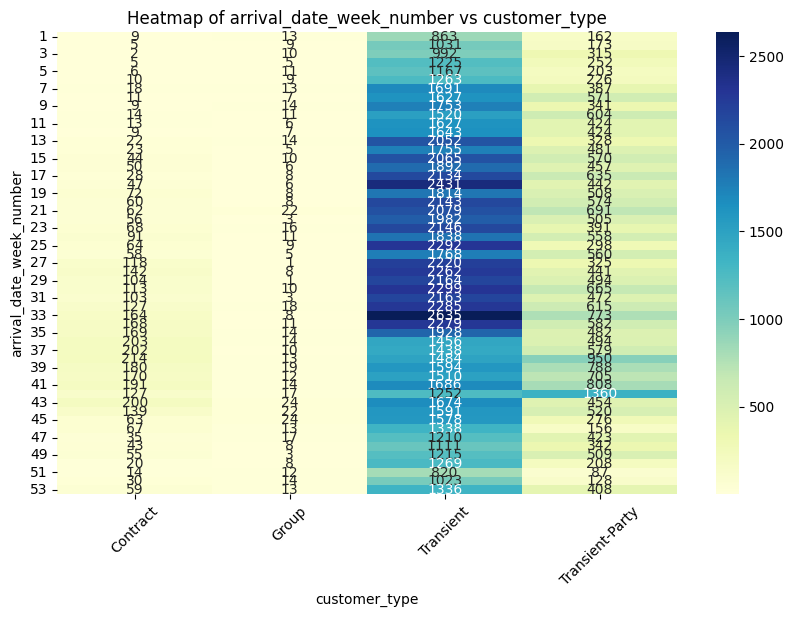

Heatmap for arrival_date_week_number vs reservation_status


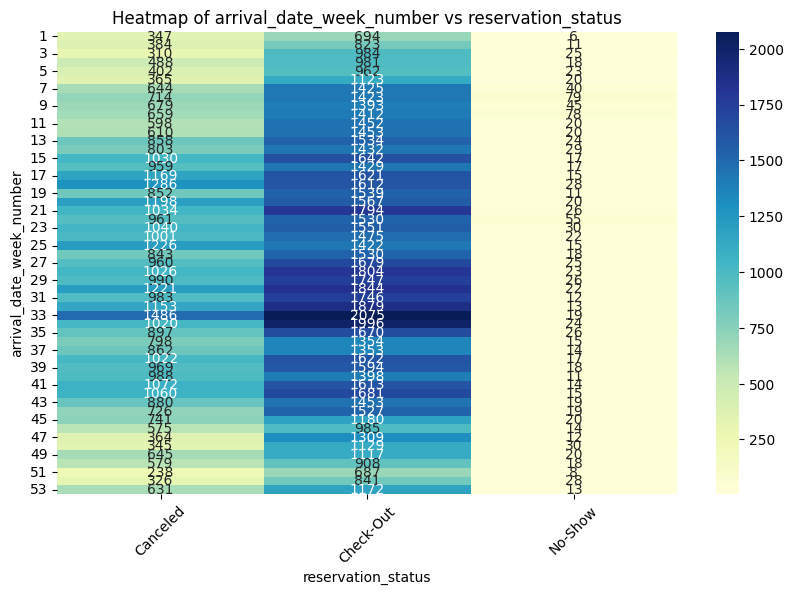

Heatmap for arrival_date_day_of_month vs meal


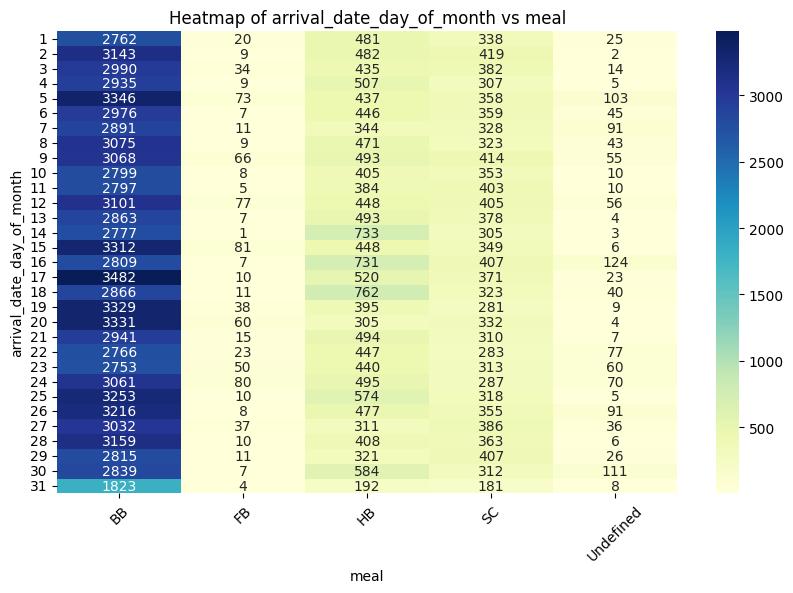

Heatmap for arrival_date_day_of_month vs country


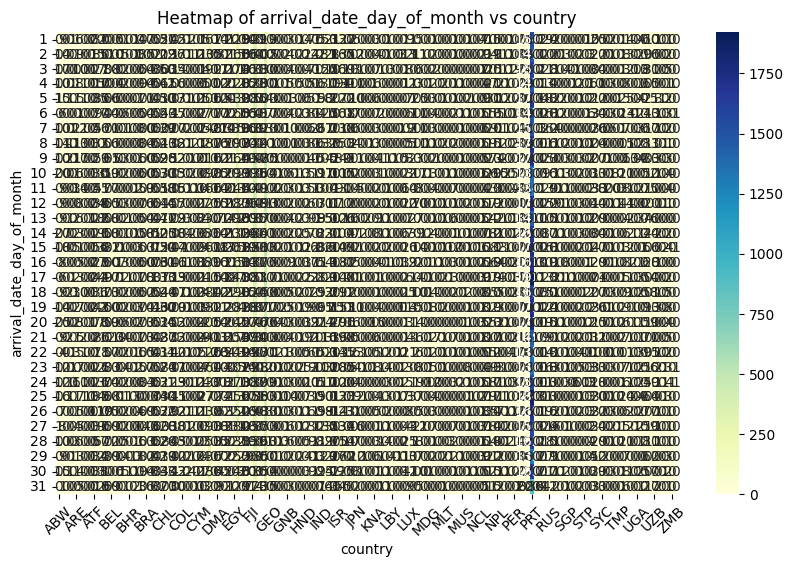

Heatmap for arrival_date_day_of_month vs market_segment


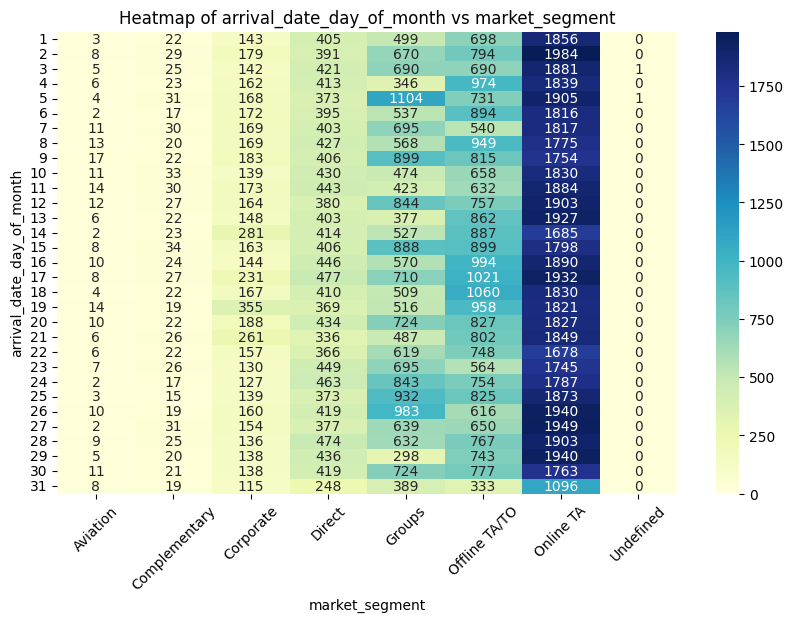

Heatmap for arrival_date_day_of_month vs distribution_channel


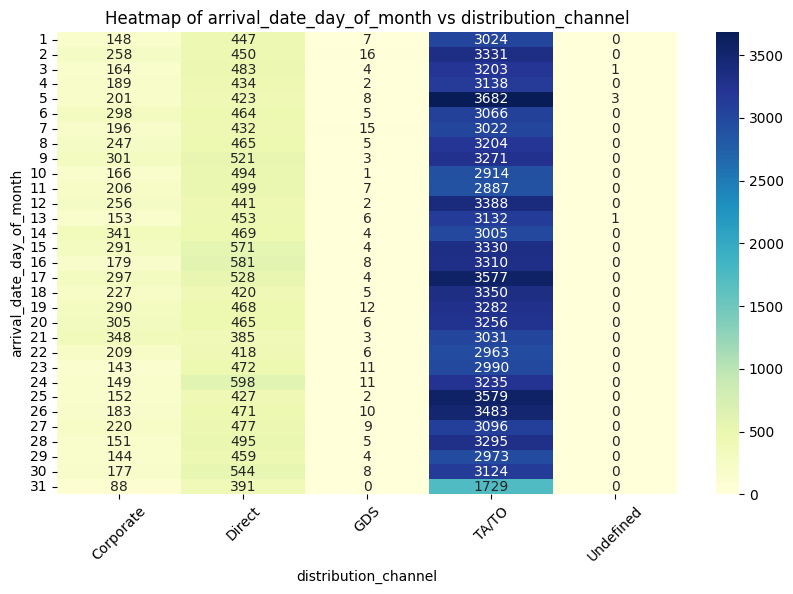

Heatmap for arrival_date_day_of_month vs is_repeated_guest


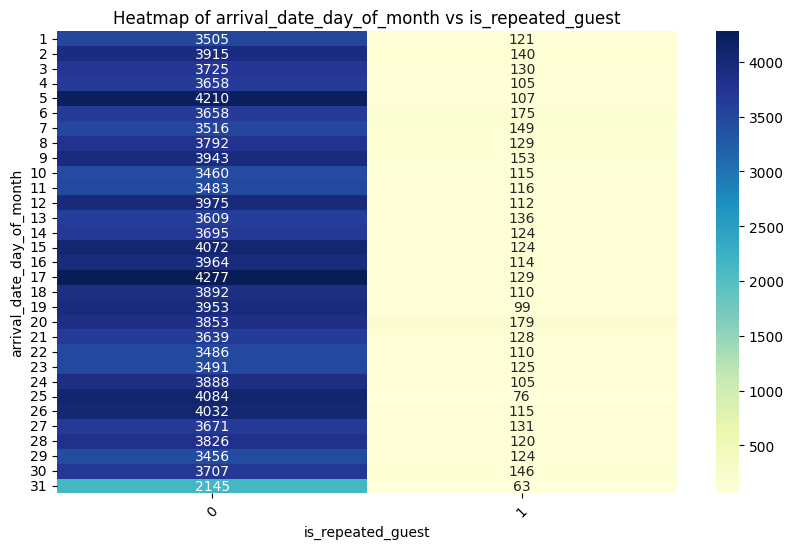

Heatmap for arrival_date_day_of_month vs reserved_room_type


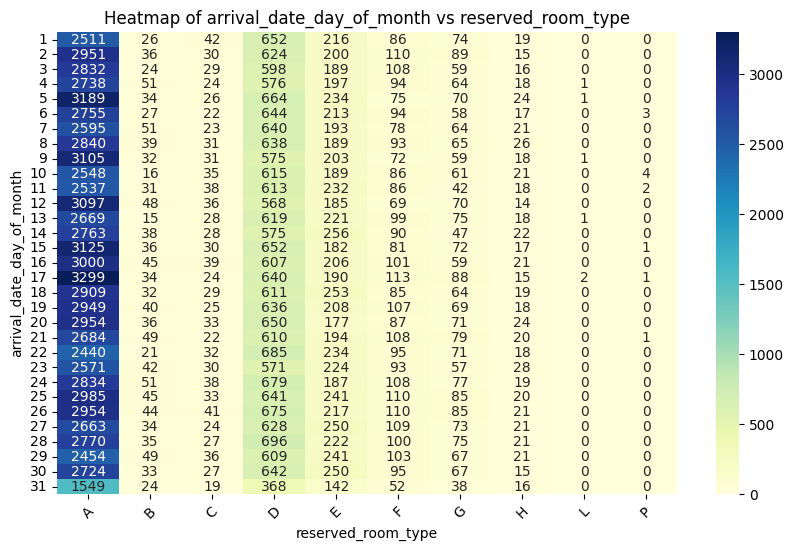

Heatmap for arrival_date_day_of_month vs assigned_room_type


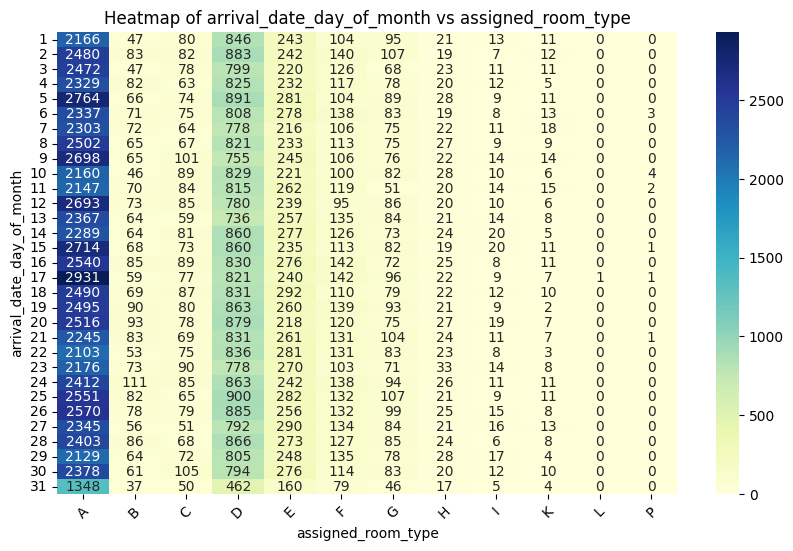

Heatmap for arrival_date_day_of_month vs deposit_type


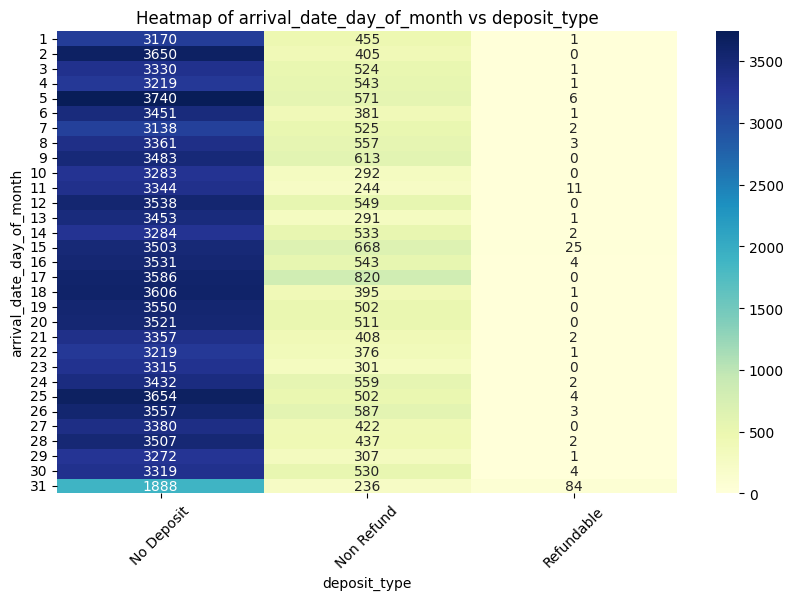

Heatmap for arrival_date_day_of_month vs customer_type


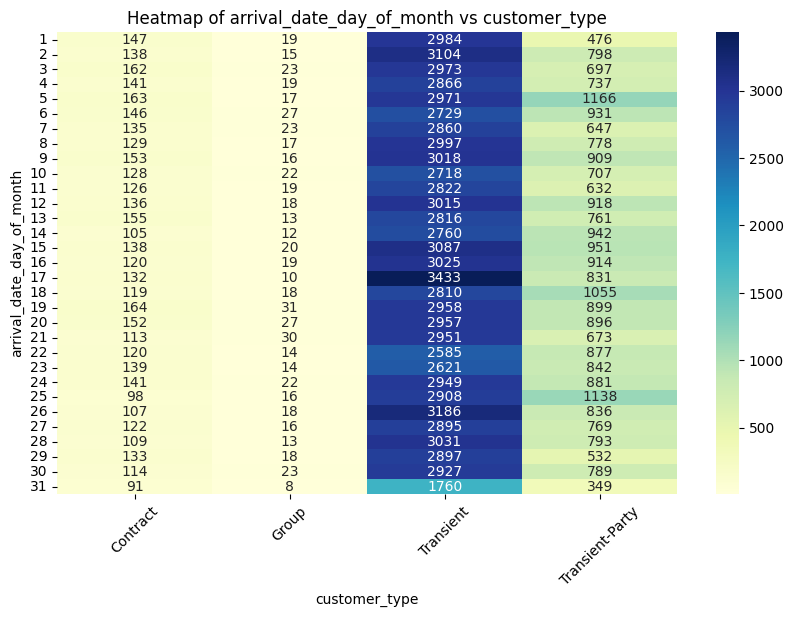

Heatmap for arrival_date_day_of_month vs reservation_status


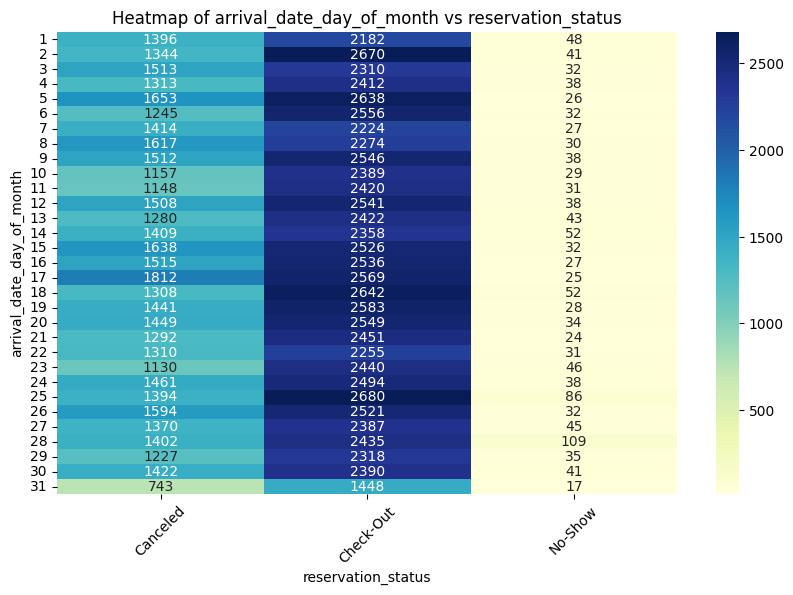

Heatmap for meal vs country


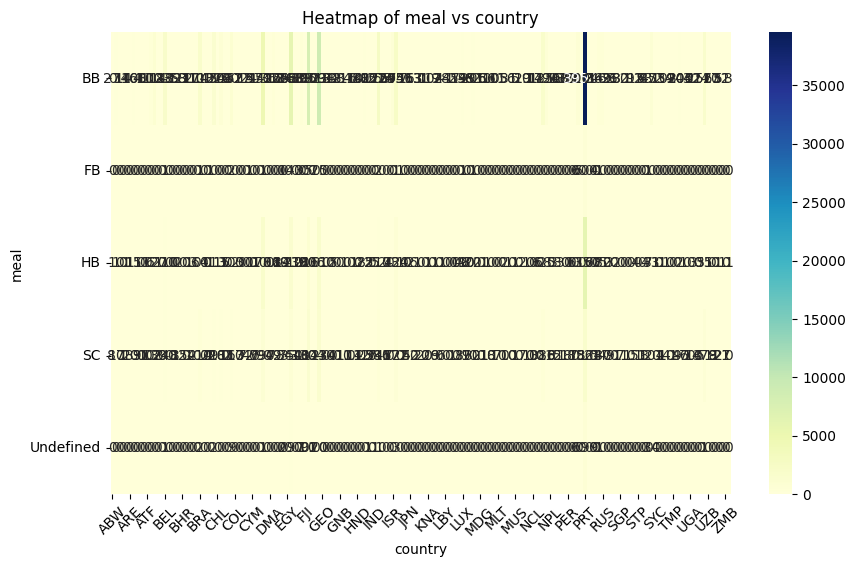

Heatmap for meal vs market_segment


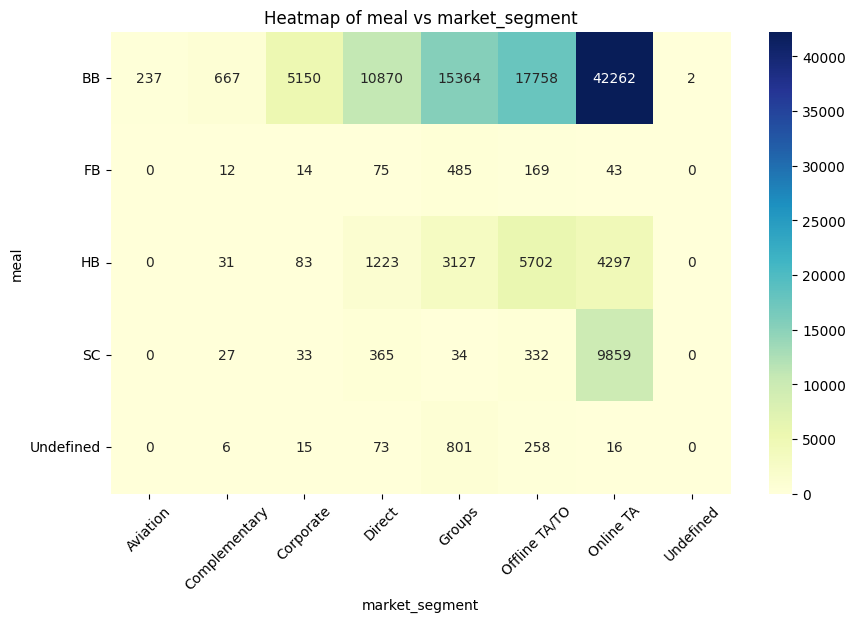

Heatmap for meal vs distribution_channel


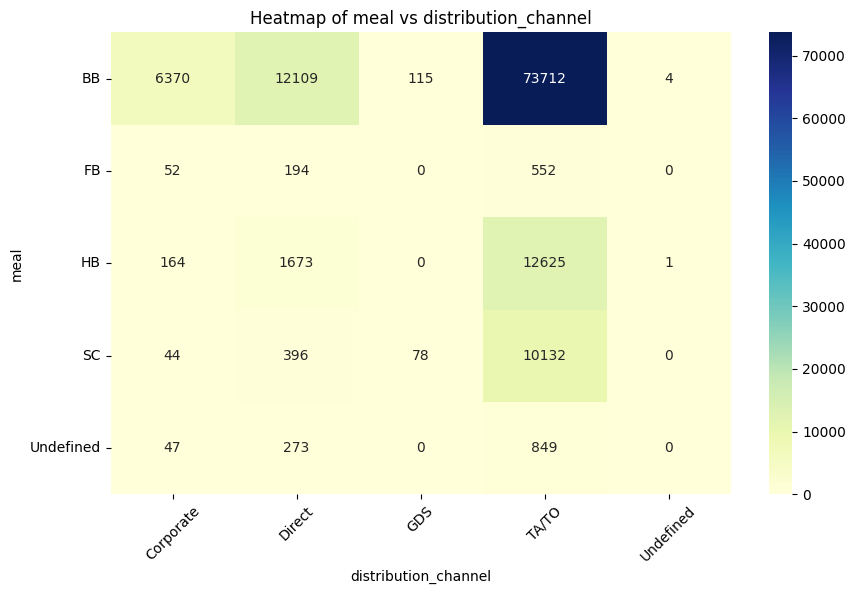

Heatmap for meal vs is_repeated_guest


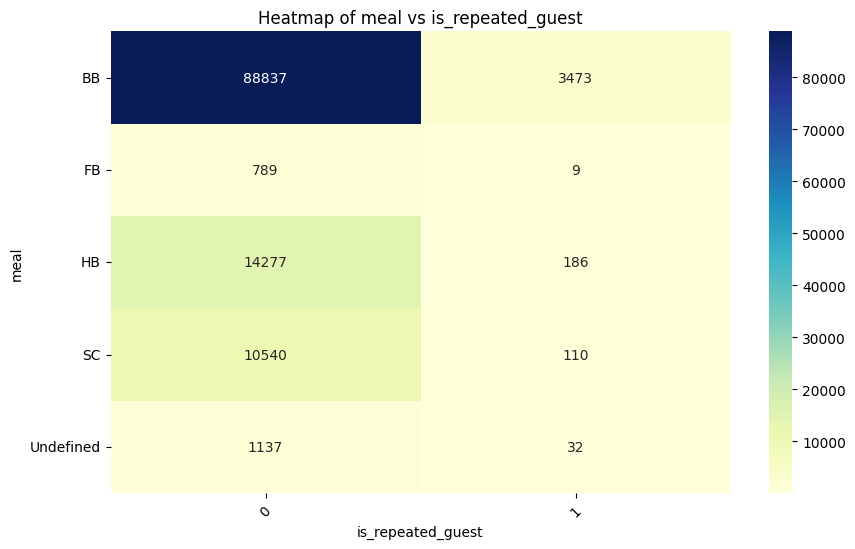

Heatmap for meal vs reserved_room_type


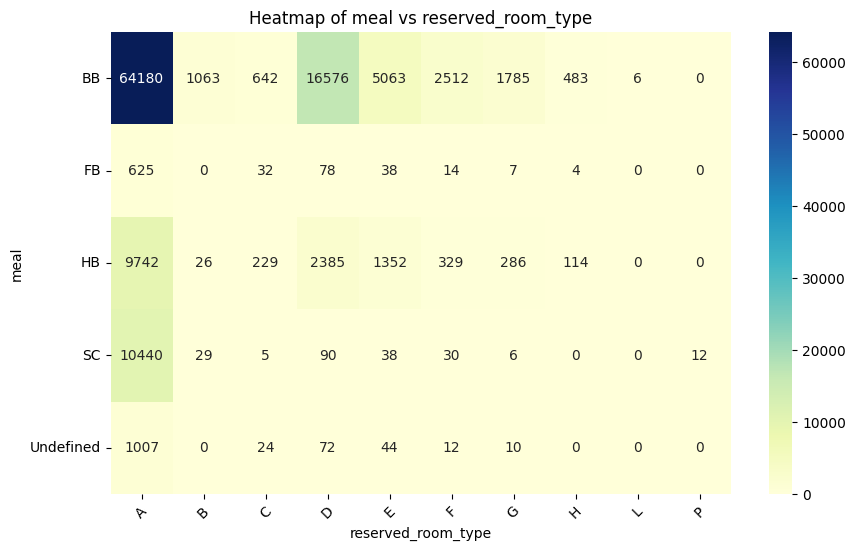

Heatmap for meal vs assigned_room_type


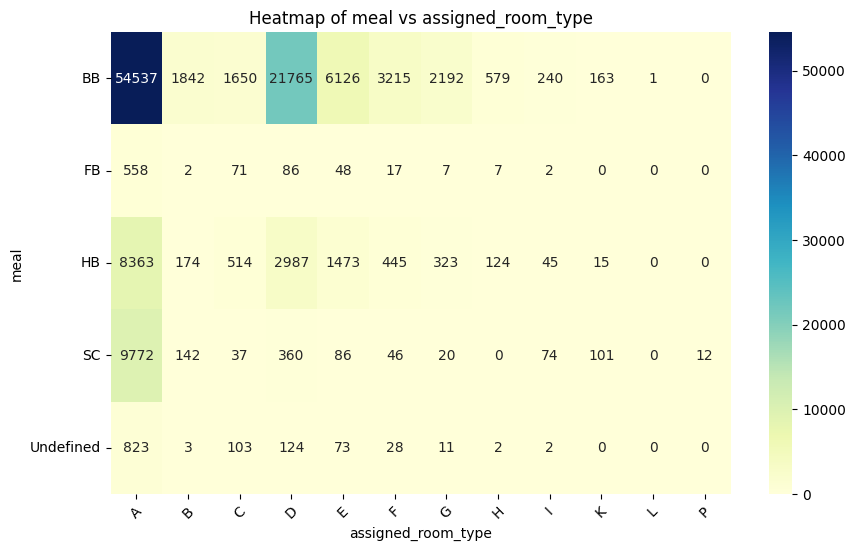

Heatmap for meal vs deposit_type


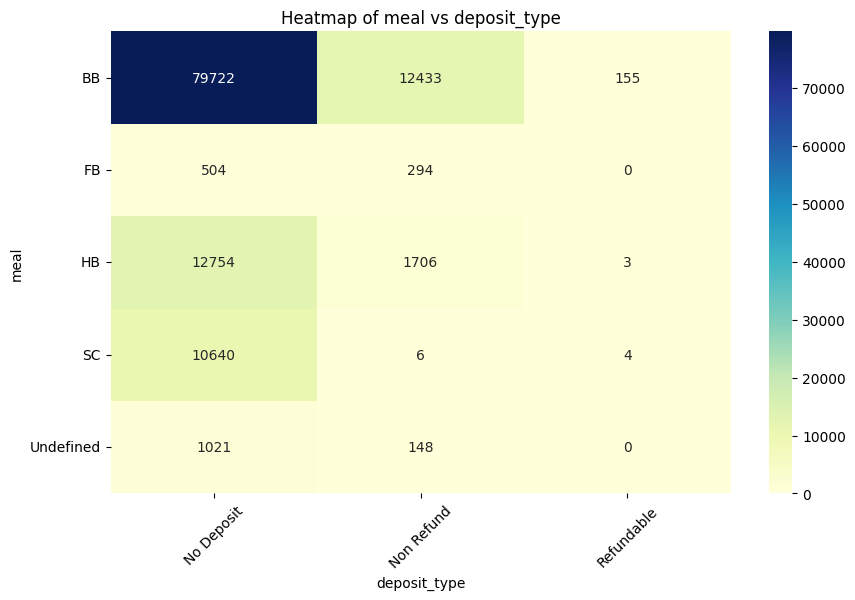

Heatmap for meal vs customer_type


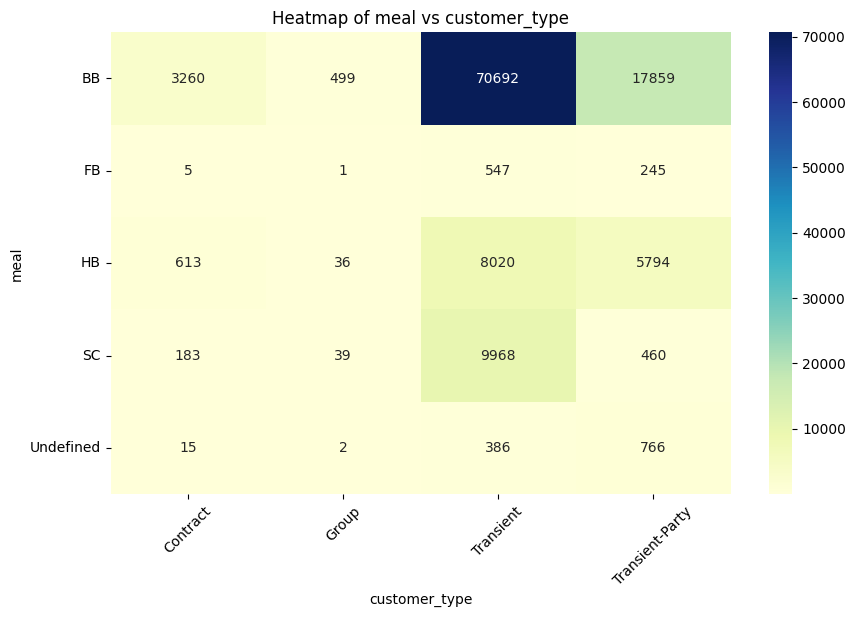

Heatmap for meal vs reservation_status


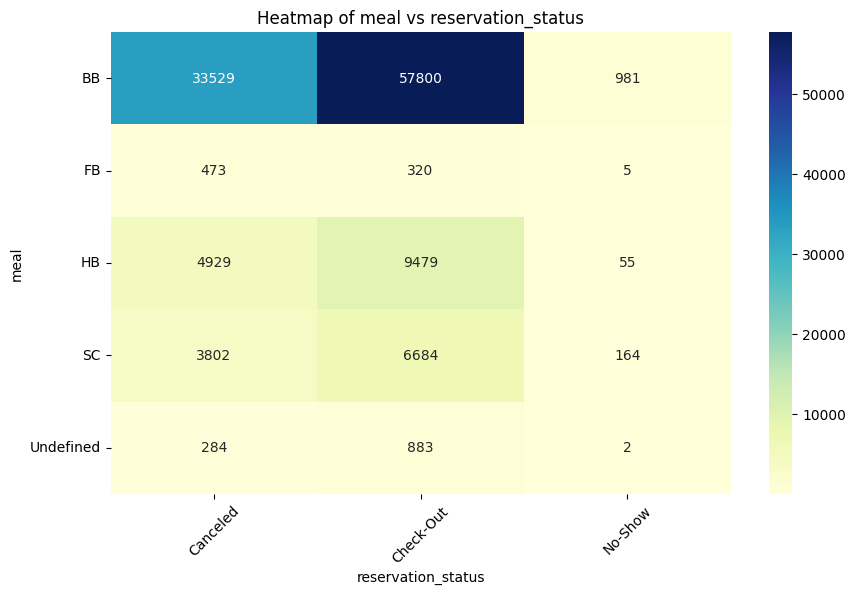

Heatmap for country vs market_segment


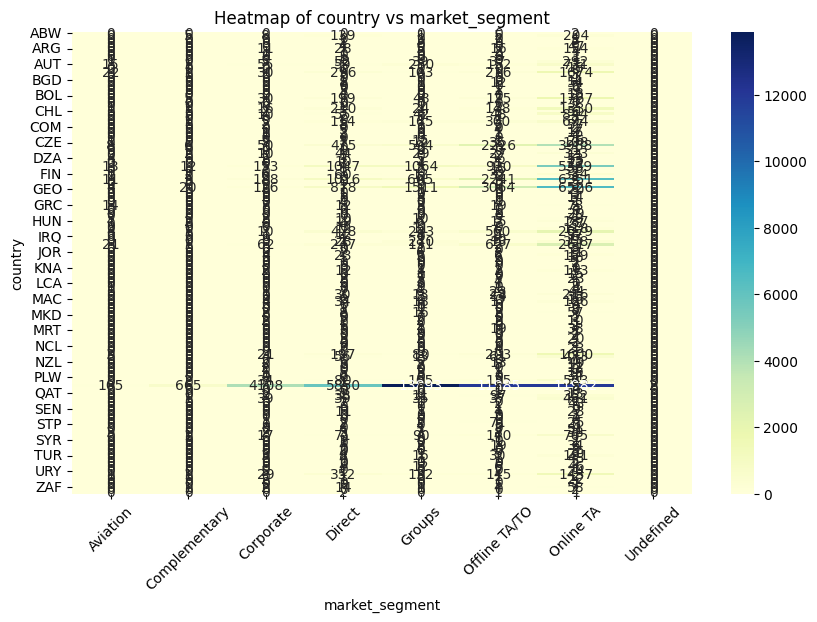

Heatmap for country vs distribution_channel


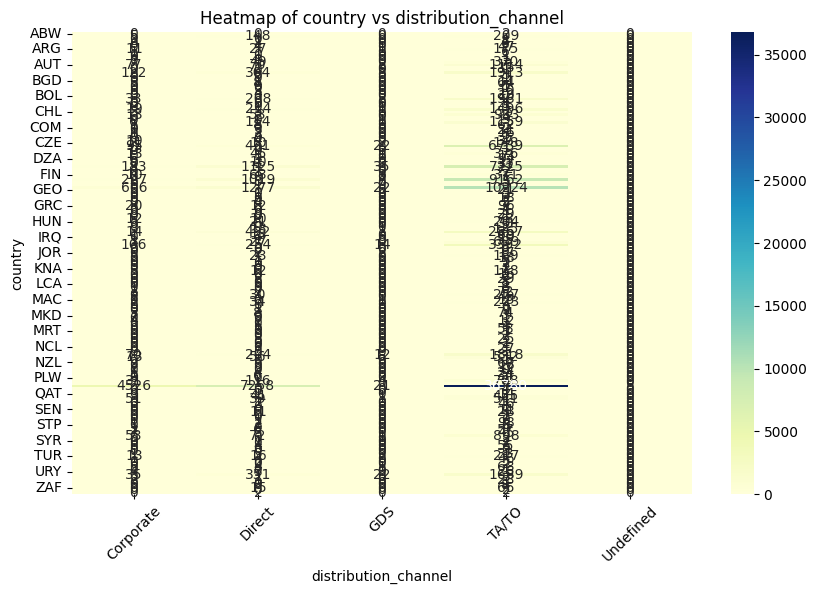

Heatmap for country vs is_repeated_guest


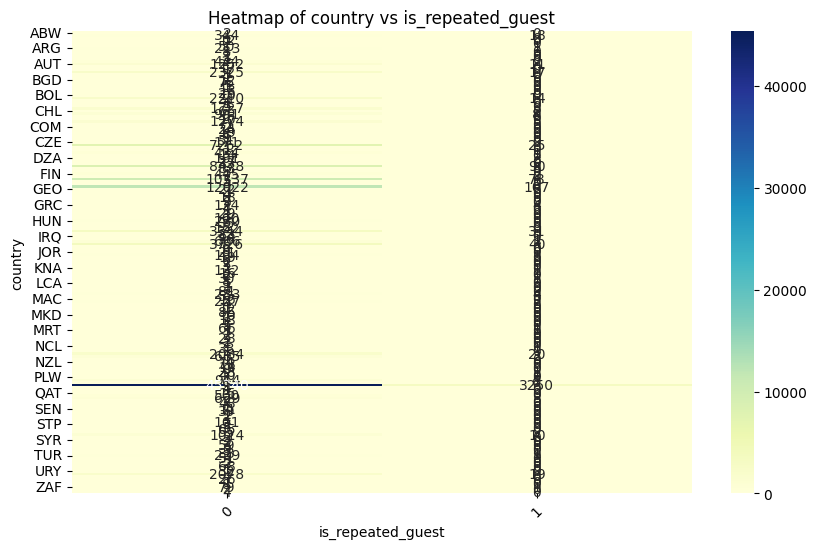

Heatmap for country vs reserved_room_type


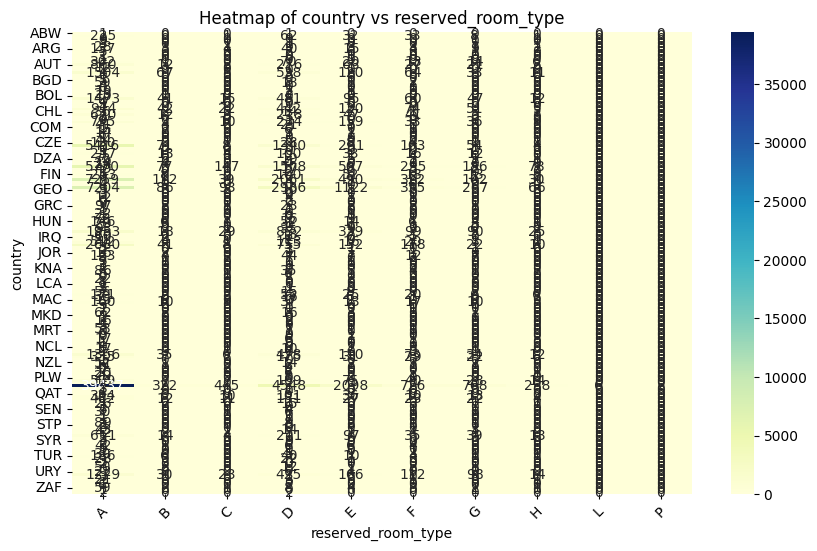

Heatmap for country vs assigned_room_type


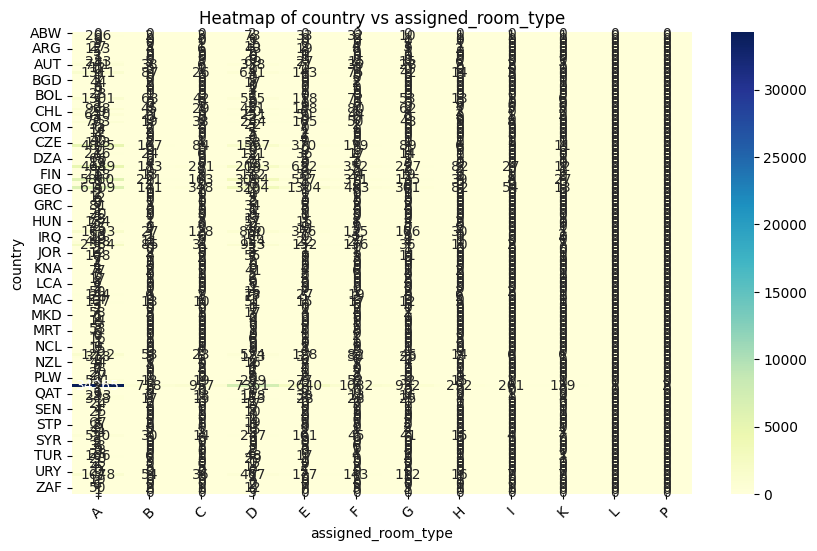

Heatmap for country vs deposit_type


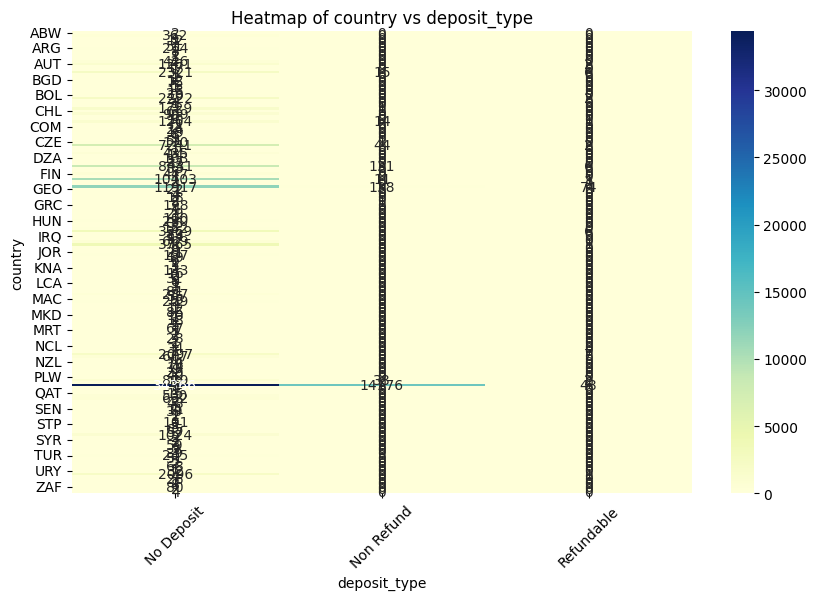

Heatmap for country vs customer_type


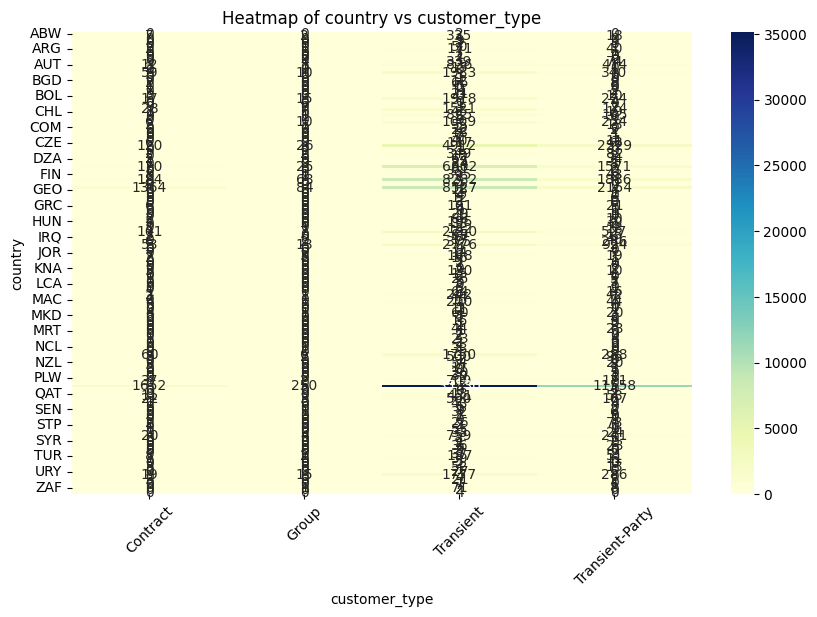

Heatmap for country vs reservation_status


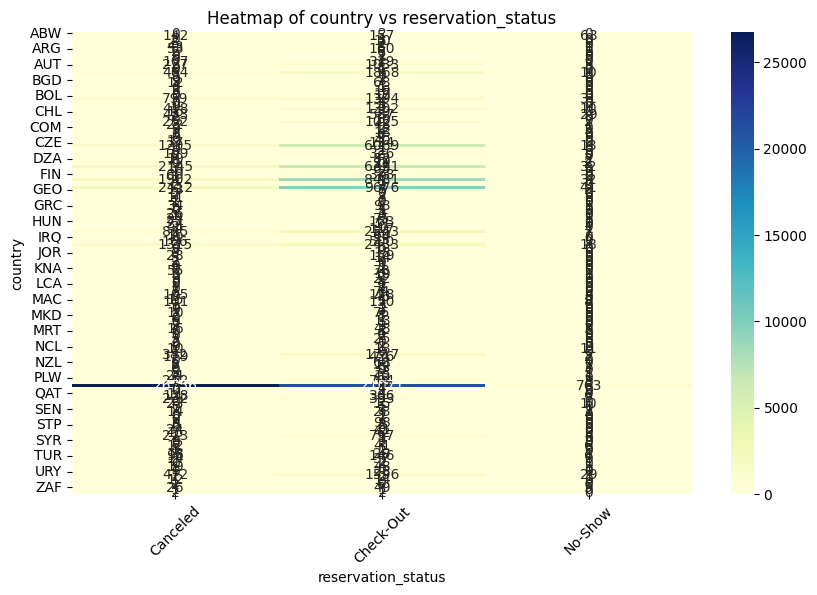

Heatmap for market_segment vs distribution_channel


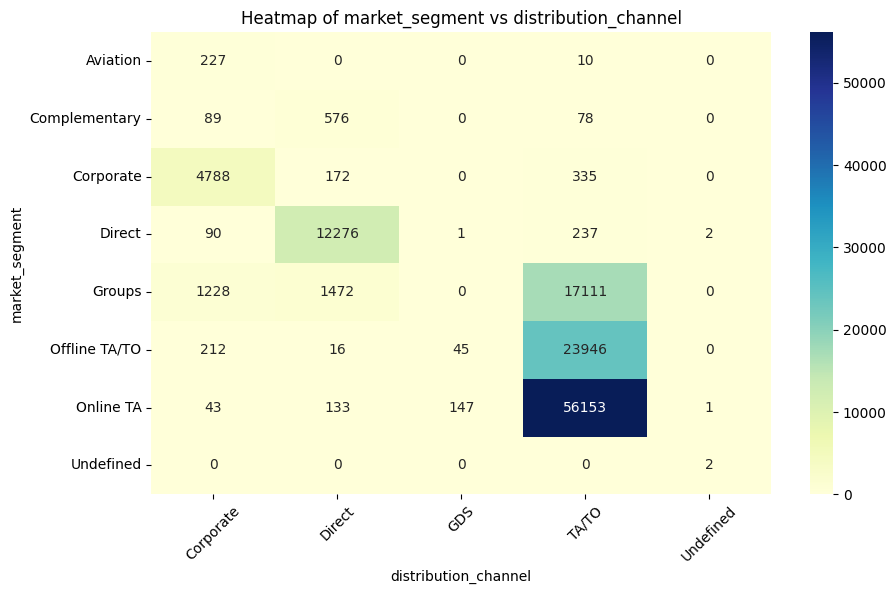

Heatmap for market_segment vs is_repeated_guest


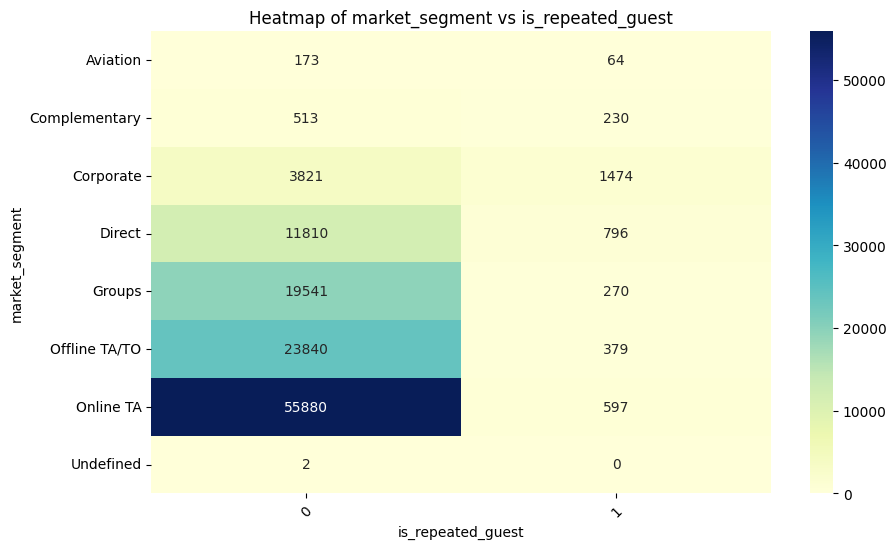

Heatmap for market_segment vs reserved_room_type


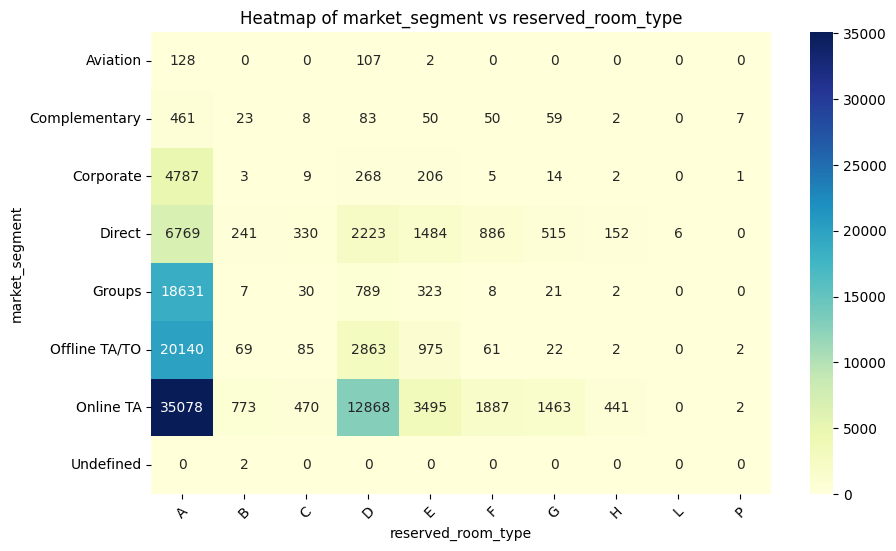

Heatmap for market_segment vs assigned_room_type


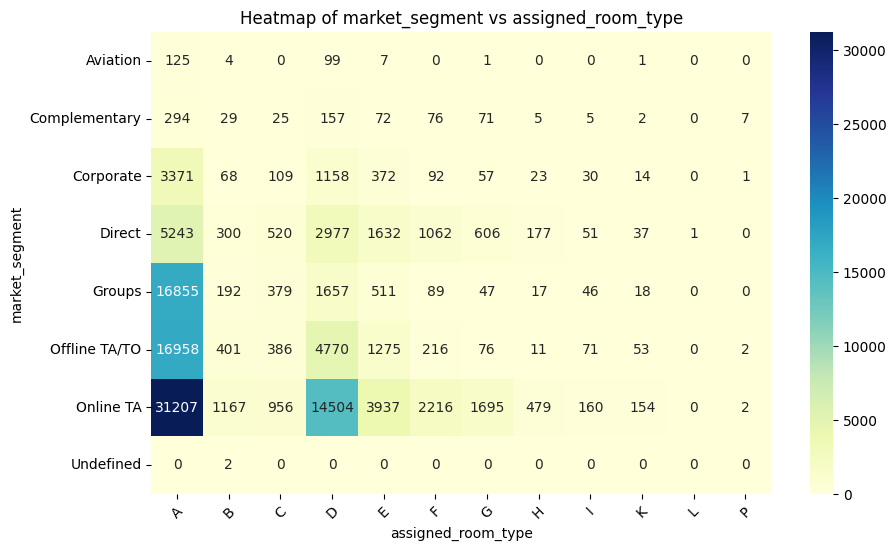

Heatmap for market_segment vs deposit_type


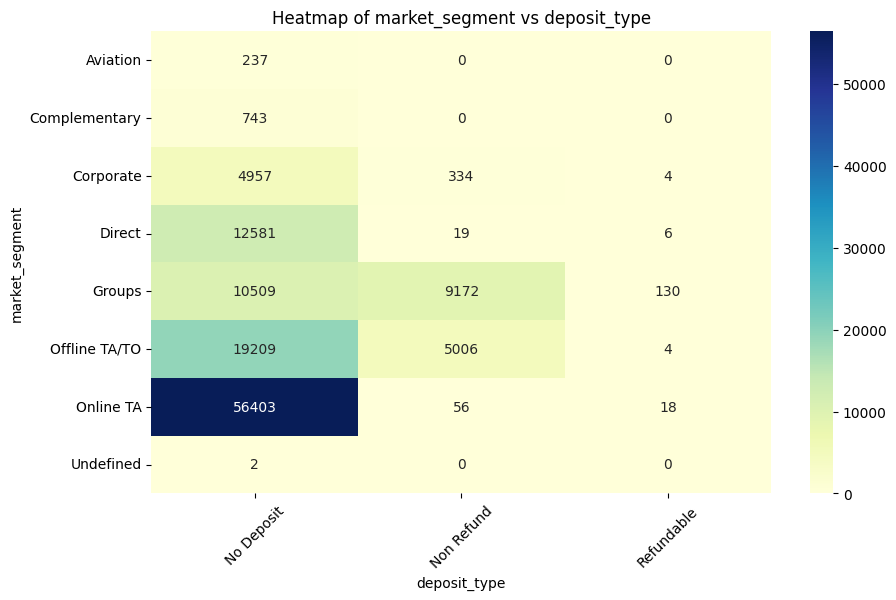

Heatmap for market_segment vs customer_type


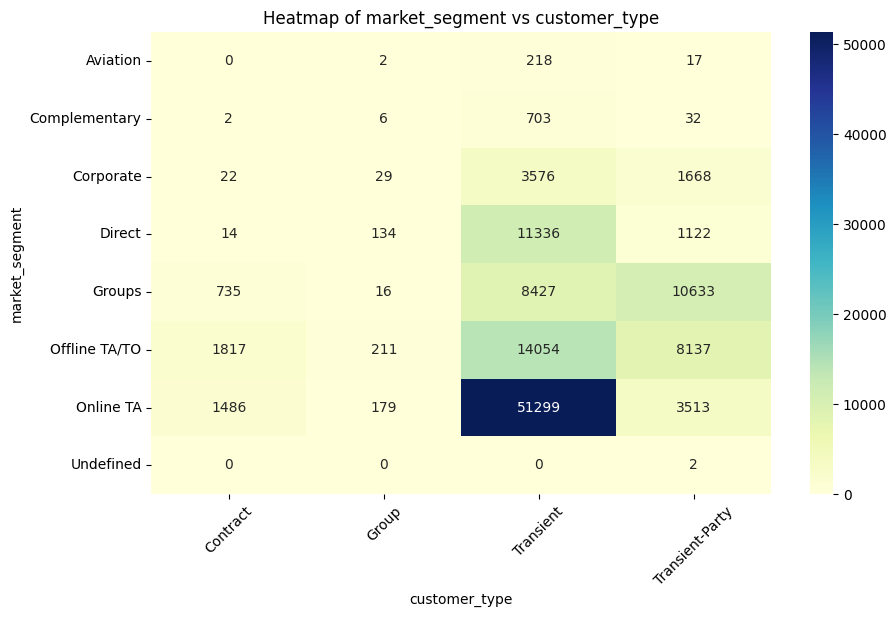

Heatmap for market_segment vs reservation_status


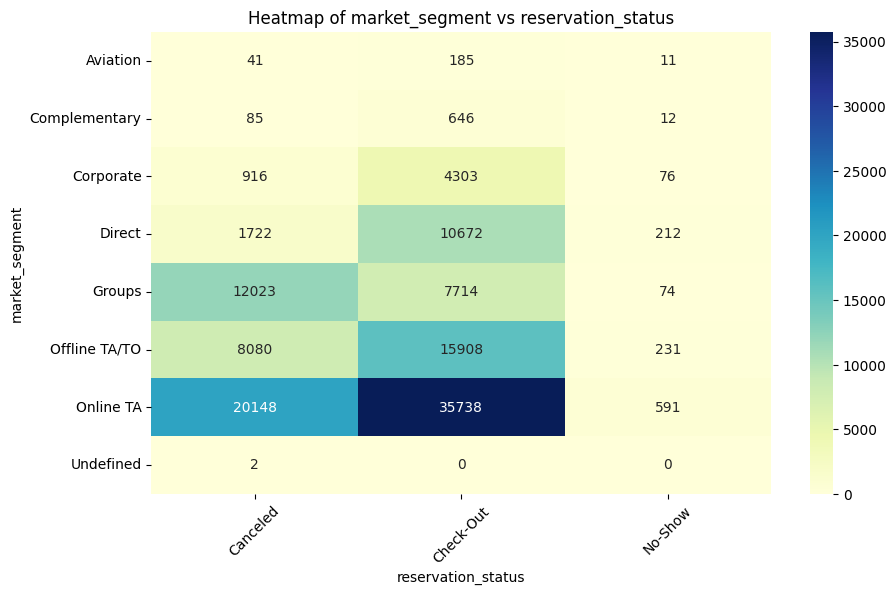

Heatmap for distribution_channel vs is_repeated_guest


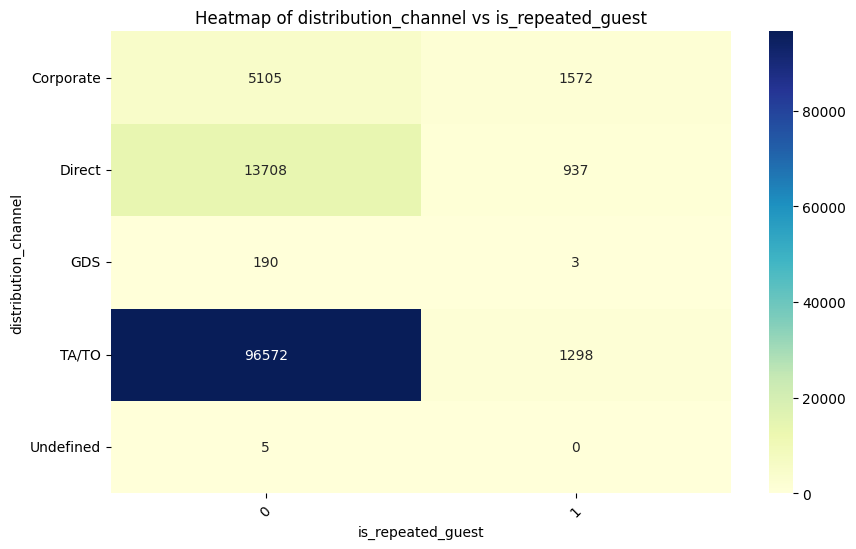

Heatmap for distribution_channel vs reserved_room_type


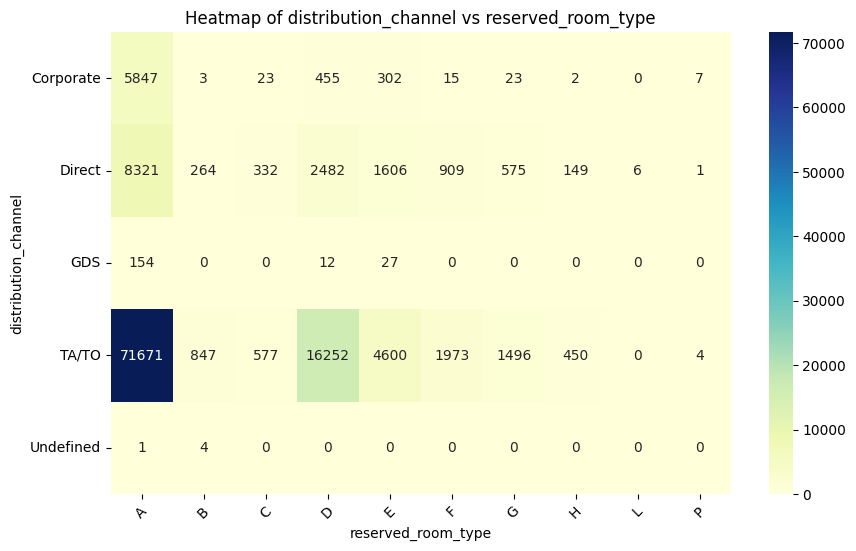

Heatmap for distribution_channel vs assigned_room_type


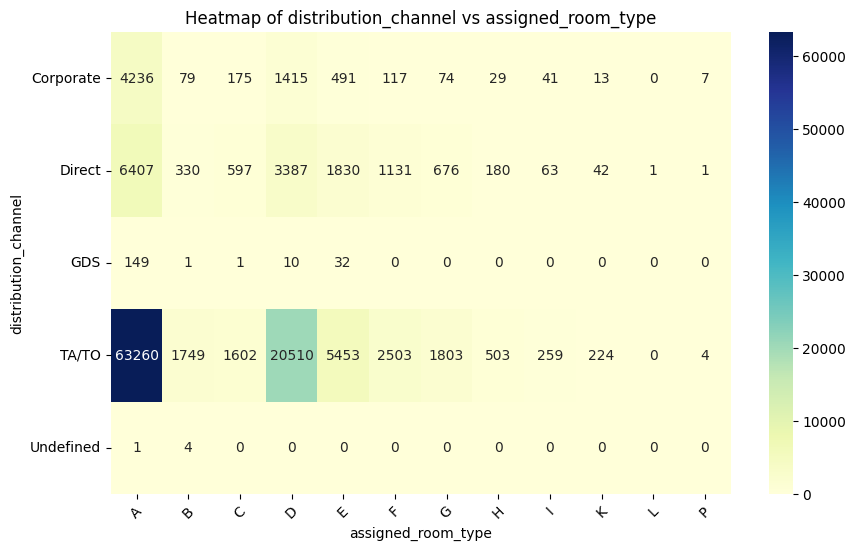

Heatmap for distribution_channel vs deposit_type


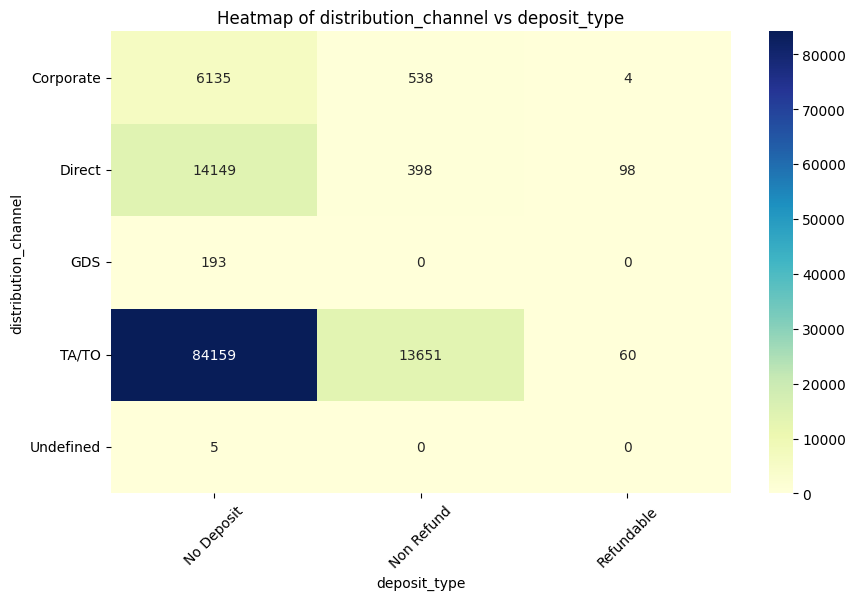

Heatmap for distribution_channel vs customer_type


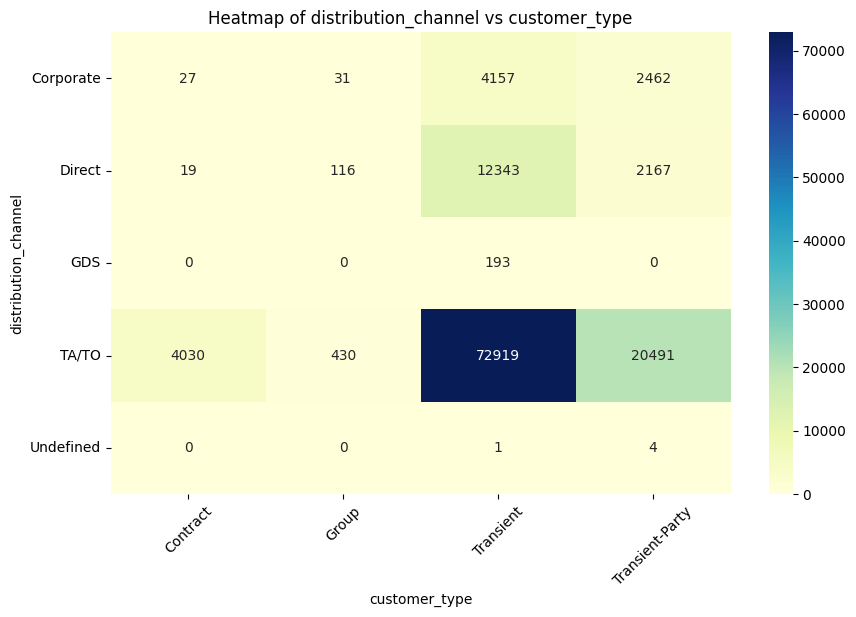

Heatmap for distribution_channel vs reservation_status


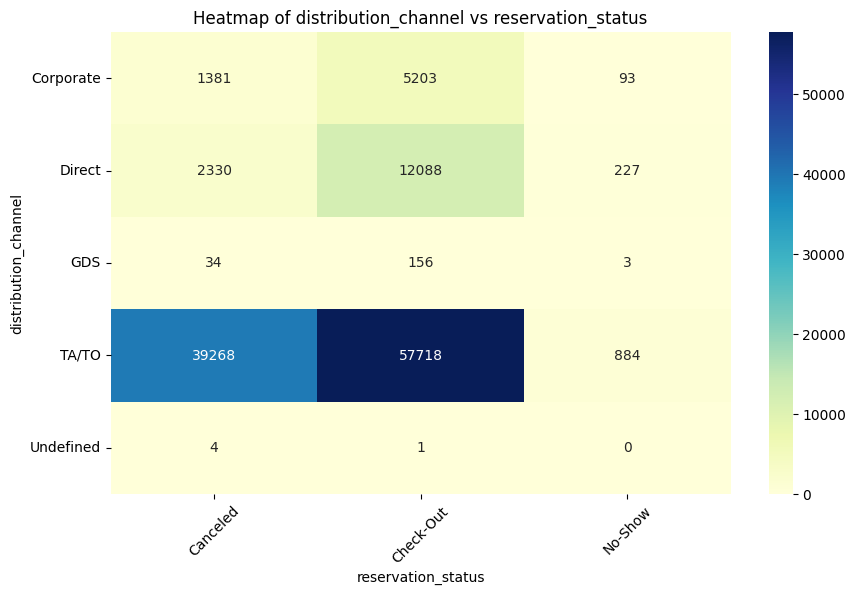

Heatmap for is_repeated_guest vs reserved_room_type


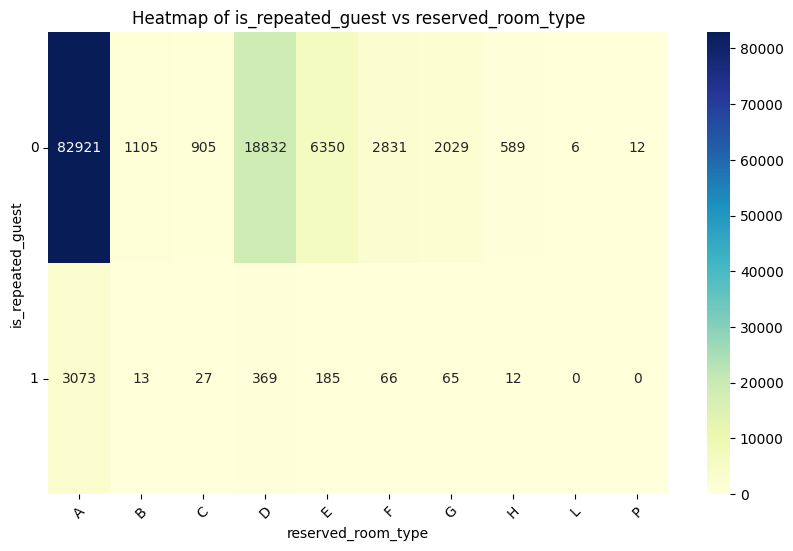

Heatmap for is_repeated_guest vs assigned_room_type


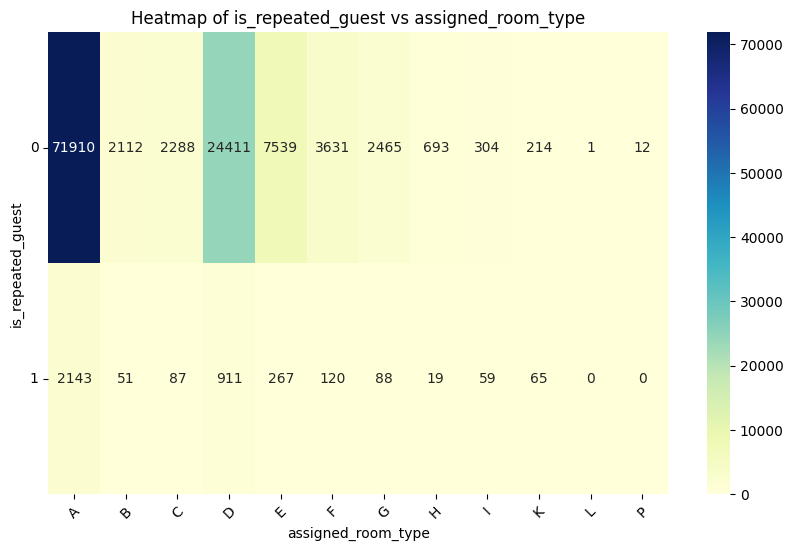

Heatmap for is_repeated_guest vs deposit_type


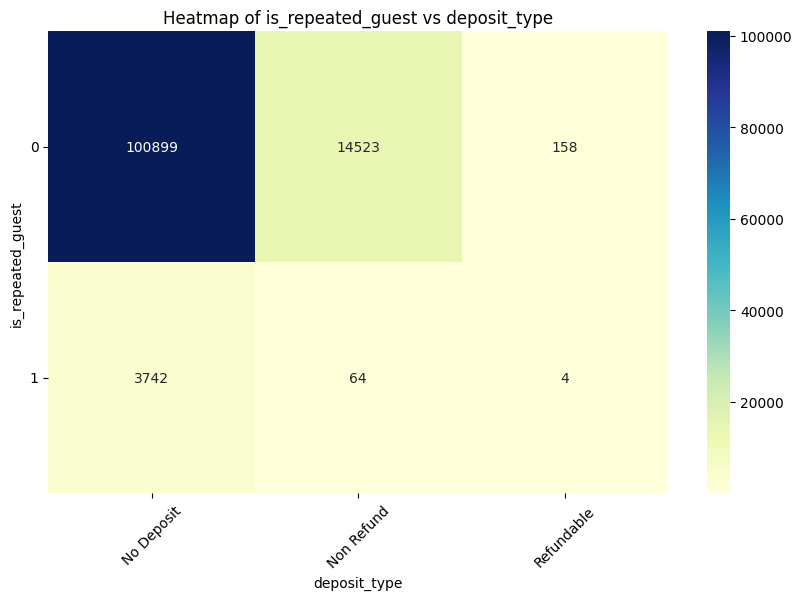

Heatmap for is_repeated_guest vs customer_type


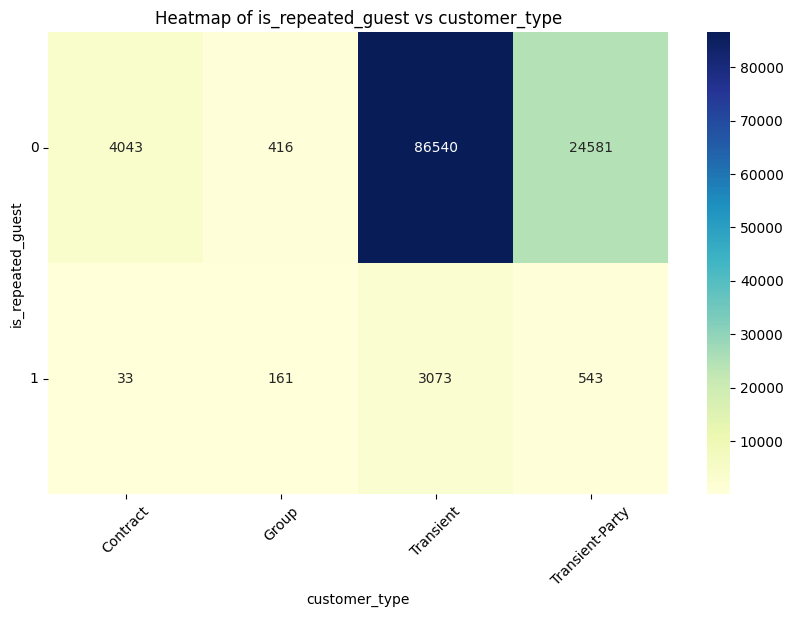

Heatmap for is_repeated_guest vs reservation_status


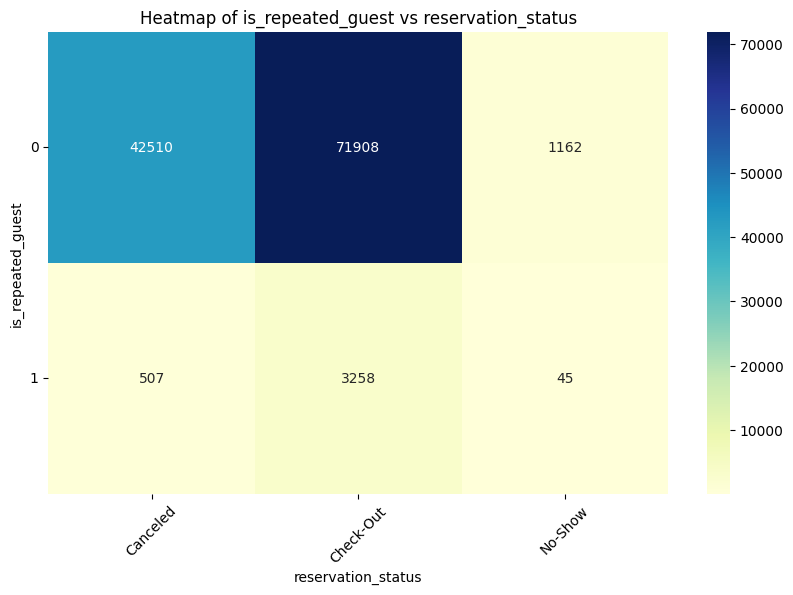

Heatmap for reserved_room_type vs assigned_room_type


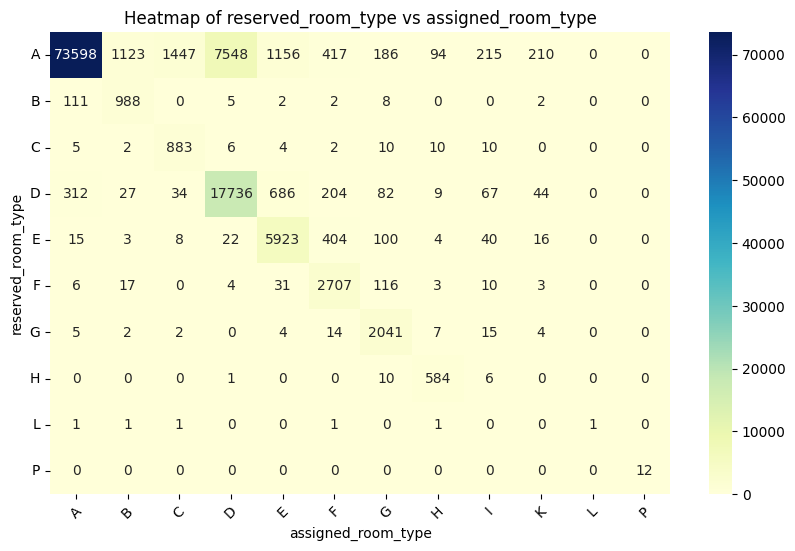

Heatmap for reserved_room_type vs deposit_type


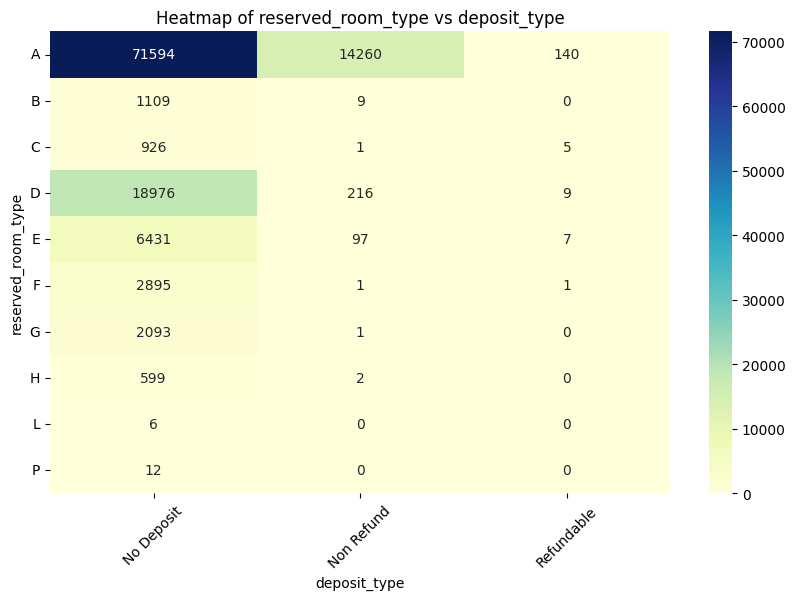

Heatmap for reserved_room_type vs customer_type


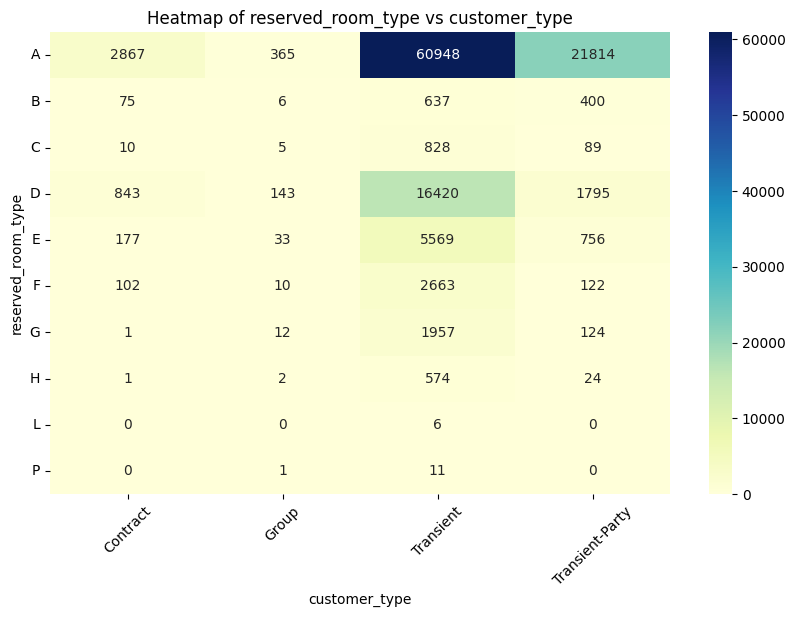

Heatmap for reserved_room_type vs reservation_status


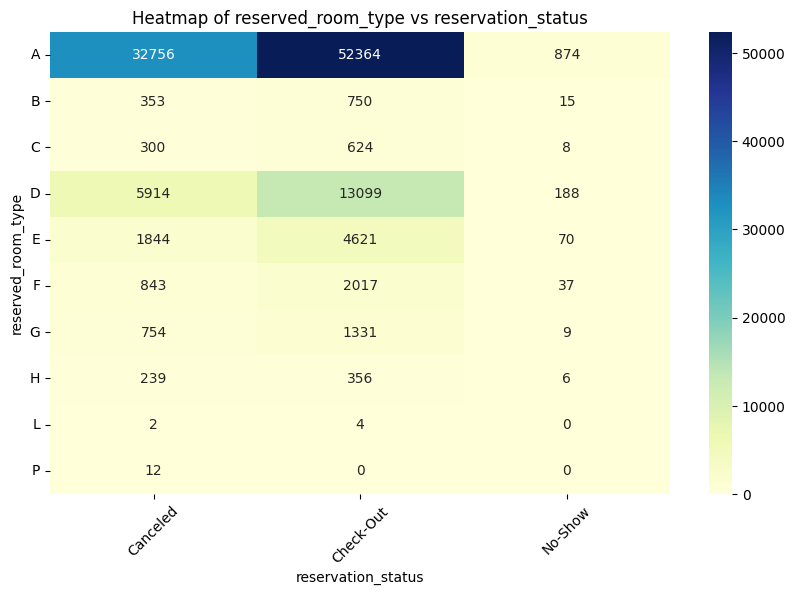

Heatmap for assigned_room_type vs deposit_type


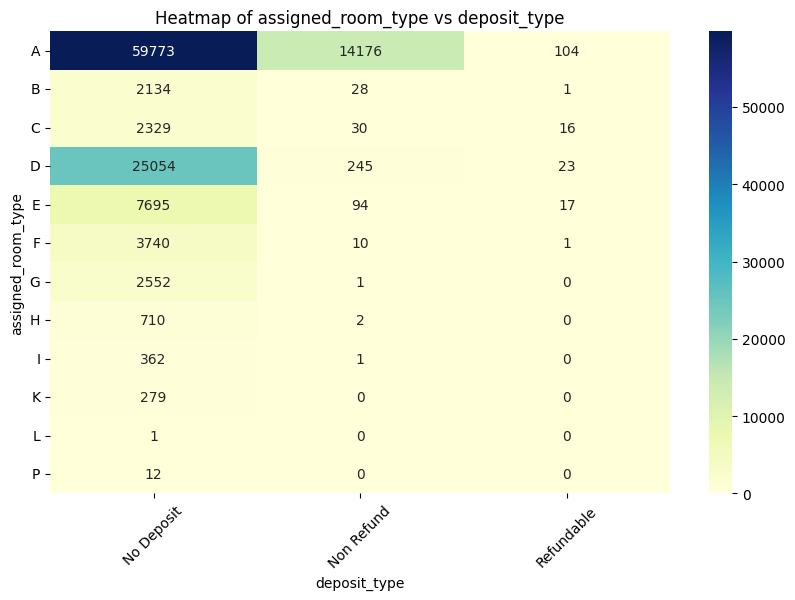

Heatmap for assigned_room_type vs customer_type


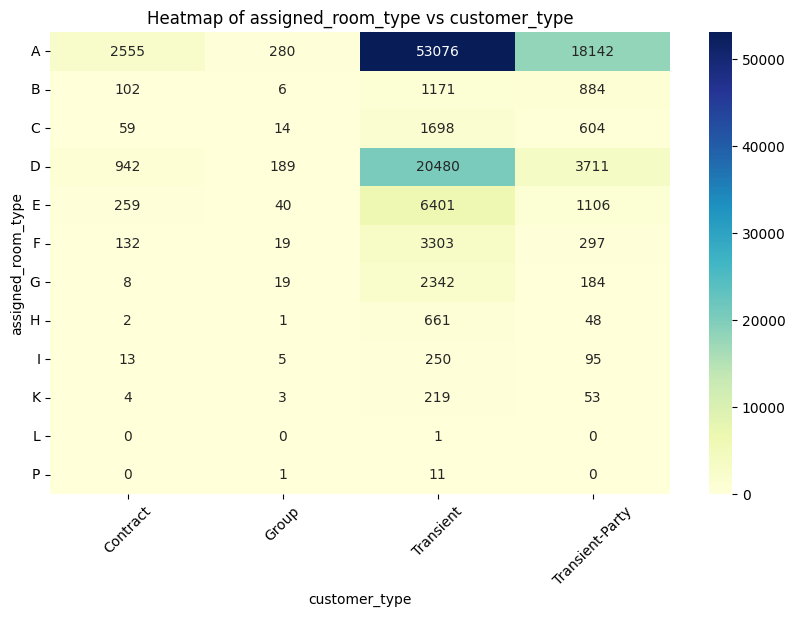

Heatmap for assigned_room_type vs reservation_status


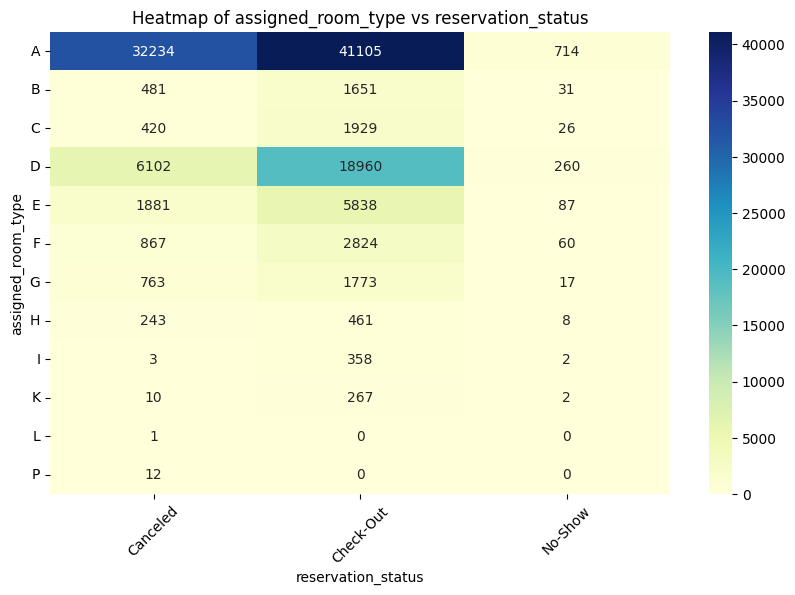

Heatmap for deposit_type vs customer_type


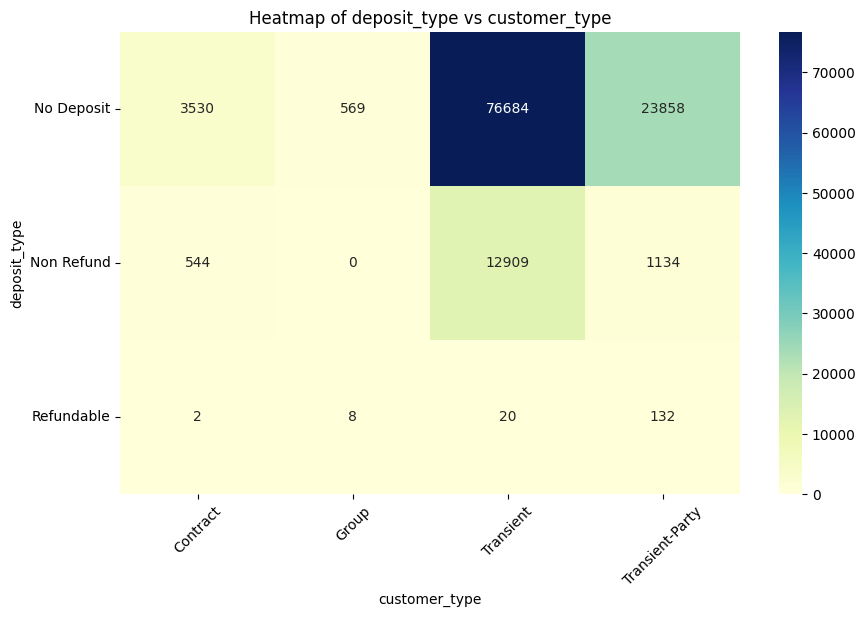

Heatmap for deposit_type vs reservation_status


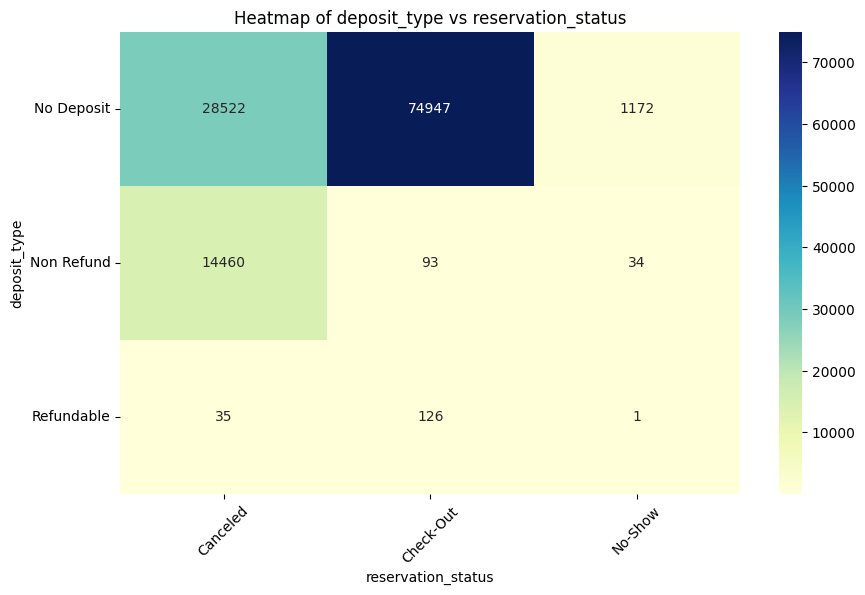

Heatmap for customer_type vs reservation_status


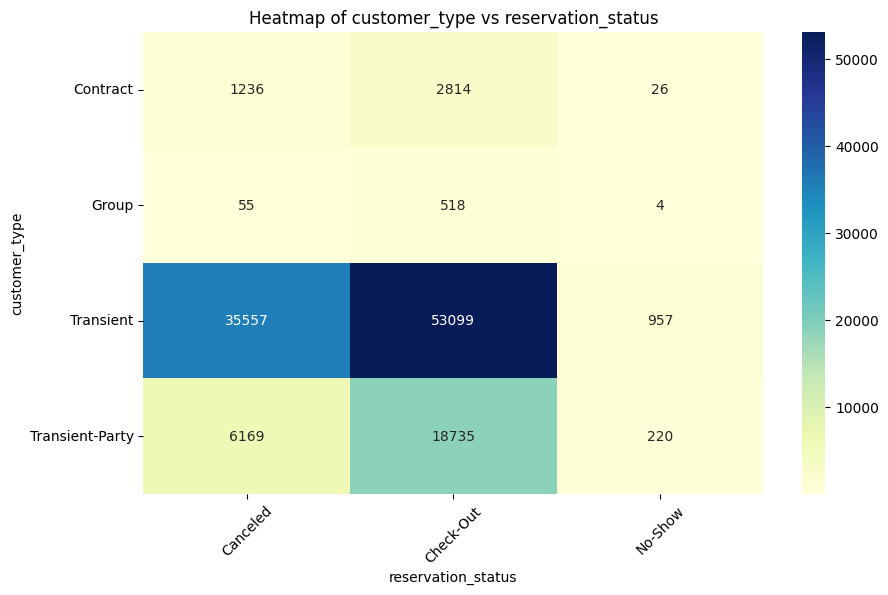

In [110]:




# Loop through pairs of categorical columns
for i, col1 in enumerate(categorical_columns):
    for col2 in categorical_columns[i+1:]:
        print(f"Heatmap for {col1} vs {col2}")

        # Create a contingency table
        contingency_table = pd.crosstab(df[col1], df[col2])

        # Plot heatmap
        plt.figure(figsize=(10, 6))
        sns.heatmap(contingency_table, annot=True, fmt='d', cmap='YlGnBu', cbar=True)
        plt.title(f"Heatmap of {col1} vs {col2}")
        plt.xlabel(col2)
        plt.ylabel(col1)
        plt.xticks(rotation=45)
        plt.yticks(rotation=0)
        plt.show()


 #  PREPROCESSING

## HANDLE MISSING VALUS

In [111]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   hotel                           119390 non-null  category      
 1   is_canceled                     119390 non-null  category      
 2   lead_time                       119390 non-null  int64         
 3   arrival_date_year               119390 non-null  category      
 4   arrival_date_month              119390 non-null  category      
 5   arrival_date_week_number        119390 non-null  category      
 6   arrival_date_day_of_month       119390 non-null  category      
 7   stays_in_weekend_nights         119390 non-null  int64         
 8   stays_in_week_nights            119390 non-null  int64         
 9   adults                          119390 non-null  int64         
 10  children                        119386 non-null  float64

In [112]:
df.isnull().sum()

,0
hotel,0
is_canceled,0
lead_time,0
arrival_date_year,0
arrival_date_month,0
arrival_date_week_number,0
arrival_date_day_of_month,0
stays_in_weekend_nights,0
stays_in_week_nights,0
adults,0


In [113]:
df['children'].value_counts()

,count
children,
0.0,110796
1.0,4861
2.0,3652
3.0,76
10.0,1


In [114]:
df['children'].fillna(df['children'].mode()[0], inplace=True)

In [115]:
df['children'].value_counts()

,count
children,
0.0,110800
1.0,4861
2.0,3652
3.0,76
10.0,1


In [116]:
df['children'].isnull().sum()

0

In [117]:
df['country'].isnull().sum()

488

In [118]:
df['country'].value_counts()

,count
country,
PRT,48590
GBR,12129
FRA,10415
ESP,8568
DEU,7287
...,...
MLI,1
MMR,1
MRT,1


In [119]:
df.groupby('country')['hotel'].count()

,hotel
country,
ABW,2
AGO,362
AIA,1
ALB,12
AND,7
...,...
VGB,1
VNM,8
ZAF,80


In [120]:
df.groupby('hotel')['country'].count()

,country
hotel,
City Hotel,79306
Resort Hotel,39596


In [121]:
df['hotel'][df['country'].isnull()]

,hotel
30,Resort Hotel
4127,Resort Hotel
7092,Resort Hotel
7860,Resort Hotel
8779,Resort Hotel
...,...
65908,City Hotel
65909,City Hotel
65910,City Hotel
80830,City Hotel


In [122]:
def fill_country_geographically(row):
    if pd.isnull(row['country']):
        if row['hotel'] == 'City Hotel':
            return 'PRT'  # Assume Portugal
        elif row['hotel'] == 'Resort Hotel':
            return 'ESP'  # Assume Spain
    return row['country']

df['country'] = df.apply(fill_country_geographically, axis=1)


In [123]:
df['country'].isnull().sum()

0

In [124]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   hotel                           119390 non-null  category      
 1   is_canceled                     119390 non-null  category      
 2   lead_time                       119390 non-null  int64         
 3   arrival_date_year               119390 non-null  category      
 4   arrival_date_month              119390 non-null  category      
 5   arrival_date_week_number        119390 non-null  category      
 6   arrival_date_day_of_month       119390 non-null  category      
 7   stays_in_weekend_nights         119390 non-null  int64         
 8   stays_in_week_nights            119390 non-null  int64         
 9   adults                          119390 non-null  int64         
 10  children                        119390 non-null  float64

In [125]:
df.isnull(  ).sum()

,0
hotel,0
is_canceled,0
lead_time,0
arrival_date_year,0
arrival_date_month,0
arrival_date_week_number,0
arrival_date_day_of_month,0
stays_in_weekend_nights,0
stays_in_week_nights,0
adults,0


In [126]:
df['agent'].value_counts()

,count
agent,
9.0,31961
240.0,13922
1.0,7191
14.0,3640
7.0,3539
...,...
289.0,1
432.0,1
265.0,1


In [127]:
df['distribution_channel'].value_counts()

,count
distribution_channel,
TA/TO,97870
Direct,14645
Corporate,6677
GDS,193
Undefined,5


In [128]:
df['market_segment'].value_counts()

,count
market_segment,
Online TA,56477
Offline TA/TO,24219
Groups,19811
Direct,12606
Corporate,5295
Complementary,743
Aviation,237
Undefined,2


In [129]:
df[df['agent'].isnull()]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
6,Resort Hotel,0,0,2015,July,27,1,0,2,2,...,No Deposit,NaN,NaN,0,Transient,107.00,0,0,Check-Out,2015-07-03
18,Resort Hotel,0,0,2015,July,27,1,0,1,2,...,No Deposit,NaN,110.0,0,Transient,107.42,0,0,Check-Out,2015-07-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119124,City Hotel,0,0,2017,August,35,29,0,1,1,...,No Deposit,NaN,72.0,0,Transient,0.00,0,2,Check-Out,2017-08-30
119151,City Hotel,0,0,2017,August,35,29,0,1,2,...,No Deposit,NaN,NaN,0,Transient,270.00,0,0,Check-Out,2017-08-30
119166,City Hotel,0,0,2017,August,35,30,0,1,1,...,No Deposit,NaN,NaN,0,Transient,140.00,0,0,Check-Out,2017-08-31
119215,City Hotel,0,2,2017,August,35,31,0,1,1,...,No Deposit,NaN,NaN,0,Transient,140.00,0,2,Check-Out,2017-09-01


In [130]:
df['agent'] = df.groupby(['market_segment', 'distribution_channel'])['agent'].transform(
    lambda x: x.fillna(x.mode()[0] if not x.mode().empty else 0)
)

In [131]:
df['agent'].isnull().sum()

0

In [132]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   hotel                           119390 non-null  category      
 1   is_canceled                     119390 non-null  category      
 2   lead_time                       119390 non-null  int64         
 3   arrival_date_year               119390 non-null  category      
 4   arrival_date_month              119390 non-null  category      
 5   arrival_date_week_number        119390 non-null  category      
 6   arrival_date_day_of_month       119390 non-null  category      
 7   stays_in_weekend_nights         119390 non-null  int64         
 8   stays_in_week_nights            119390 non-null  int64         
 9   adults                          119390 non-null  int64         
 10  children                        119390 non-null  float64

In [133]:
df.isnull().sum()

,0
hotel,0
is_canceled,0
lead_time,0
arrival_date_year,0
arrival_date_month,0
arrival_date_week_number,0
arrival_date_day_of_month,0
stays_in_weekend_nights,0
stays_in_week_nights,0
adults,0


In [134]:
# Drop 'company' column
df = df.drop(columns=['company'])



In [135]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 31 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   hotel                           119390 non-null  category      
 1   is_canceled                     119390 non-null  category      
 2   lead_time                       119390 non-null  int64         
 3   arrival_date_year               119390 non-null  category      
 4   arrival_date_month              119390 non-null  category      
 5   arrival_date_week_number        119390 non-null  category      
 6   arrival_date_day_of_month       119390 non-null  category      
 7   stays_in_weekend_nights         119390 non-null  int64         
 8   stays_in_week_nights            119390 non-null  int64         
 9   adults                          119390 non-null  int64         
 10  children                        119390 non-null  float64

In [136]:
df.isnull(  ).sum()

,0
hotel,0
is_canceled,0
lead_time,0
arrival_date_year,0
arrival_date_month,0
arrival_date_week_number,0
arrival_date_day_of_month,0
stays_in_weekend_nights,0
stays_in_week_nights,0
adults,0


In [137]:
df.duplicated().sum()

32005

In [138]:
df.drop_duplicates(inplace=True)

In [139]:
df.duplicated().sum()

0

In [140]:
df.shape

(87385, 31)

# Handle Outliers

In [141]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 87385 entries, 0 to 119389
Data columns (total 31 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   hotel                           87385 non-null  category      
 1   is_canceled                     87385 non-null  category      
 2   lead_time                       87385 non-null  int64         
 3   arrival_date_year               87385 non-null  category      
 4   arrival_date_month              87385 non-null  category      
 5   arrival_date_week_number        87385 non-null  category      
 6   arrival_date_day_of_month       87385 non-null  category      
 7   stays_in_weekend_nights         87385 non-null  int64         
 8   stays_in_week_nights            87385 non-null  int64         
 9   adults                          87385 non-null  int64         
 10  children                        87385 non-null  float64       
 11  babies

#  For Numerical Data

In [142]:
numerical_data = df.select_dtypes(include=['int64', 'float64']).columns
numerical_data

Index(['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights',
       'adults', 'children', 'babies', 'previous_cancellations',
       'previous_bookings_not_canceled', 'booking_changes', 'agent',
       'days_in_waiting_list', 'adr', 'required_car_parking_spaces',
       'total_of_special_requests'],
      dtype='object')

In [143]:
df['lead_time'].skew()

1.4316410112463673

In [144]:
Q1 = data['lead_time'].quantile(0.25)
Q3 = data['lead_time'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# check out outliers
df[(df['lead_time'] <= lower_bound) |(df['lead_time'] >=upper_bound)]



,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,4,No Deposit,14.0,0,Transient,0.00,0,0,Check-Out,2015-07-01
225,Resort Hotel,0,394,2015,July,28,8,2,5,2,...,0,No Deposit,40.0,0,Contract,89.68,0,0,Check-Out,2015-07-15
890,Resort Hotel,0,460,2015,August,32,3,2,5,1,...,0,No Deposit,40.0,0,Contract,77.54,0,0,Check-Out,2015-08-10
1516,Resort Hotel,0,381,2015,September,36,1,4,10,2,...,0,No Deposit,40.0,0,Contract,82.88,0,0,Check-Out,2015-09-15
1672,Resort Hotel,0,382,2015,September,37,8,4,10,2,...,0,No Deposit,40.0,0,Contract,76.50,0,0,Check-Out,2015-09-22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118952,City Hotel,0,457,2017,August,34,25,0,2,2,...,1,No Deposit,6.0,0,Transient-Party,122.40,0,1,Check-Out,2017-08-27
119053,City Hotel,0,518,2017,August,34,26,2,1,2,...,0,No Deposit,229.0,0,Transient-Party,112.67,0,1,Check-Out,2017-08-29
119057,City Hotel,0,518,2017,August,34,26,2,1,2,...,0,No Deposit,229.0,0,Transient-Party,112.67,0,1,Check-Out,2017-08-29
119102,City Hotel,0,518,2017,August,34,26,2,1,1,...,1,No Deposit,229.0,0,Transient-Party,0.00,0,0,Check-Out,2017-08-29


In [145]:
 # Since the lead_time column is positively skewed
 # apply a transformation to make the distribution more normal-like
 # and reduce the impact of outliers.

df['lead_time'] = np.log1p(df['lead_time'])

In [146]:
df['lead_time'].skew()

-0.7159252548831568

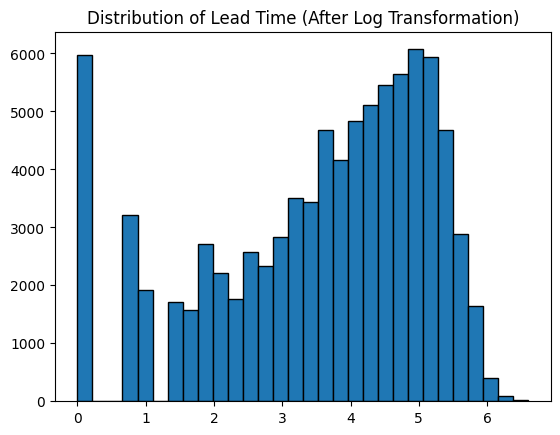

In [147]:
plt.hist(df['lead_time'], bins=30, edgecolor='k')
plt.title('Distribution of Lead Time (After Log Transformation)')
plt.show()

In [148]:
# data is now slightly negative skewed  which is best for negative skewed data

from sklearn.preprocessing import PowerTransformer

pt = PowerTransformer(method='yeo-johnson')
df[['lead_time']] = pt.fit_transform(df[['lead_time']])


In [149]:
df['lead_time'].skew()

-0.35102309444284435

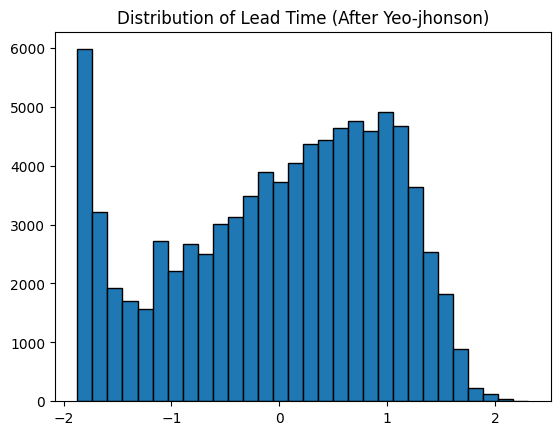

In [150]:
plt.hist(df['lead_time'], bins=30, edgecolor='k')
plt.title('Distribution of Lead Time (After Yeo-jhonson)')
plt.show()

# now data is welll close to zero

In [151]:
Q1 = data['lead_time'].quantile(0.25)
Q3 = data['lead_time'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# check out outliers
df[(df['lead_time'] <= lower_bound) | (df['lead_time'] >=upper_bound)]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date


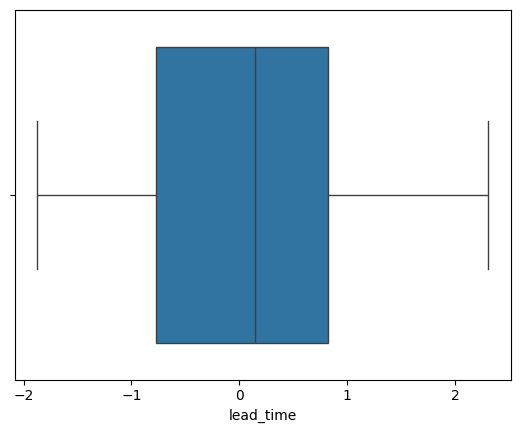

In [152]:
sns.boxplot(x ='lead_time' , data=df)
plt.show()

In [153]:
df['stays_in_weekend_nights'].skew()

1.4115487961722666

In [154]:
Q1 = df['stays_in_weekend_nights'].quantile(0.25)
Q3 = df['stays_in_weekend_nights'].quantile(0.75)
IQR = Q3 - Q1
print("IQR:" ,IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1
df['stays_in_weekend_nights'][(df['stays_in_weekend_nights'] < lower_bound) | (df['stays_in_weekend_nights'] > upper_bound)]

IQR: 2.0


,stays_in_weekend_nights
30,4
31,4
52,4
85,4
86,4
...,...
118570,4
118613,4
118673,4
119083,4


In [155]:
np.log1p(df['stays_in_weekend_nights'])

,stays_in_weekend_nights
0,0.000000
1,0.000000
2,0.000000
3,0.000000
4,0.000000
...,...
119385,1.098612
119386,1.098612
119387,1.098612
119388,1.098612


In [156]:
df['stays_in_week_nights'] = np.log1p(df['stays_in_week_nights'])

In [157]:
df['stays_in_week_nights'].skew()

-0.14689268456102797

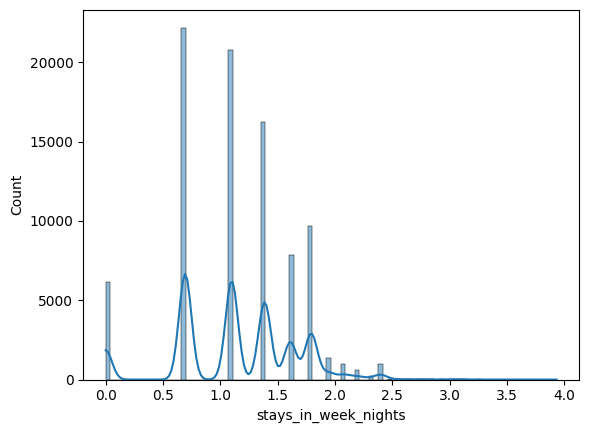

In [158]:
sns.histplot(df['stays_in_week_nights'],kde=True)
plt.show()

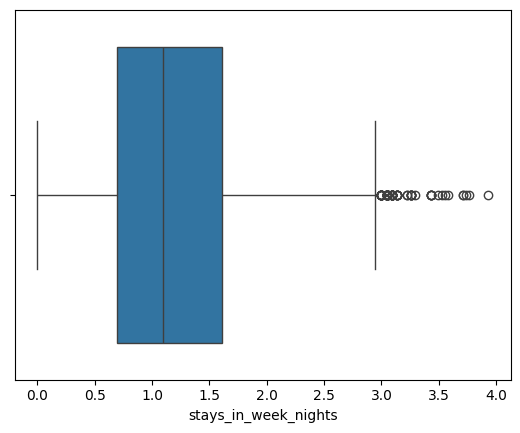

In [159]:
sns.boxplot(x='stays_in_week_nights' , data=df)
plt.show()

In [160]:
Q1 = df['stays_in_week_nights'].quantile(0.25)
Q3 = df['stays_in_week_nights'].quantile(0.75)
IQR = Q3 - Q1
print("IQR:" ,IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print("Lower Bound:", lower_bound)
print("Upper Bound:", upper_bound)

df['stays_in_week_nights'].clip(lower_bound, upper_bound, inplace=True)

IQR: 0.916290731874155
Lower Bound: -0.6812889172512872
Upper Bound: 2.9838740102453327


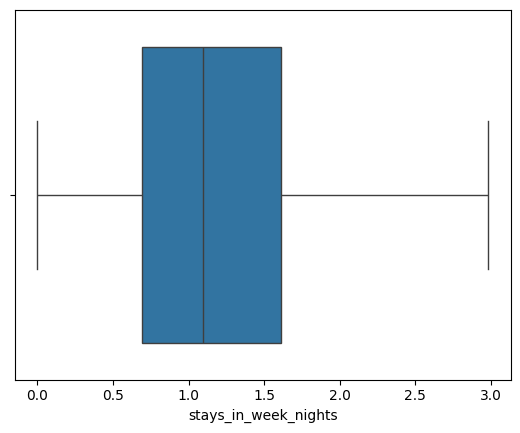

In [161]:
sns.boxplot(x='stays_in_week_nights' , data=df)
plt.show()

In [162]:
df['stays_in_week_nights'].skew()

-0.16215786197628262

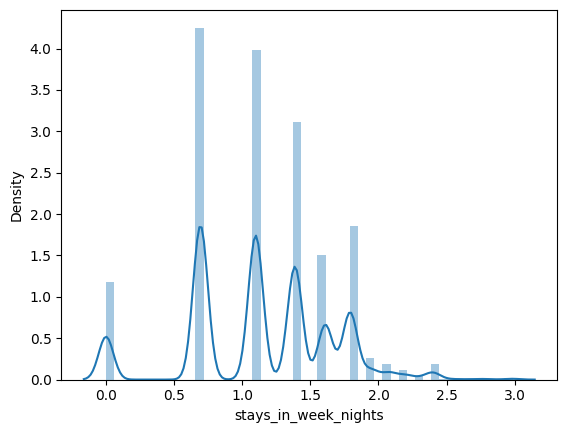

In [163]:
sns.distplot(df['stays_in_week_nights'])
plt.show()

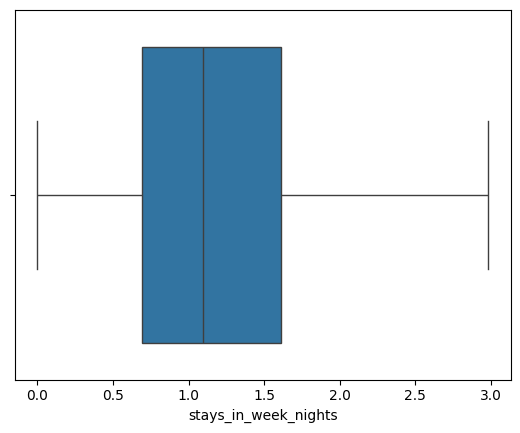

In [164]:
sns.boxplot(x='stays_in_week_nights' , data=df)
plt.show()

In [165]:
Q1 = df['stays_in_week_nights'].quantile(0.25)
Q3 = df['stays_in_week_nights'].quantile(0.75)
IQR = Q3 - Q1
print("IQR:" ,IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print("Lower Bound:", lower_bound)
print("Upper Bound:", upper_bound)
df['stays_in_week_nights'][(df['stays_in_week_nights'] < lower_bound) | (df['stays_in_week_nights'] > upper_bound)]

IQR: 0.916290731874155
Lower Bound: -0.6812889172512872
Upper Bound: 2.9838740102453327


,stays_in_week_nights


In [166]:
df['adults'].skew()

19.862954966904546

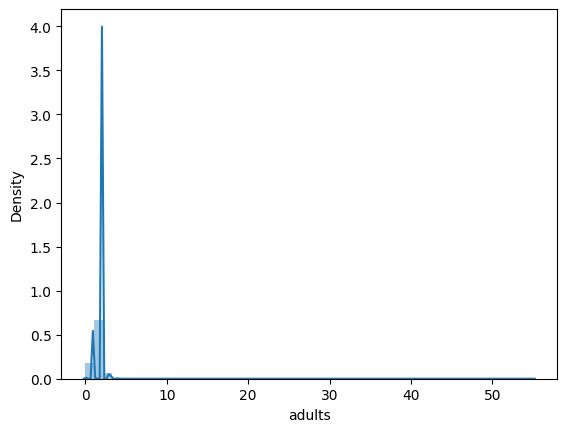

In [167]:
sns.distplot(df['adults'])
plt.show()

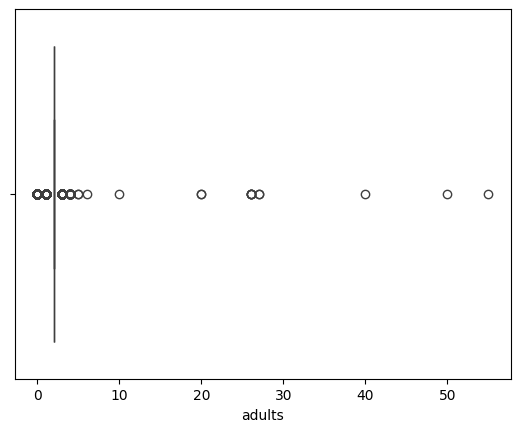

In [168]:
sns.boxplot(x='adults' , data=df)
plt.show()

In [169]:
df['adults'].value_counts()

,count
adults,
2,64493
1,16496
3,5935
0,385
4,60
26,5
27,2
20,2
5,2


In [170]:
# this was error its reson i remove

df = df[df['adults'] > 0]
df.shape

(87000, 31)

In [171]:
df['adults'].skew()

21.144900380498516

In [172]:
df['adults'] = np.log1p(df['adults'])
df['adults'].skew()

-0.47337772846173465

In [173]:
df['adults'].value_counts()

,count
adults,
1.098612,64493
0.693147,16496
1.386294,5935
1.609438,60
3.295837,5
3.332205,2
3.044522,2
1.791759,2
3.713572,1


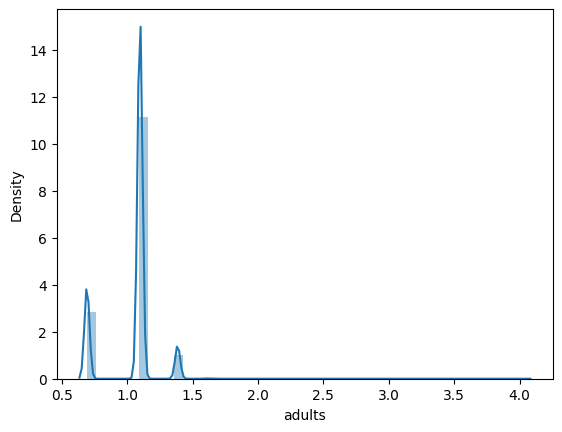

In [174]:
sns.distplot(df['adults'])
plt.show()

In [175]:
df['adults'].skew()

-0.47337772846173465

In [176]:
numerical_data

Index(['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights',
       'adults', 'children', 'babies', 'previous_cancellations',
       'previous_bookings_not_canceled', 'booking_changes', 'agent',
       'days_in_waiting_list', 'adr', 'required_car_parking_spaces',
       'total_of_special_requests'],
      dtype='object')

In [178]:
df['children'].skew()

3.525898996128574

In [179]:
df['children'].value_counts()

,count
children,
0.0,78855
1.0,4691
2.0,3389
3.0,64
10.0,1


In [180]:
df['children'] = np.log1p(df['children'])
df['children'].skew()

3.096465625512756

In [181]:
df['children'].value_counts()

,count
children,
0.000000,78855
0.693147,4691
1.098612,3389
1.386294,64
2.397895,1


In [182]:
df['children'].skew()

3.096465625512756

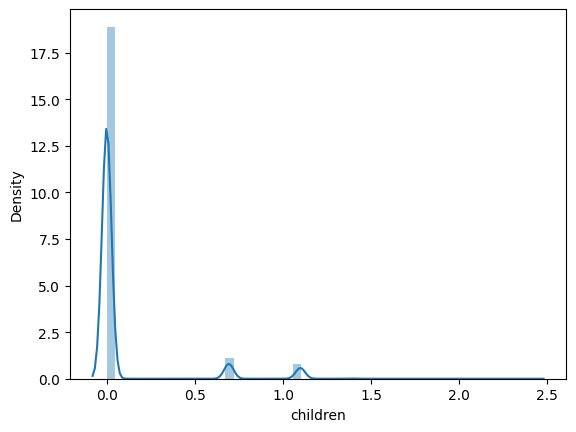

In [183]:
sns.distplot(df['children'])
plt.show()

In [184]:
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='yeo-johnson')
df['children'] = pt.fit_transform(df[['children']])
df['children'].skew()


2.7901539424237334

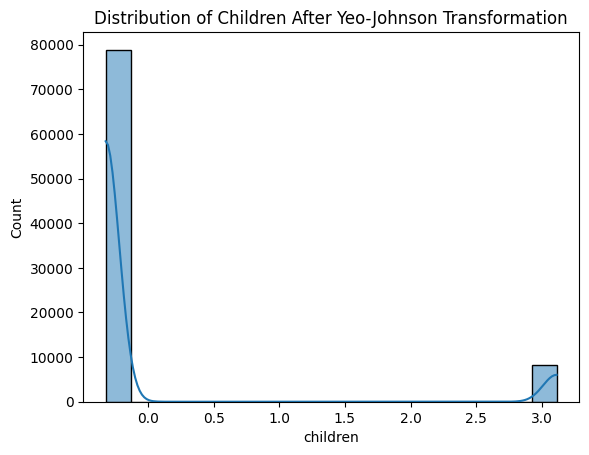

In [185]:
sns.histplot(df['children'], kde=True)
plt.title('Distribution of Children After Yeo-Johnson Transformation')
plt.show()

In [186]:
df['children'].value_counts()

,count
children,
-0.321389,78855
3.111334,4691
3.111713,3389
3.111722,64
3.111723,1


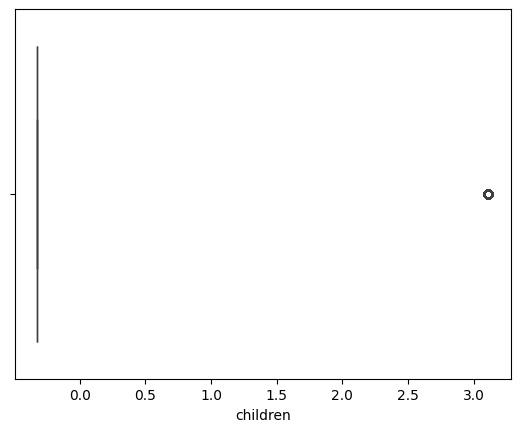

In [187]:
sns.boxplot(x='children' , data=df)
plt.show()

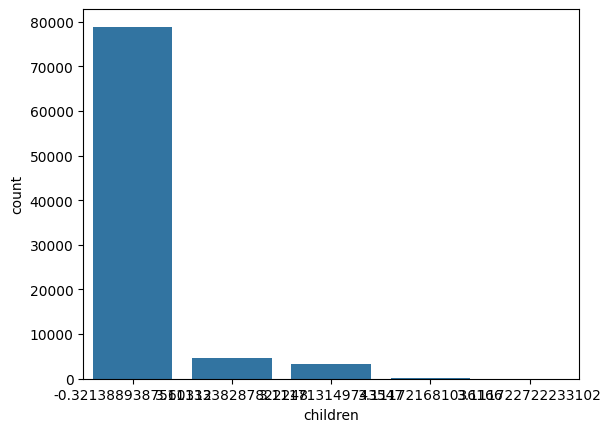

In [188]:
sns.countplot(x='children', data=df)
plt.show()

In [198]:
df1 = pd.read_csv('hotel_bookings.csv')


In [199]:
df1['babies'].isnull().sum()

0

In [200]:
df['babies'] = df1['babies']

In [201]:
df['babies'].skew()

21.161416134585572

In [202]:
df['babies'].value_counts()

,count
babies,
0,86089
1,894
2,15
10,1
9,1


In [203]:
df['babies']=np.log1p(df['babies'])
df['babies'].skew()

10.171655029356168

In [204]:
from scipy.stats import yeojohnson

# Apply Yeo-Johnson transformation
df['babies'], _ = yeojohnson(df['babies'] + 1)  # Adding 1 to avoid issues with zero
df['babies'].skew()


0.0

In [205]:
df['babies'].value_counts()

,count
babies,
0.021116,86089
0.021116,911


In [206]:
Q1 = df['babies'].quantile(0.25)
Q3 = df['babies'].quantile(0.75)
IQR = Q3 - Q1
print("IQR:" ,IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print("Lower Bound:", lower_bound)
print("Upper Bound:", upper_bound)
df['babies'][(df['babies'] < lower_bound) | (df['babies'] > upper_bound)]

IQR: 0.0
Lower Bound: 0.021116300439024207
Upper Bound: 0.021116300439024207


,babies
109,0.021116
111,0.021116
165,0.021116
236,0.021116
264,0.021116
...,...
118437,0.021116
118571,0.021116
118794,0.021116
119098,0.021116


In [208]:
df['babies'].value_counts()

,count
babies,
0.021116,86089
0.021116,911


In [207]:
df['babies'].apply(lambda x: 'More than 0' if x > 0 else 'No Babies').value_counts()

,count
babies,
More than 0,87000


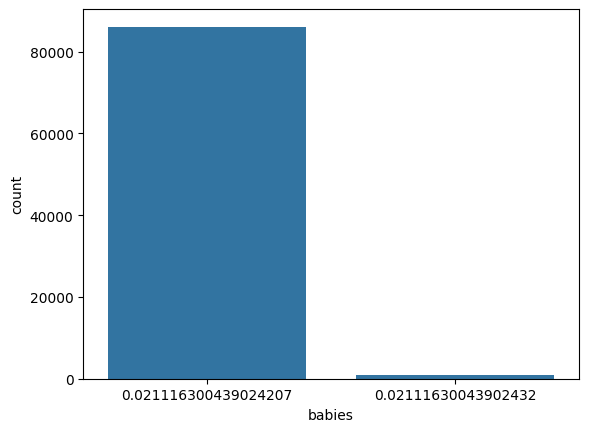

In [209]:
df['babies'] = df['babies'].astype('category')
sns.countplot(x='babies', data=df)
plt.show()


In [212]:
df['previous_cancellations'].skew()

34.29252584123405

In [213]:
df['previous_cancellations'].value_counts()

,count
previous_cancellations,
0,85321
1,1403
2,110
3,61
4,30
11,27
5,19
6,17
13,4


In [214]:
df['previous_cancellations'] = np.log1p(df['previous_cancellations'])
df['previous_cancellations'].skew()

10.403930519153667

In [215]:
from sklearn.preprocessing import PowerTransformer

# Assuming df['previous_cancellations'] is the column you're working with
df['previous_cancellations'] = df['previous_cancellations'] + 1  # To avoid zero or negative values

# Applying Yeo-Johnson transformation
pt = PowerTransformer(method='yeo-johnson')
df['previous_cancellations'] = pt.fit_transform(df[['previous_cancellations']])

# Check the skewness after applying the transformation
print(df['previous_cancellations'].skew())


0.0


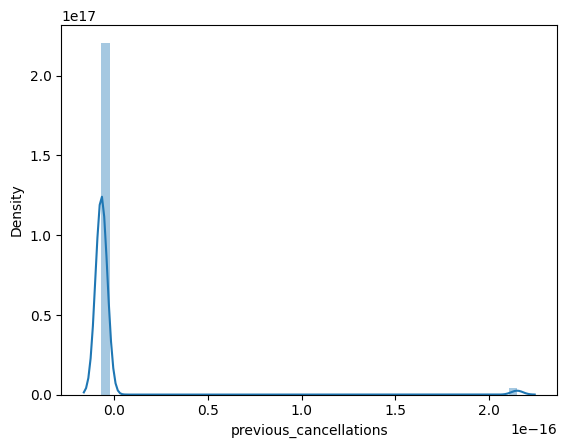

In [216]:
sns.distplot(df['previous_cancellations'])
plt.show()

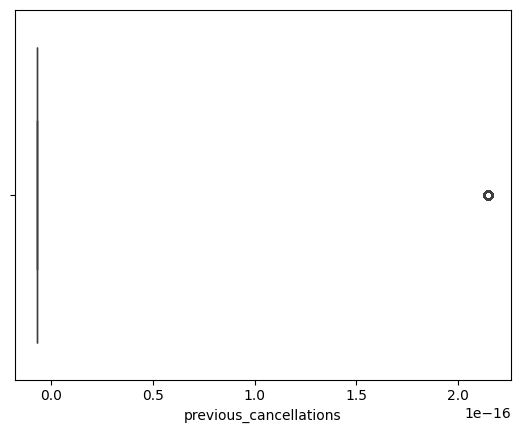

In [217]:
sns.boxplot(x='previous_cancellations' , data=df)
plt.show()

In [218]:
df['previous_cancellations'].value_counts()

,count
previous_cancellations,
-6.938894e-18,85321
2.151057e-16,1679


In [219]:
# Convert to binary classification column
df['previous_cancellations'] = df['previous_cancellations'].apply(lambda x: 1 if x > 0 else 0)
df['previous_cancellations'].value_counts()


,count
previous_cancellations,
0,85321
1,1679


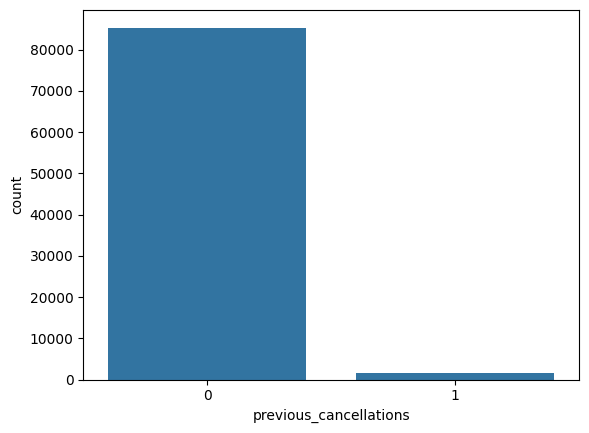

In [220]:
sns.countplot(x='previous_cancellations', data=df)
plt.show()

In [221]:
df1= pd.read_csv('hotel_bookings.csv')
df['previous_cancellations'] = df1['previous_cancellations']

In [222]:
df['previous_cancellations']

,previous_cancellations
0,0
1,0
2,0
3,0
4,0
...,...
119385,0
119386,0
119387,0
119388,0


In [223]:
df['previous_bookings_not_canceled'].skew()

20.428938594578458

In [224]:
df['previous_bookings_not_canceled'].value_counts()

,count
previous_bookings_not_canceled,
0,83463
1,1477
2,580
3,331
4,228
...,...
47,1
49,1
50,1


In [225]:
df['previous_bookings_not_canceled'] = np.log1p(df['previous_bookings_not_canceled'])
df['previous_bookings_not_canceled'].skew()

6.973093087934366

In [226]:
df['previous_bookings_not_canceled'] = df['previous_bookings_not_canceled'] +1
df['previous_bookings_not_canceled'] = pt.fit_transform(df[['previous_bookings_not_canceled']])
df['previous_bookings_not_canceled'].skew()

0.0

In [227]:
df['previous_bookings_not_canceled'].value_counts()

,count
previous_bookings_not_canceled,
0.000000e+00,83463
6.938894e-18,3537


In [228]:
df['previous_bookings_not_canceled'] = df['previous_bookings_not_canceled'].apply(lambda x:1 if x>0 else 0)
df['previous_bookings_not_canceled'].value_counts()

,count
previous_bookings_not_canceled,
0,83463
1,3537


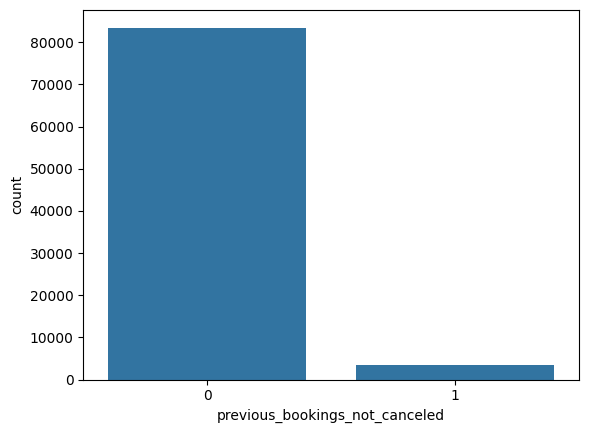

In [229]:
sns.countplot(x='previous_bookings_not_canceled', data=df)
plt.show()

In [230]:
df['booking_changes'].skew()

5.072431609242782

In [231]:
df['booking_changes'].value_counts()

,count
booking_changes,
0,71252
1,10823
2,3477
3,858
4,347
5,112
6,57
7,28
8,14


In [232]:
df['booking_changes'] = np.log1p(df['booking_changes'])
df['booking_changes'].skew()

2.2521068504099993

In [233]:
df['booking_changes'] = df['booking_changes'] +1
pt.fit_transform(df[['booking_changes']])
df['booking_changes'].skew()

2.252106850409997

In [234]:
df['booking_changes'].value_counts()

,count
booking_changes,
1.000000,71252
1.693147,10823
2.098612,3477
2.386294,858
2.609438,347
2.791759,112
2.945910,57
3.079442,28
3.197225,14


In [235]:
# Calculate the actual minimum and maximum values for the 'booking_changes' column
min_value = df['booking_changes'].min()
max_value = df['booking_changes'].max()

# Create your bins with unique edges
bins = [min_value, 1.0, 2.0, 3.0, max_value]

# Ensure that min_value and 1.0 are distinct, and max_value and 3.0 are distinct
# For example, if min_value is 1.0, you could slightly decrease it:
if min_value == 1.0:
    bins[0] = min_value - 0.001  # Slightly decrease the lower bound

if max_value == 3.0:
    bins[4] = max_value + 0.001  # Slightly increase the upper bound

labels = ['Low', 'Medium', 'High', 'Extreme']

# Apply binning to the 'booking_changes' column
df['booking_changes_binned'] = pd.cut(df['booking_changes'], bins=bins, labels=labels, include_lowest=True, duplicates='drop')  # Add duplicates='drop'

# Check the result
print(df['booking_changes_binned'].value_counts())

booking_changes_binned
Low        71252
Medium     10823
High        4851
Extreme       74
Name: count, dtype: int64


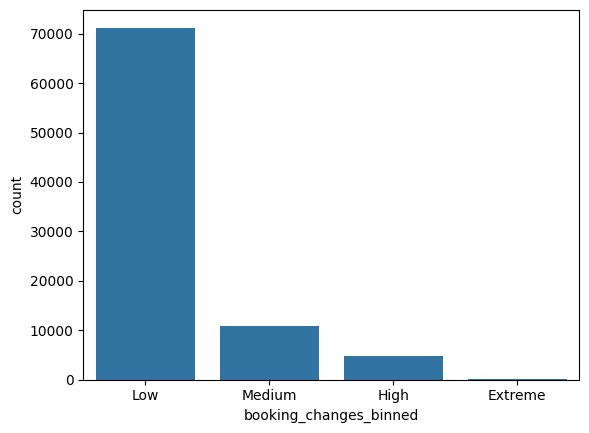

In [236]:
sns.countplot(x='booking_changes_binned', data=df)
plt.show()

In [237]:
df['agent'].skew()

0.9887593221376213

In [238]:
df['agent'].value_counts()

,count
agent,
9.0,28775
240.0,13115
14.0,8669
185.0,3446
7.0,3290
...,...
497.0,1
337.0,1
510.0,1


In [239]:
Q1 = df['agent'].quantile(0.25)
Q3 = df['agent'].quantile(0.75)
IQR = Q3 - Q1
print("IQR:" ,IQR)
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print("Lower Bound:", lower_bound)
print("Upper Bound:", upper_bound)
df['agent'][(df['agent'] < lower_bound) | (df['agent'] > upper_bound)]

IQR: 231.0
Lower Bound: -337.5
Upper Bound: 586.5


,agent


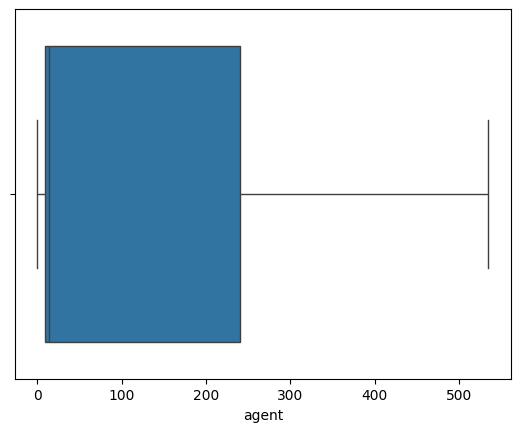

In [240]:
sns.boxplot(x='agent' , data=df)
plt.show()

In [271]:
numerical_data

Index(['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights',
       'adults', 'children', 'babies', 'previous_cancellations',
       'previous_bookings_not_canceled', 'booking_changes', 'agent',
       'days_in_waiting_list', 'adr', 'required_car_parking_spaces',
       'total_of_special_requests'],
      dtype='object')

In [241]:
df['days_in_waiting_list'].skew()

19.4414124330758

In [242]:
df['days_in_waiting_list'].value_counts()

,count
days_in_waiting_list,
0,86145
63,53
87,25
44,23
15,22
...,...
109,1
116,1
142,1


In [243]:
df['days_in_waiting_list'] = np.log1p(df['days_in_waiting_list'])
df['days_in_waiting_list'].skew()

10.691214745725409

In [244]:
df['days_in_waiting_list']= df['days_in_waiting_list'] +1
pt.fit_transform(df[['days_in_waiting_list']])
df['days_in_waiting_list'].skew()

10.691214745725407

In [245]:
df['days_in_waiting_list'].value_counts()

,count
days_in_waiting_list,
1.000000,86145
5.158883,53
5.477337,25
4.806662,23
3.772589,22
...,...
5.700480,1
5.762174,1
5.962845,1


In [246]:
numerical_data

Index(['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights',
       'adults', 'children', 'babies', 'previous_cancellations',
       'previous_bookings_not_canceled', 'booking_changes', 'agent',
       'days_in_waiting_list', 'adr', 'required_car_parking_spaces',
       'total_of_special_requests'],
      dtype='object')

In [247]:
df['adr'].skew()

11.0322149375884

In [248]:
df['adr'].value_counts()

,count
adr,
0.00,1637
75.00,1319
65.00,1260
48.00,877
85.00,858
...,...
50.43,1
47.98,1
108.86,1


In [249]:
df['adr'] = np.log1p(df['adr'])
df['adr'].skew()

-3.580517154096773

In [250]:
df['adr'] = df['adr'] +1
pt.fit_transform(df[['adr']])
df['adr'].skew()

-3.5805171540967686

In [251]:
df['adr'].value_counts()

,count
adr,
1.000000,1637
5.330733,1319
5.189655,1260
4.891820,877
5.454347,858
...,...
6.732273,1
7.057369,1
6.326613,1


In [270]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 87000 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   hotel                           87000 non-null  category      
 1   is_canceled                     87000 non-null  category      
 2   lead_time                       87000 non-null  float64       
 3   arrival_date_year               87000 non-null  category      
 4   arrival_date_month              87000 non-null  category      
 5   arrival_date_week_number        87000 non-null  category      
 6   arrival_date_day_of_month       87000 non-null  category      
 7   stays_in_weekend_nights         87000 non-null  int64         
 8   stays_in_week_nights            87000 non-null  float64       
 9   adults                          87000 non-null  float64       
 10  children                        87000 non-null  float64       
 11  babies

In [252]:


i

# Defining bins based on the distribution of values
# Let's assume we create 4 bins for 'adr', considering its distribution
bins = [0, 2, 4, 6, float('inf')]  # Adjust these values based on the summary stats
labels = ['Low', 'Medium', 'High', 'Very High']

# Apply binning using pd.cut
df['adr'] = pd.cut(df['adr'], bins=bins, labels=labels, right=False)

# Checking the bin count for each category
print(df['adr'].value_counts())



adr
High         68757
Very High    16308
Low           1655
Medium         279
Name: count, dtype: int64


In [253]:
df['adr'].value_counts()

,count
adr,
High,68757
Very High,16308
Low,1655
Medium,279


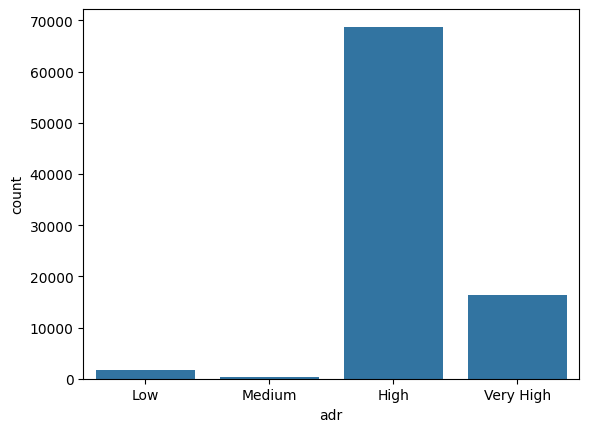

In [254]:
sns.countplot(x='adr', data=df)
plt.show()

In [255]:
df['required_car_parking_spaces'] = df1['required_car_parking_spaces']

In [256]:
df['required_car_parking_spaces'].skew()

3.4837133521101538

In [257]:
df['required_car_parking_spaces'].value_counts()

,count
required_car_parking_spaces,
0,79696
1,7271
2,28
3,3
8,2


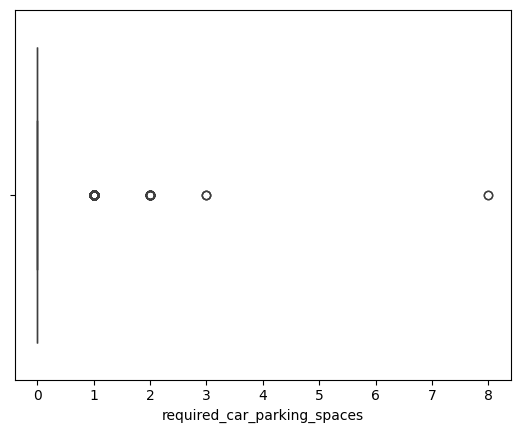

In [258]:
sns.boxplot(x='required_car_parking_spaces' , data=df)
plt.show()

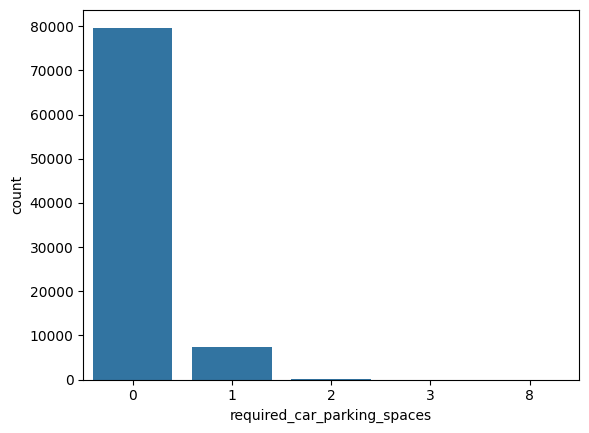

In [259]:
sns.countplot(x='required_car_parking_spaces', data=df)
plt.show()

In [260]:


# Define bins and labels for 'required_car_parking_spaces'
bins = [-float('inf'),0,1,float('inf')]
labels = ['No Parking', '1 Parking', 'More than 1 Parking']

# Apply binning using pd.cut
df['required_car_parking_spaces'] = pd.cut(df['required_car_parking_spaces'], bins=bins, labels=labels, right=True)

# Checking the bin count for each category
print(df['required_car_parking_spaces'].value_counts())


required_car_parking_spaces
No Parking             79696
1 Parking               7271
More than 1 Parking       33
Name: count, dtype: int64


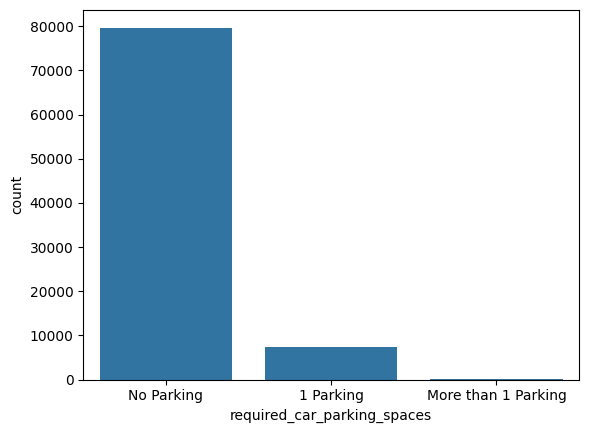

In [261]:
sns.countplot(x='required_car_parking_spaces', data=df)
plt.show()

In [262]:
df['total_of_special_requests'].skew()

1.0833183611792798

In [263]:
df['total_of_special_requests'].value_counts()

,count
total_of_special_requests,
0,43715
1,28876
2,11755
3,2300
4,318
5,36


In [264]:
df['total_of_special_requests'] = np.log1p(df['total_of_special_requests'])
df['total_of_special_requests'].skew()

0.4455730095254124

In [265]:
df['total_of_special_requests'].value_counts()

,count
total_of_special_requests,
0.000000,43715
0.693147,28876
1.098612,11755
1.386294,2300
1.609438,318
1.791759,36


In [266]:
# Define bins and labels for 'total_of_special_requests'
bins = [0, 0.693147, 1.098612, 1.386294,  float('inf')]
labels = ['No Special Requests', '1 Special Request', '2 Special Requests', '3 Special Requests', '4 Special Requests', '5+ Special Requests']

# Apply binning using pd.cut
df['special_requests_binned'] = pd.cut(df['total_of_special_requests'], bins=bins, labels=labels, right=True)

# Checking the bin count for each category
print(df['special_requests_binned'].value_counts())


ValueError: Bin labels must be one fewer than the number of bin edges

In [ ]:
numerical_data

# Categorical Data Outliers Handle

In [267]:

df['hotel'].value_counts()

,count
hotel,
City Hotel,53052
Resort Hotel,33948


In [268]:
pd.crosstab(df['hotel'], df['is_canceled'])

is_canceled,0,1
hotel,,
City Hotel,37098,15954
Resort Hotel,25974,7974


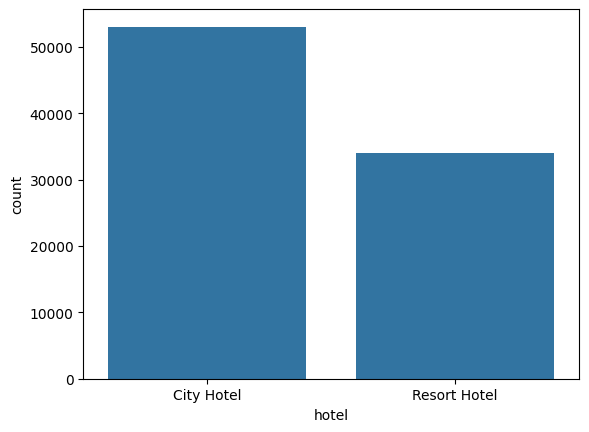

In [272]:
sns.countplot(x='hotel', data=df)
plt.show()

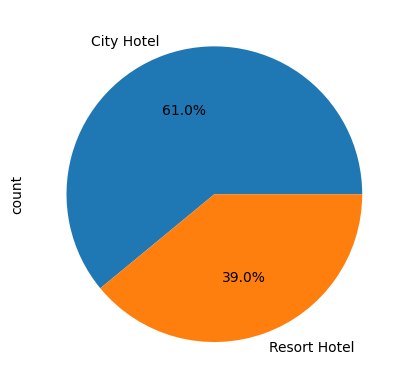

In [273]:
df['hotel'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.show()

In [274]:
df['is_canceled'].value_counts()

,count
is_canceled,
0,63072
1,23928


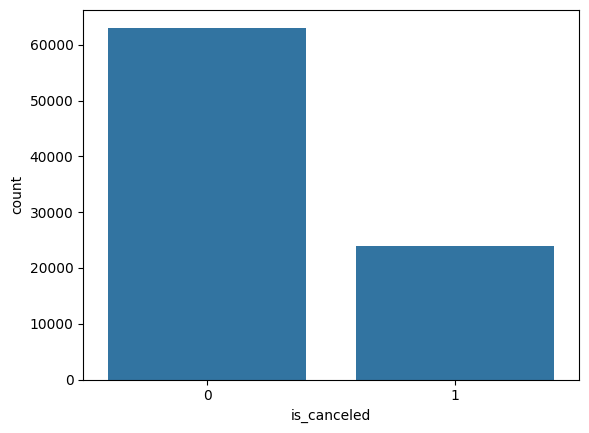

In [275]:
sns.countplot(x='is_canceled', data=df)
plt.show()

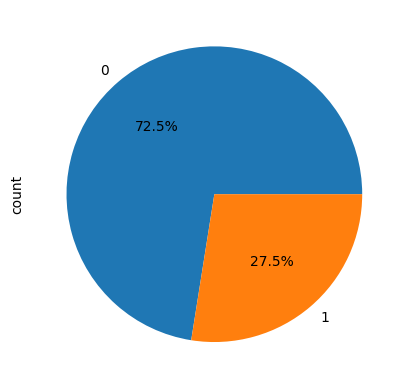

In [276]:
df['is_canceled'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.show()

In [277]:
df['arrival_date_year'].value_counts()

,count
arrival_date_year,
2016,42164
2017,31569
2015,13267


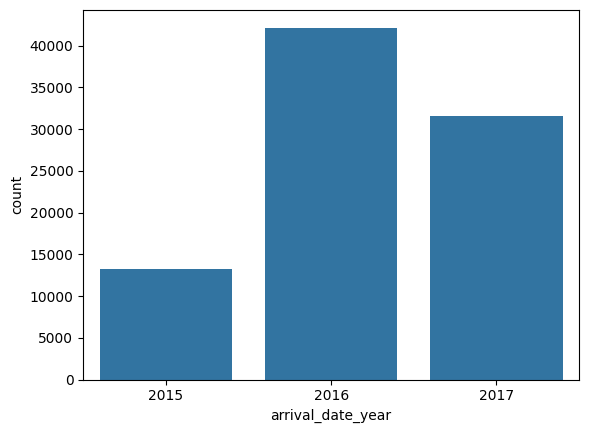

In [278]:
sns.countplot(x='arrival_date_year', data=df)
plt.show()

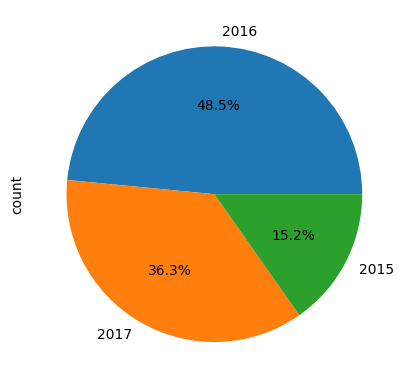

In [279]:
df['arrival_date_year'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.show()

In [280]:
df['arrival_date_month'].value_counts()

,count
arrival_date_month,
August,11210
July,10010
May,8328
April,7878
June,7745
March,7473
October,6905
September,6670
February,6062


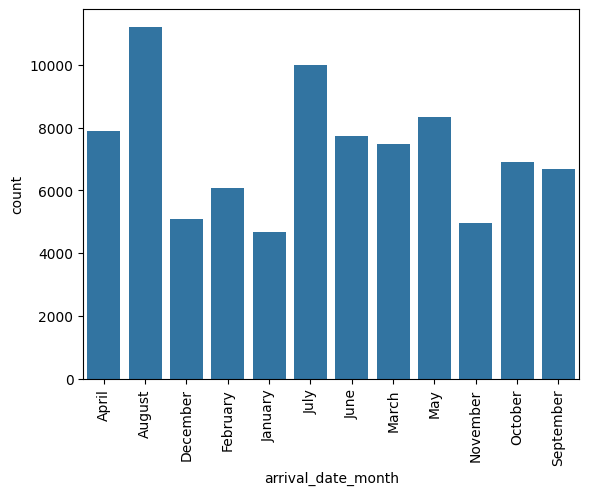

In [281]:
sns.countplot(x='arrival_date_month', data=df)
plt.xticks(rotation=90)
plt.show()

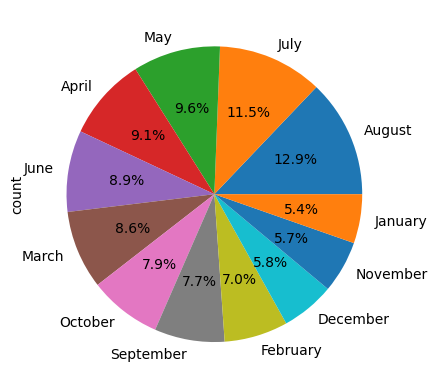

In [282]:
df['arrival_date_month'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.show()

In [283]:
df['meal'].value_counts()

,count
meal,
BB,67684
SC,9389
HB,9076
Undefined,491
FB,360


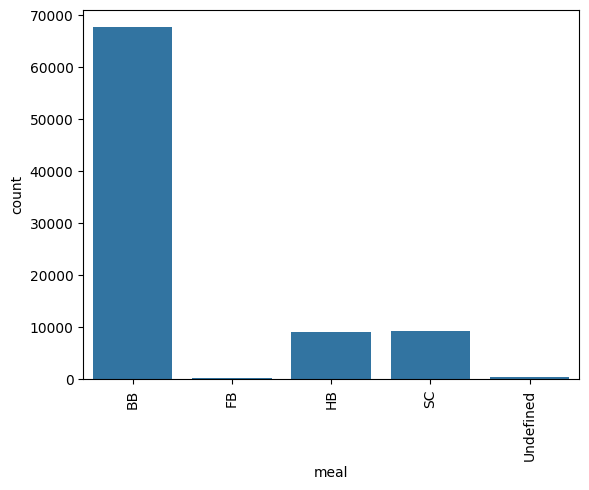

In [284]:
sns.countplot(x='meal', data=df)
plt.xticks(rotation=90)
plt.show()

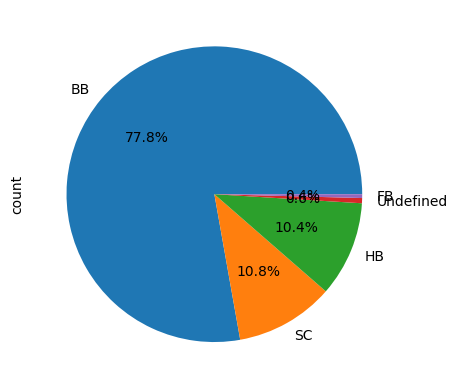

In [285]:
df['meal'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.show()

In [286]:
df['country'].value_counts()

,count
country,
PRT,27311
GBR,10408
FRA,8798
ESP,7670
DEU,5372
...,...
MMR,1
BFA,1
CYM,1


In [292]:
df['market_segment'].value_counts()

,count
market_segment,
Online TA,51365
Offline TA/TO,13852
Direct,11750
Groups,4921
Corporate,4196
Complementary,688
Aviation,226
Undefined,2


In [293]:
# Calculate the total occurrences
total_market_segments = df['market_segment'].value_counts()

# Define a threshold for low frequency (1% of total rows)
threshold = 0.01 * len(df)

# Identify low-frequency categories
low_freq_segments = total_market_segments[total_market_segments < threshold].index

# Replace low-frequency categories with "Other"
df['market_segment'] = df['market_segment'].apply(lambda x: 'Other' if x in low_freq_segments else x)

# Check the updated value counts
print(df['market_segment'].value_counts())


market_segment
Online TA        51365
Offline TA/TO    13852
Direct           11750
Groups            4921
Corporate         4196
Other              916
Name: count, dtype: int64


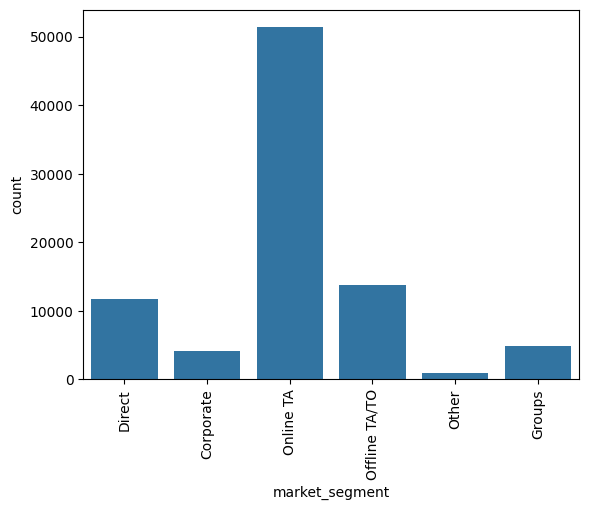

In [294]:
sns.countplot(x='market_segment', data=df)
plt.xticks(rotation=90)
plt.show()

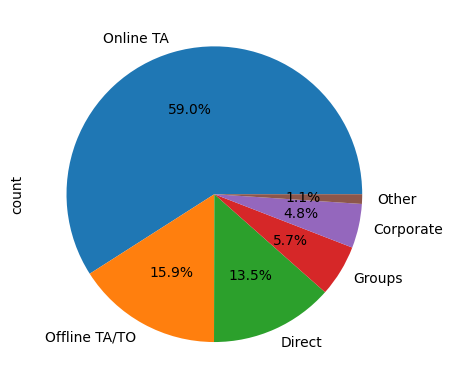

In [295]:
df['market_segment'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.show()

In [296]:
df['distribution_channel'].value_counts()

,count
distribution_channel,
TA/TO,68837
Direct,12919
Corporate,5058
GDS,181
Undefined,5


In [297]:
total_distribution_channels = df['distribution_channel'].value_counts()

# Define a threshold for low frequency (1% of total rows)
threshold = 0.01 * len(df)

# Identify low-frequency categories
low_freq_channel = total_distribution_channels[total_distribution_channels < threshold].index

# Replace low-frequency categories with "Other"
df['distribution_channel'] = df['distribution_channel'].apply(lambda x: 'Other' if x in low_freq_channel else x)

# Check the updated value counts
print(df['distribution_channel'].value_counts())

distribution_channel
TA/TO        68837
Direct       12919
Corporate     5058
Other          186
Name: count, dtype: int64


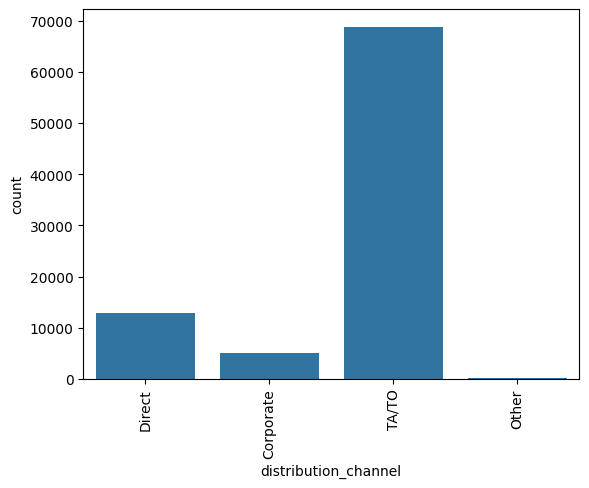

In [298]:
sns.countplot(x='distribution_channel', data=df)
plt.xticks(rotation=90)
plt.show()

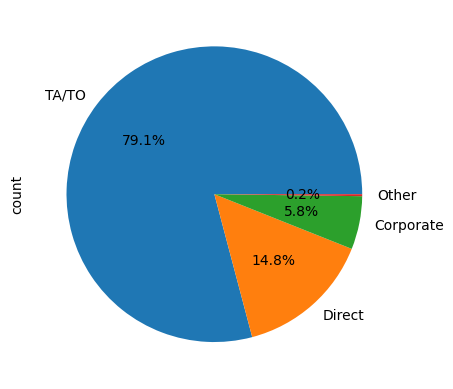

In [299]:
df['distribution_channel'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.show()

In [300]:
df['is_repeated_guest' ].value_counts()

,count
is_repeated_guest,
0,83637
1,3363


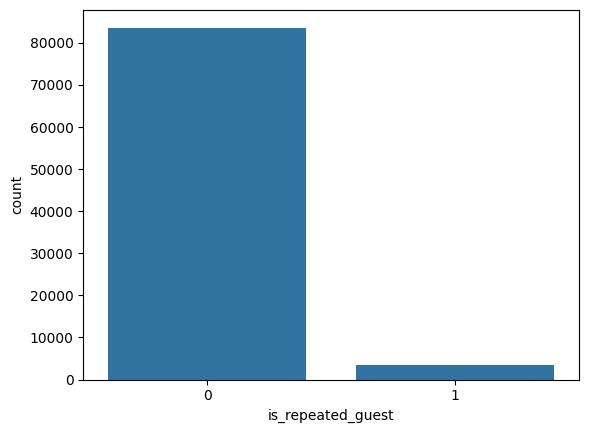

In [301]:
sns.countplot(x='is_repeated_guest', data=df)
plt.show()

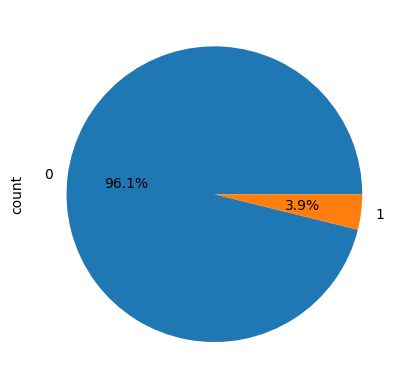

In [302]:
df['is_repeated_guest' ].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.show()

In [303]:
df['reserved_room_type'].value_counts()

,count
reserved_room_type,
A,56417
D,17375
E,6034
F,2818
G,2049
C,914
B,791
H,596
L,6


In [305]:
# Calculate the total occurrences
total_reserved_room_types = df['reserved_room_type'].value_counts()

# Define a threshold for low frequency (1% of total rows)
threshold = 0.01 * len(df)

# Identify low-frequency categories
low_freq_segments = total_reserved_room_types[total_reserved_room_types < threshold].index

# Replace low-frequency categories with "Other"
df['reserved_room_type'] = df['reserved_room_type'].apply(lambda x: 'Other' if x in low_freq_segments else x)

# Check the updated value counts
print(df['reserved_room_type'].value_counts())


reserved_room_type
A        56417
D        17375
E         6034
F         2818
G         2049
Other     1393
C          914
Name: count, dtype: int64


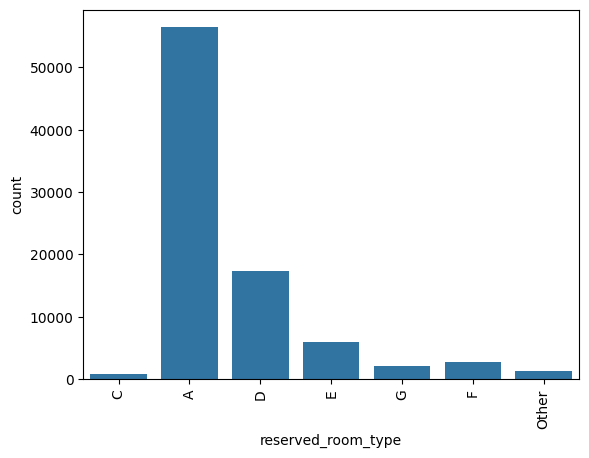

In [306]:
sns.countplot(x='reserved_room_type', data=df)
plt.xticks(rotation=90)
plt.show()

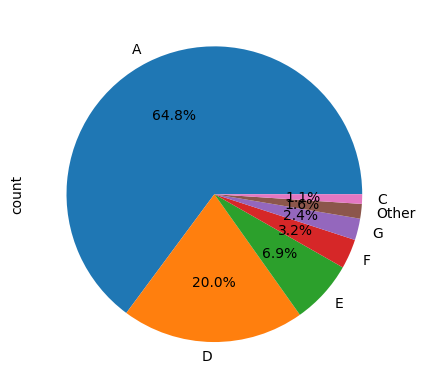

In [307]:
df['reserved_room_type'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.show()

In [308]:
df['assigned_room_type'].value_counts()

,count
assigned_room_type,
A,46241
D,22412
E,7190
F,3626
G,2494
C,2160
B,1632
H,706
I,353


In [310]:
# Calculate the total occurrences
total_assigned_room_types = df['assigned_room_type'].value_counts()

# Define a threshold for low frequency (1% of total rows)
threshold = 0.01 * len(df)

# Identify low-frequency categories
low_freq_segments = total_assigned_room_types[total_assigned_room_types < threshold].index

# Replace low-frequency categories with "Other"
df['assigned_room_type'] = df['assigned_room_type'].apply(lambda x: 'Other' if x in low_freq_segments else x)

# Check the updated value counts
print(df['assigned_room_type'].value_counts())


assigned_room_type
A        46241
D        22412
E         7190
F         3626
G         2494
C         2160
B         1632
Other     1245
Name: count, dtype: int64


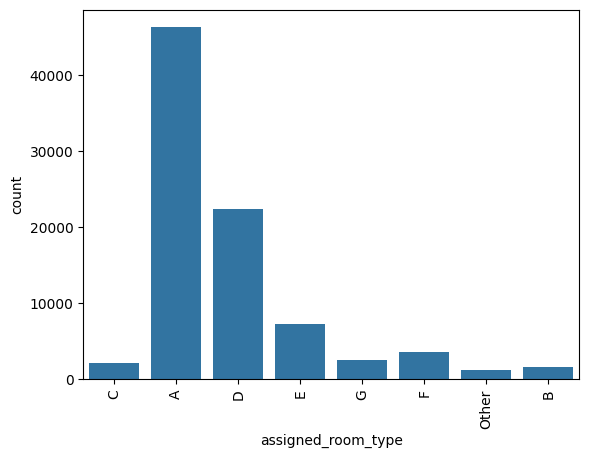

In [311]:
sns.countplot(x='assigned_room_type', data=df)
plt.xticks(rotation=90)
plt.show()

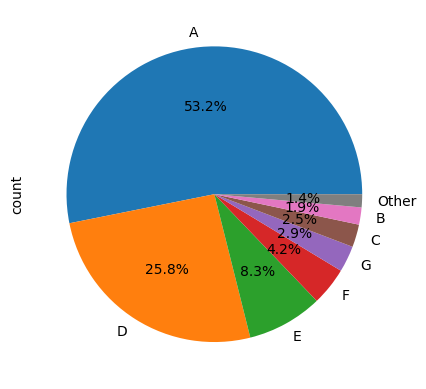

In [312]:
df['assigned_room_type'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.show()

In [313]:
df['deposit_type'].value_counts()

,count
deposit_type,
No Deposit,85855
Non Refund,1038
Refundable,107


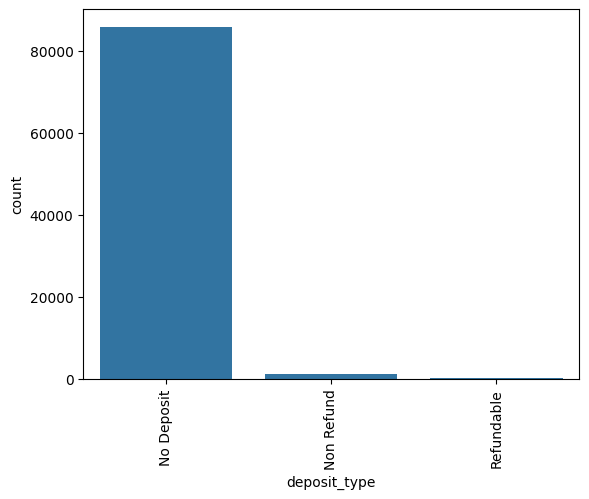

In [314]:
sns.countplot(x='deposit_type', data=df)
plt.xticks(rotation=90)
plt.show()

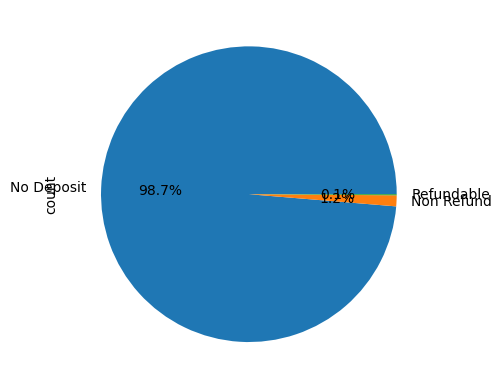

In [315]:
df['deposit_type'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.show()

In [316]:
df['customer_type'].value_counts()

,count
customer_type,
Transient,71719
Transient-Party,11607
Contract,3134
Group,540


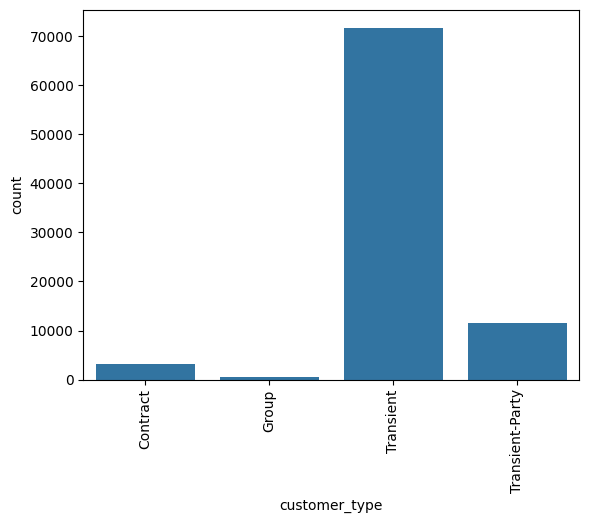

In [317]:
sns.countplot(x='customer_type', data=df)
plt.xticks(rotation=90)
plt.show()

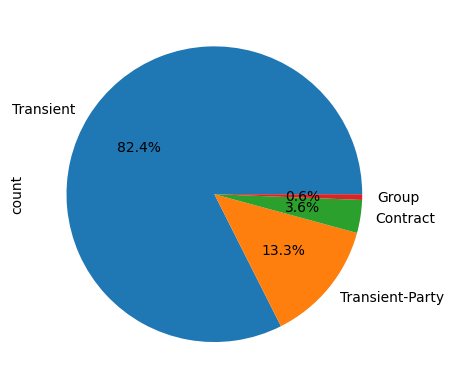

In [318]:
df['customer_type'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.show()

In [319]:
df['adr'].value_counts()

,count
adr,
High,68757
Very High,16308
Low,1655
Medium,279


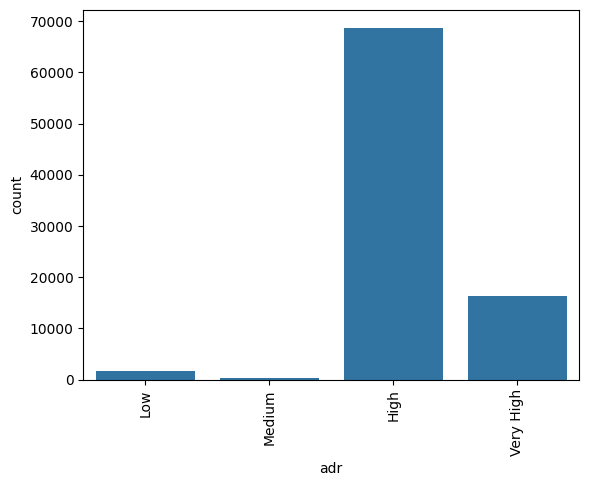

In [320]:
sns.countplot(x='adr', data=df)
plt.xticks(rotation=90)
plt.show()

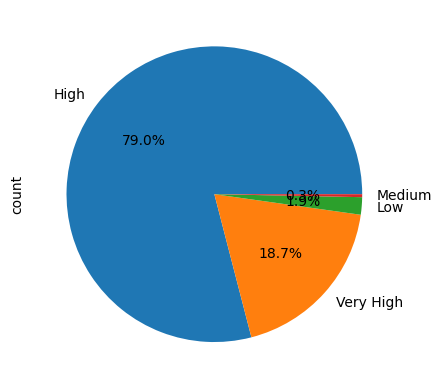

In [321]:
df['adr'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.show()

In [322]:
df['required_car_parking_spaces'].value_counts()

,count
required_car_parking_spaces,
No Parking,79696
1 Parking,7271
More than 1 Parking,33


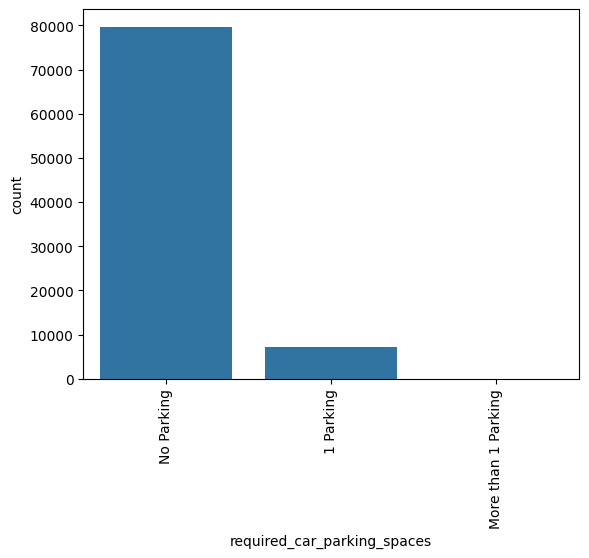

In [323]:
sns.countplot(x='required_car_parking_spaces', data=df)
plt.xticks(rotation=90)
plt.show()

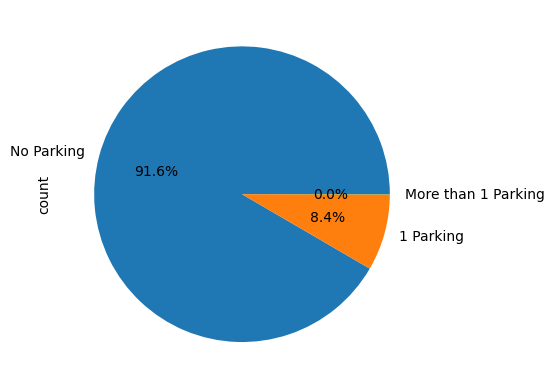

In [324]:
df['required_car_parking_spaces'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.show()

In [325]:
df['reservation_status'].value_counts()

,count
reservation_status,
Check-Out,63072
Canceled,22918
No-Show,1010


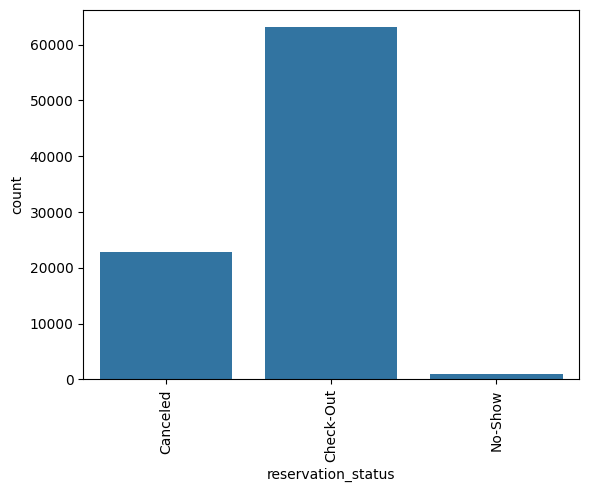

In [326]:
sns.countplot(x='reservation_status', data=df)
plt.xticks(rotation=90)
plt.show()

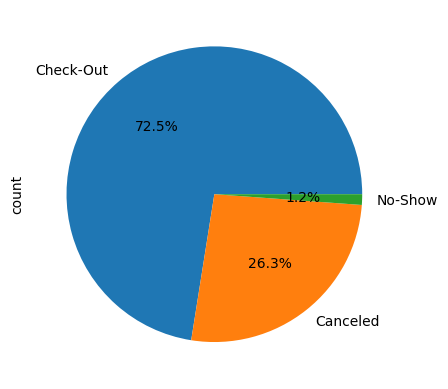

In [327]:
df['reservation_status'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.show()

In [329]:
df.shape

(87000, 32)

In [330]:
df.drop(columns=['booking_changes_binned'], inplace=True)

In [331]:
df.shape

(87000, 31)

In [328]:
df['reservation_status_date'].value_counts()

,count
reservation_status_date,
2016-02-14,211
2017-05-25,203
2015-10-21,198
2016-10-06,196
2016-03-28,195
...,...
2015-02-27,1
2015-03-11,1
2015-03-12,1


In [332]:
df['year'] = df['reservation_status_date'].dt.year
df['month'] = df['reservation_status_date'].dt.month
df['day_of_week'] = df['reservation_status_date'].dt.dayofweek

print(df['year'].value_counts())  # Analyze yearly trends
print(df['month'].value_counts())  # Analyze monthly trends


year
2016    43686
2017    29802
2015    13500
2014       12
Name: count, dtype: int64
month
8     9227
7     8800
5     8172
3     8124
4     7809
6     7342
2     7016
9     6887
10    6831
1     6450
11    5601
12    4741
Name: count, dtype: int64


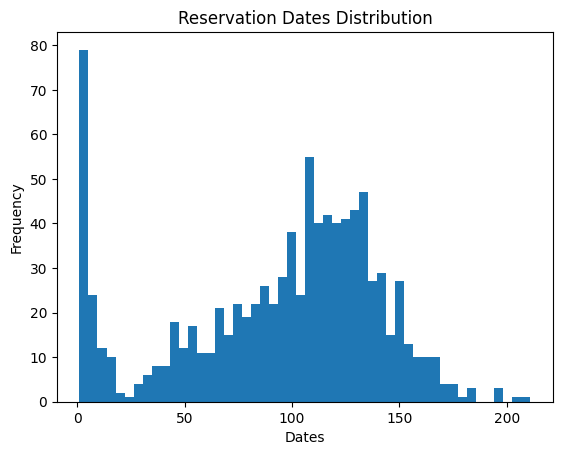

In [333]:

df['reservation_status_date'].value_counts().plot(kind='hist', bins=50)
plt.title('Reservation Dates Distribution')
plt.xlabel('Dates')
plt.ylabel('Frequency')
plt.show()


In [334]:
print(df['reservation_status_date'].min(), df['reservation_status_date'].max())


2014-10-17 00:00:00 2017-09-14 00:00:00


# Normalize or scale

In [338]:
df.describe()

,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,days_in_waiting_list,total_of_special_requests,reservation_status_date,year,month,day_of_week
count,87000.000000,87000.000000,87000.000000,87000.000000,8.700000e+04,87000.00000,87000.000000,87000.000000,87000.000000,87000.000000,87000.000000,87000,87000.000000,87000.000000,87000.000000
mean,0.000550,1.004724,1.150371,1.042069,4.181585e-17,0.03046,0.040655,1.155772,96.771586,1.038819,0.421773,2016-08-31 04:06:12.413793024,2016.187103,6.266828,2.985874
min,-1.871211,0.000000,0.000000,0.693147,-3.213889e-01,0.00000,0.000000,1.000000,0.000000,1.000000,0.000000,2014-10-17 00:00:00,2014.000000,1.000000,0.000000
25%,-0.771135,0.000000,0.693147,1.098612,-3.213889e-01,0.00000,0.000000,1.000000,9.000000,1.000000,0.000000,2016-03-18 00:00:00,2016.000000,4.000000,1.000000
50%,0.143615,1.000000,1.098612,1.098612,-3.213889e-01,0.00000,0.000000,1.000000,14.000000,1.000000,0.000000,2016-09-08 00:00:00,2016.000000,6.000000,3.000000
75%,0.826281,2.000000,1.609438,1.098612,-3.213889e-01,0.00000,0.000000,1.000000,240.000000,1.000000,0.693147,2017-03-06 00:00:00,2017.000000,9.000000,5.000000
max,2.308906,19.000000,2.983874,4.025352,3.111723e+00,26.00000,1.000000,3.944439,535.000000,6.971262,1.791759,2017-09-14 00:00:00,2017.000000,12.000000,6.000000
std,0.998922,1.027720,0.528498,0.185980,1.000006e+00,0.36980,0.197491,0.352469,115.665843,0.402094,0.454154,NaN,0.680642,3.229772,2.006712


In [336]:
numerical_data

Index(['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights',
       'adults', 'children', 'babies', 'previous_cancellations',
       'previous_bookings_not_canceled', 'booking_changes', 'agent',
       'days_in_waiting_list', 'adr', 'required_car_parking_spaces',
       'total_of_special_requests'],
      dtype='object')

In [337]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 87000 entries, 0 to 119389
Data columns (total 34 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   hotel                           87000 non-null  category      
 1   is_canceled                     87000 non-null  category      
 2   lead_time                       87000 non-null  float64       
 3   arrival_date_year               87000 non-null  category      
 4   arrival_date_month              87000 non-null  category      
 5   arrival_date_week_number        87000 non-null  category      
 6   arrival_date_day_of_month       87000 non-null  category      
 7   stays_in_weekend_nights         87000 non-null  int64         
 8   stays_in_week_nights            87000 non-null  float64       
 9   adults                          87000 non-null  float64       
 10  children                        87000 non-null  float64       
 11  babies

In [339]:
from sklearn.preprocessing import RobustScaler

# Numeric columns for scaling
numeric_columns = [
    'lead_time', 'stays_in_week_nights', 'adults', 'children',
    'booking_changes', 'days_in_waiting_list', 'total_of_special_requests'
]

rbs = RobustScaler()

# Loop over each column, scale it, and store it back in the DataFrame
for col in numeric_columns:
    # Reshape the column to 2D and apply transformation
    df[col] = rbs.fit_transform(df[[col]])  # Use double brackets to create a 2D array (DataFrame)

# Now df contains scaled columns for each numeric feature


In [340]:
df.sample(10)

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,year,month,day_of_week
2193,Resort Hotel,0,0.150702,2015,October,41,4,2,0.313964,0.000000,...,0.0,Transient,High,No Parking,1.0,Check-Out,2015-10-09,2015,10,4
55775,City Hotel,1,0.681121,2016,August,34,20,8,2.014455,0.000000,...,0.0,Transient,High,No Parking,1.0,Canceled,2016-06-19,2016,6,6
55540,City Hotel,1,0.485651,2016,August,34,15,1,0.756471,0.000000,...,0.0,Transient,High,No Parking,0.0,Canceled,2016-03-28,2016,3,0
60836,City Hotel,1,-0.931962,2016,November,48,23,6,2.014455,0.000000,...,0.0,Transient,High,No Parking,0.0,Canceled,2016-11-23,2016,11,2
53750,City Hotel,1,0.403759,2016,June,27,28,2,0.756471,0.000000,...,0.0,Transient,High,No Parking,0.0,Canceled,2016-03-02,2016,3,2
59547,City Hotel,1,-0.516263,2016,October,44,29,0,-0.442507,0.000000,...,0.0,Transient,High,No Parking,1.0,Canceled,2016-10-20,2016,10,3
99334,City Hotel,0,-0.421396,2016,October,42,9,2,-0.442507,0.000000,...,0.0,Transient,High,No Parking,0.0,Check-Out,2016-10-12,2016,10,2
61354,City Hotel,1,0.251077,2016,December,50,8,0,0.313964,0.000000,...,0.0,Transient,Very High,No Parking,0.0,Canceled,2016-09-13,2016,9,1
106866,City Hotel,0,-0.443289,2017,March,9,3,0,-0.442507,-0.405465,...,0.0,Transient,High,No Parking,0.0,Check-Out,2017-03-04,2017,3,5
3878,Resort Hotel,1,-0.027089,2016,February,6,3,7,2.057493,-0.405465,...,0.0,Transient-Party,High,No Parking,1.0,Canceled,2016-01-15,2016,1,4


In [343]:
categorical_data = df.select_dtypes(include=['object','category'])
categorical_data.head()

,hotel,is_canceled,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,reserved_room_type,assigned_room_type,deposit_type,customer_type,adr,required_car_parking_spaces,reservation_status
0,Resort Hotel,0,2015,July,27,1,0.021116,BB,High Frequency,Direct,Direct,0,C,C,No Deposit,Transient,Low,No Parking,Check-Out
1,Resort Hotel,0,2015,July,27,1,0.021116,BB,High Frequency,Direct,Direct,0,C,C,No Deposit,Transient,Low,No Parking,Check-Out
2,Resort Hotel,0,2015,July,27,1,0.021116,BB,High Frequency,Direct,Direct,0,A,C,No Deposit,Transient,High,No Parking,Check-Out
3,Resort Hotel,0,2015,July,27,1,0.021116,BB,High Frequency,Corporate,Corporate,0,A,A,No Deposit,Transient,High,No Parking,Check-Out
4,Resort Hotel,0,2015,July,27,1,0.021116,BB,High Frequency,Online TA,TA/TO,0,A,A,No Deposit,Transient,High,No Parking,Check-Out


In [344]:
categorical_data.columns

Index(['hotel', 'is_canceled', 'arrival_date_year', 'arrival_date_month',
       'arrival_date_week_number', 'arrival_date_day_of_month', 'babies',
       'meal', 'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'reserved_room_type', 'assigned_room_type',
       'deposit_type', 'customer_type', 'adr', 'required_car_parking_spaces',
       'reservation_status'],
      dtype='object')

In [341]:
df.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date', 'year', 'month',
       'day_of_week'],
      dtype='object')

# split Data

In [347]:
X = df.drop(columns=['is_canceled'])
y = df['is_canceled']

In [349]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Using Pipeline and Column Transformer

##### we can fill missing values

##### ,handle categorical data ,

#####  scale our data in a single way

 #####  using pipeline and column Transformer

In [346]:

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, OneHotEncoder,FunctionTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

# Initialize the LabelEncoder for ordinal columns
le = LabelEncoder()

# Ordinal columns to apply LabelEncoding
ordinal_cols = ['is_canceled', 'arrival_date_year', 'arrival_date_month',
                'arrival_date_week_number', 'arrival_date_day_of_month',
                'is_repeated_guest', 'required_car_parking_spaces']

# Nominal columns to apply OneHotEncoding
nominal_cols = ['hotel', 'babies', 'meal', 'country', 'market_segment',
                'distribution_channel', 'reserved_room_type',
                'assigned_room_type', 'deposit_type', 'customer_type', 'reservation_status']

# Define the preprocessing for different column types
preprocessor = ColumnTransformer(
    transformers=[
        # Apply LabelEncoder to ordinal columns
        ('ordinal', Pipeline([
            ('imputer', SimpleImputer(strategy='most_frequent')),  # Fill missing values
            ('label_encoder', FunctionTransformer(lambda x: x.apply(le.fit_transform)))
        ]), ordinal_cols),

        # Apply OneHotEncoder to nominal columns
        ('nominal', Pipeline([
            ('imputer', SimpleImputer(strategy='most_frequent')),  # Fill missing values
            ('onehot', OneHotEncoder(handle_unknown='ignore', drop='first'))  # OneHot Encoding
        ]), nominal_cols),

        # Apply Standard Scaler to numerical columns (or any other scaling method)
        ('scaler', Pipeline([
            ('imputer', SimpleImputer(strategy='mean')),  # Fill missing values with mean
            ('scaler', StandardScaler())  # Scaling the numerical data
        ]), ['lead_time', 'stays_in_week_nights', 'adults', 'children',
             'booking_changes', 'days_in_waiting_list', 'total_of_special_requests'])
    ])

# Creating the pipeline for the whole preprocessing step
preprocessing_pipeline = Pipeline([
    ('preprocessor', preprocessor)
])








In [335]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 87000 entries, 0 to 119389
Data columns (total 34 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   hotel                           87000 non-null  category      
 1   is_canceled                     87000 non-null  category      
 2   lead_time                       87000 non-null  float64       
 3   arrival_date_year               87000 non-null  category      
 4   arrival_date_month              87000 non-null  category      
 5   arrival_date_week_number        87000 non-null  category      
 6   arrival_date_day_of_month       87000 non-null  category      
 7   stays_in_weekend_nights         87000 non-null  int64         
 8   stays_in_week_nights            87000 non-null  float64       
 9   adults                          87000 non-null  float64       
 10  children                        87000 non-null  float64       
 11  babies